In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import kaepora as kpora
import kaepora_plot as kplot
import spectral_analysis as sa
import matplotlib.pyplot as plt
import composite

In [119]:
sne, mjds = np.genfromtxt("../../Foundation/Spectra/csp_velocity_spectra.txt", unpack=True, dtype=str)
mjds = mjds.astype(float)
for i, sn in enumerate(sne):
    print sn, mjds[i]
print len(sne)

2009ad 54885.09
2005be 53467.31
2006x 53779.36
2007n 54129.33
2008bq 54562.98
2006ef 53971.5
2008hu 54810.23
2006gt 54003.25
2008ar 54534.34
2005ke 53698.22
2007a 54113.04
2006mr 54048.16
2005bg 53472.21
2007nq 54401.11
2004eo 53280.0
2008r 54496.03
2008bc 54545.15
2009dc 54949.0
2009y 54878.39
2009d 54840.11
2007s 54144.24
2007ax 54185.06
2008gp 54772.23
2006os 54061.18
2005a 53384.11
2006ax 53827.14
2008cf 54593.0
2008bf 54553.27
2005m 53405.21
2007bm 54228.2
2006et 54003.2
2007as 54178.07
2007ai 54171.39
2007bc 54202.14
2007ca 54228.25
2004ef 53262.11
2005ki 53699.32
2006hx 54018.27
2009ab 54886.05
2007ba 54199.24
2007hj 54355.24
2005kc 53698.08
2004gc 53335.22
2005bo 53479.24
2009aa 54878.34
2004ey 53303.06
2005iq 53698.12
2006d 53759.32
2004gs 53358.25
2007al 54172.25
2007ux 54468.32
2004dt 53241.0
2006fw 54005.16
2007le 54401.07
2008bz 54582.0
2005ku 53699.13
2005eq 53648.31
2005ag 53413.39
2008ia 54810.29
2005bl 53479.13
2006bh 53841.39
2008hv 54815.35
2006br 53851.21
2008gl 547

In [120]:
name_string = ''
for l in sne:
    name_string += "'" + l + "'"+ ','
name_string = name_string[:-1]
q = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where Spectra.SN in ({names}) and source = 'csp'".format(names=name_string)
print q
example_query = [q]

SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where Spectra.SN in ('2009ad','2005be','2006x','2007n','2008bq','2006ef','2008hu','2006gt','2008ar','2005ke','2007a','2006mr','2005bg','2007nq','2004eo','2008r','2008bc','2009dc','2009y','2009d','2007s','2007ax','2008gp','2006os','2005a','2006ax','2008cf','2008bf','2005m','2007bm','2006et','2007as','2007ai','2007bc','2007ca','2004ef','2005ki','2006hx','2009ab','2007ba','2007hj','2005kc','2004gc','2005bo','2009aa','2004ey','2005iq','2006d','2004gs','2007al','2007ux','2004dt','2006fw','2007le','2008bz','2005ku','2005eq','2005ag','2008ia','2005bl','2006bh','2008hv','2006br','2008gl','2009f','2005hj','2009ag','2007jg','2007on','2005am','2006gj','2008cd','2007af','2006is','2006lu','2008fp','2004gu','2005hc','2007bd','2006kf','2008c','2006ej','2005el','2006dd') and source = 'csp'


In [132]:
spec_array = kpora.grab(example_query[0], verbose=True, make_corr = False, db_file='../data/kaepora_v1.2.db')

553 Total Spectra found
553 spectra of SNe that have host reddening corrections
Arrays cleaned
Name Filename Source SNR Phase MJD MJD_max z Host Morphology Minwave Maxwave
2004dt SN04dt_040914_b01_DUP_WF.dat csp 33.3978090678 25.3969187922 53262.21 0.01973 10.0 3780.0 9006.0
2004dt SN04dt_040919_b01_DUP_WF.dat csp 11.1037404673 30.417855707 53267.33 0.01973 10.0 4496.0 9380.0
2004dt SN04dt_040920_b01_DUP_WF.dat csp 40.4237768673 31.2906357567 53268.22 0.01973 10.0 3780.0 9006.0
2004dt SN04dt_041024_b01_CLA_LD.dat csp 19.7027121031 64.6818275426 53302.27 0.01973 10.0 3584.0 8774.0
2004dt SN04dt_041204_b01_DUP_WF.dat csp 21.8147970586 104.770870721 53343.15 0.01973 10.0 3780.0 9006.0
2004ef SN04ef_040907_b01_DUP_MS.dat csp 20.3185386108 -8.15724768047 53255.16 0.030985 12.0 3720.0 7052.0
2004ef SN04ef_040908_b01_CLA_BC.dat csp 45.5215850456 -7.16790253964 53256.18 0.030985 12.0 3932.0 6916.0
2004ef SN04ef_040909_b01_CLA_LD.dat csp 29.0205144164 -6.11066116382 53257.27 0.030985 12.0 3594.

2006gt SN06gt_061013_b01_DUP_WF.dat csp 16.7335780226 19.8225257017 54021.19 0.044771 None 3690.0 8788.0
2006hx SN06hx_061005_g01_NTT_EM.dat csp 35.6585836023 -7.86326846457 54013.15 0.045494 8.0 3878.0 9706.0
2006hx SN06hx_061010_b01_DUP_WF.dat csp 40.6443484778 -2.96606197643 54018.27 0.045494 8.0 3688.0 8782.0
2006is SN06is_061001_b01_BAA_IM.dat csp 51.6970160574 1.40591064199 54009.34 None None 4100.0 10450.0
2006is SN06is_061005_b01_NTT_EM.dat csp 35.6746167486 5.29398076323 54013.35 None None 3156.0 5088.0
2006is SN06is_061005_g01_NTT_EM.dat csp 32.5238357442 5.30367669848 54013.36 None None 3932.0 9838.0
2006is SN06is_061005_r01_NTT_EM.dat csp 19.2553472259 5.31337263417 54013.37 None None 5676.0 9838.0
2006is SN06is_061008_b01_HIL_BC.dat csp 50.9690462564 9.30809804539 54017.49 None None 3690.0 6940.0
2006is SN06is_061010_b01_DUP_WF.dat csp 38.4373208318 10.1516444304 54018.36 None None 3738.0 8904.0
2006is SN06is_061011_b01_DUP_WF.dat csp 51.9306129817 11.1309339125 54019.37 N

2007on SN07on_071130_r01_3P6_EF.dat csp 303.835532904 14.9270563383 54434.2 0.00649449293351 3.0 5676.0 9150.0
2007on SN07on_071203_b01_DUP_WF.dat csp 165.147785573 17.88782763 54437.18 0.00649449293351 3.0 3828.0 9124.0
2007on SN07on_071209_b01_DUP_WF.dat csp 133.002349159 23.8789185323 54443.21 0.00649449293351 3.0 3828.0 9124.0
2007on SN07on_071210_b01_DUP_WF.dat csp 122.913375481 24.8625304717 54444.2 0.00649449293351 3.0 3828.0 9124.0
2007on SN07on_071218_b01_NTT_EM.dat csp 25.300865068 32.7612324075 54452.15 0.00649449293351 3.0 3232.0 5214.0
2007on SN07on_071218_g01_NTT_EM.dat csp 117.712216247 32.7811033558 54452.17 0.00649449293351 3.0 4028.0 10084.0
2007on SN07on_071218_r01_NTT_EM.dat csp 105.613380586 32.8009743041 54452.19 0.00649449293351 3.0 5816.0 10084.0
2007on SN07on_071227_b01_BAA_IM.dat csp 94.3090351437 41.812449343 54461.26 0.00649449293351 3.0 3828.0 6546.0
2007on SN07on_071227_r01_BAA_IM.dat csp 47.8551364449 41.812449343 54461.26 0.00649449293351 3.0 6708.0 9342

2009d SN09D_090329_b01_DUP_WF.dat csp 9.34837479617 76.9065667653 54919.0 None None 3760.0 8958.0
2009f SN09F_090105_b01_CLA_LD.dat csp 63.2004354239 -4.31706806621 54836.17 0.012956 None 3626.0 9258.0
2009f SN09F_090109_r01_NTT_EF.dat csp 48.4635606455 -0.328740833792 54840.21 0.012956 None 5226.0 9042.0
2009f SN09F_090110_r01_GEM_GM.dat csp 128.207288052 0.540003711764 54841.09 0.012956 None 3902.0 7966.0
2009f SN09F_090112_r01_GEM_GM.dat csp 262.490935819 2.50455103684 54843.08 0.012956 None 3854.0 8004.0
2009f SN09F_090209_r01_NTT_EF.dat csp 16.1981854336 30.1661671386 54871.1 0.012956 None 5226.0 9042.0
2009f SN09F_090214_b01_BAA_IM.dat csp 31.7426777937 35.072599402 54876.07 0.012956 None 4022.0 6280.0
2009f SN09F_090214_r01_BAA_IM.dat csp 52.2974688146 35.072599402 54876.07 0.012956 None 6520.0 9936.0
2009f SN09F_090225_b01_DUP_WF.dat csp 8.63839952948 46.0010109029 54887.14 0.012956 None 3804.0 9066.0
2009y SN09Y_090208_b01_CLA_LD.dat csp 146.565893265 -5.50847919402 54870.33 0

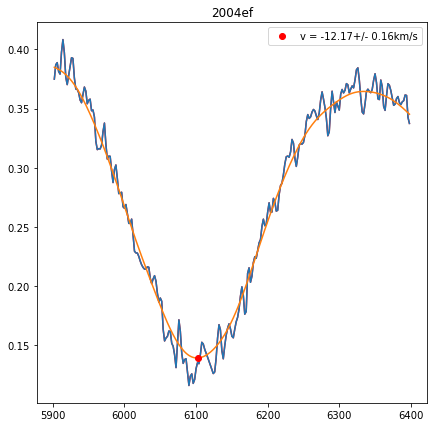

SN04ef_040914_b01_DUP_WF.dat 53262.11 53262.11 -1.41612147619
Velocity: (-12.172468233516442, 6102.0, 0.15843460374602636)


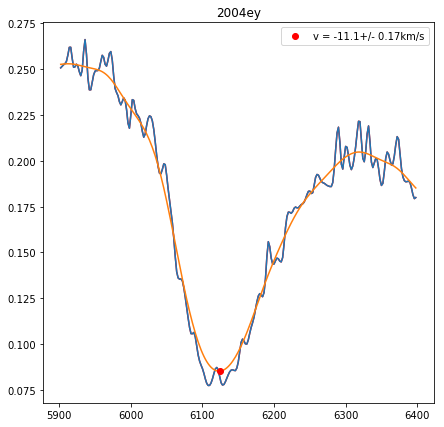

SN04ey_041025_b01_CLA_LD.dat 53303.06 53303.06 -0.290415500851
Velocity: (-11.095173645785795, 6124.0, 0.16906043998445297)


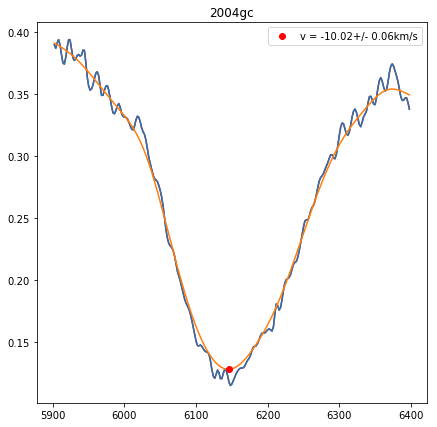

SN04gc_041126_b01_CLA_LD.dat 53335.22 53335.22 12.3884664987
Velocity: (-10.021456720684506, 6146.0, 0.06220965959256296)


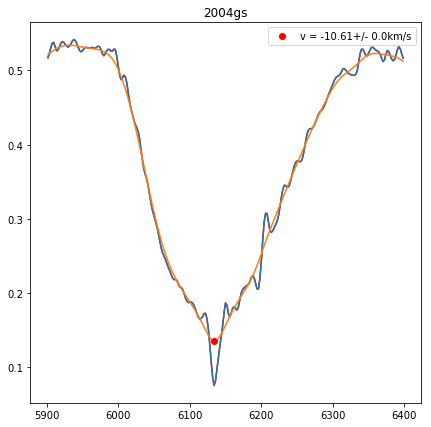

SN04gs_041219_b01_CLA_LD.dat 53358.25 53358.25 3.17103438207
Velocity: (-10.606676809804412, 6134.0, 0.0)


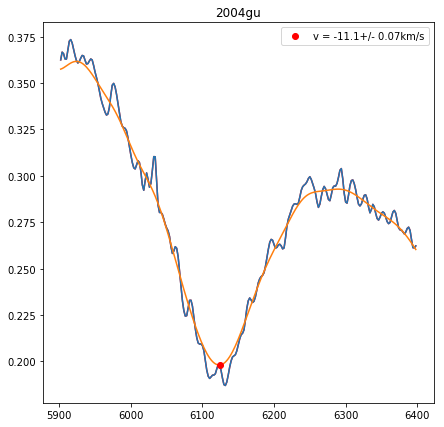

SN04gu_041219_b01_CLA_LD.dat 53358.33 53358.33 -3.66971073531
Velocity: (-11.095173645785795, 6124.0, 0.07087740968305643)


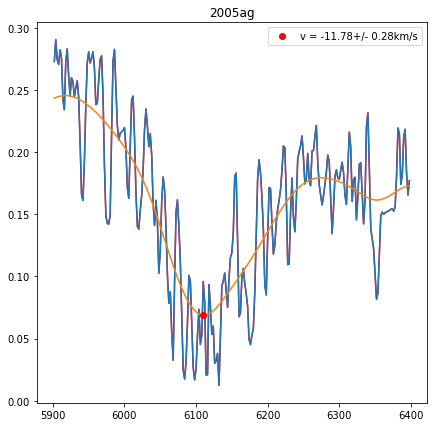

SN05ag_050212_b01_DUP_WF.dat 53413.39 53413.39 -0.861378297777
Velocity: (-11.780310993061766, 6110.0, 0.2750631944902162)


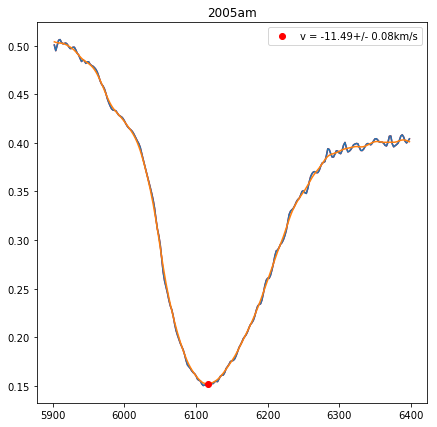

SN05am_050315_b01_DUP_WF.dat 53444.09 53444.09 10.08831242
Velocity: (-11.486503345380463, 6116.0, 0.07810402817945845)
SN05A_050114_b01_P20_DB.dat 53384.11 53384.11 7.1033264644
Velocity: (nan, nan)


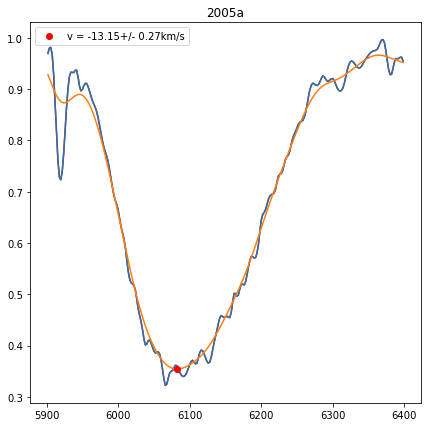

SN05A_050114_r01_P20_DB.dat 53384.11 53384.11 7.1033264644
Velocity: (-13.15492891074885, 6082.0, 0.2672468876346564)


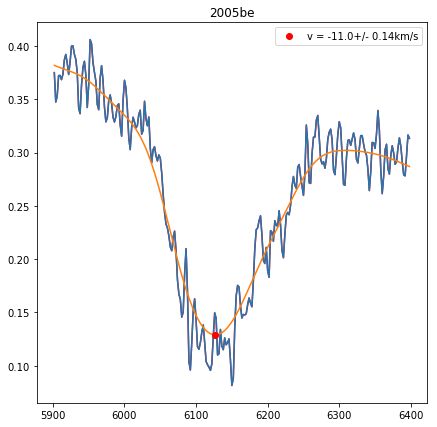

SN05be_050407_b01_DUP_WF.dat 53467.31 53467.31 10.1913043479
Velocity: (-10.997415134434632, 6126.0, 0.13796252589278069)


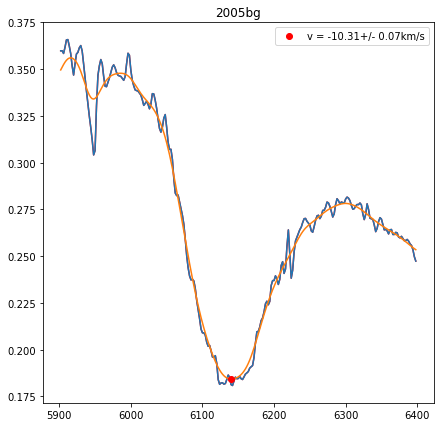

SN05bg_050412_b01_DUP_WF.dat 53472.21 53472.21 2.19043169388
Velocity: (-10.313933633529203, 6140.0, 0.07004016864751408)


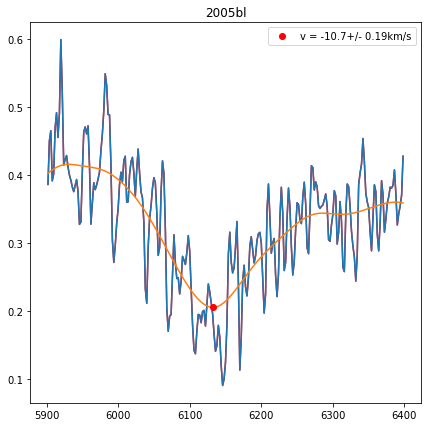

SN05bl_050419_b01_DUP_WF.dat 53479.13 53479.13 -3.57303283021
Velocity: (-10.704317028490788, 6132.0, 0.1882647603532589)


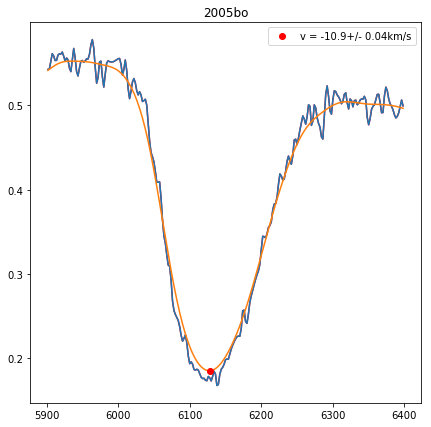

SN05bo_050419_b01_DUP_WF.dat 53479.24 53479.24 1.47746908975
Velocity: (-10.899686192972935, 6128.0, 0.04330241985403723)


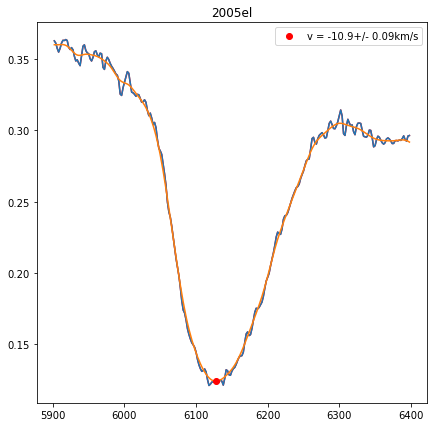

SN05el_051005_b01_DUP_WF.dat 53648.38 53648.38 2.1913273097
Velocity: (-10.899686192972935, 6128.0, 0.09068496046418947)


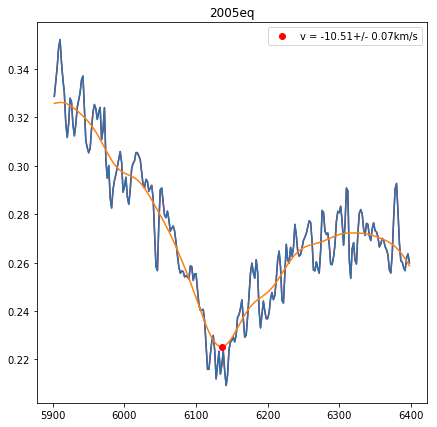

SN05eq_051005_b01_DUP_WF.dat 53648.31 53648.31 -5.69303298319
Velocity: (-10.50906616967564, 6136.0, 0.06546189070333128)


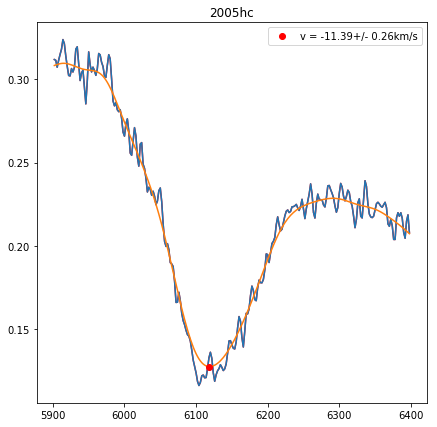

SN05hc_051024_b01_MGH_BC.dat 53667.28 53667.28 -0.445532248699
Velocity: (-11.388626576876426, 6118.0, 0.25874838215836715)


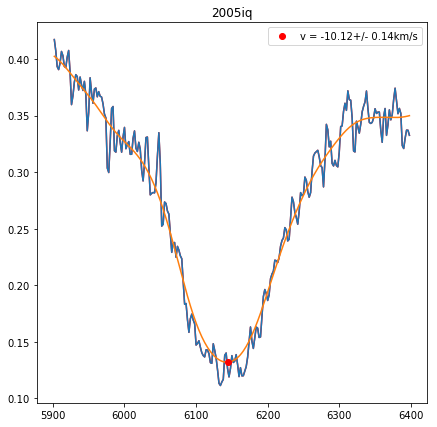

SN05iq_051124_b01_DUP_MS.dat 53698.12 53698.12 10.2703659327
Velocity: (-10.118919436719901, 6144.0, 0.1353556808812785)


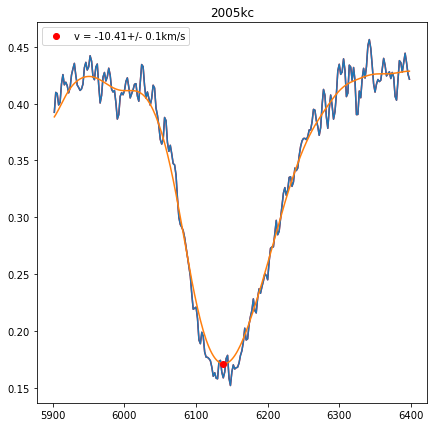

SN05kc_051124_b01_DUP_MS.dat 53698.08 53698.08 0.791039483088
Velocity: (-10.411485110219218, 6138.0, 0.1048250329636599)


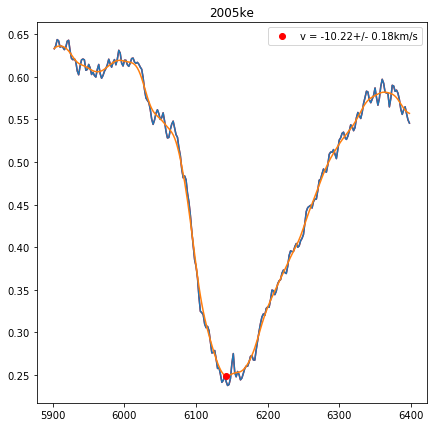

SN05ke_051124_b01_DUP_MS.dat 53698.22 53698.22 -0.982206830465
Velocity: (-10.216411741678657, 6142.0, 0.1844302791812927)


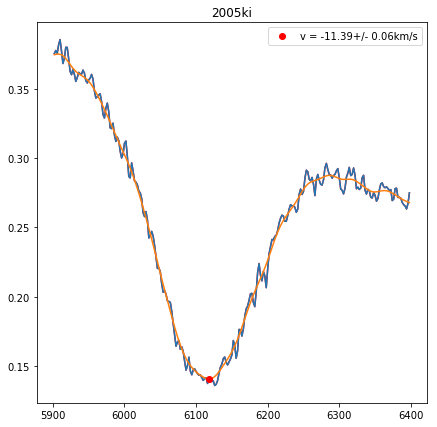

SN05ki_051125_b01_DUP_MS.dat 53699.32 53699.32 -5.9330440236
Velocity: (-11.388626576876426, 6118.0, 0.05952950487732491)


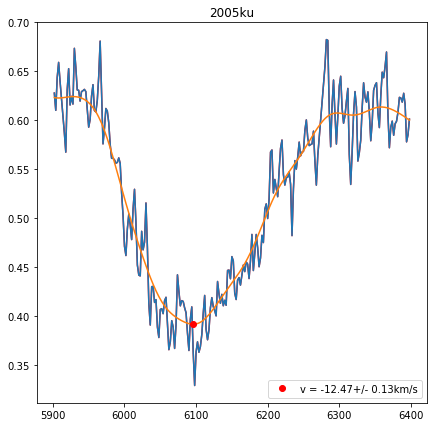

SN05ku_051125_b01_DUP_MS.dat 53699.13 53699.13 0.546182034425
Velocity: (-12.466896361799964, 6096.0, 0.13171664602105101)


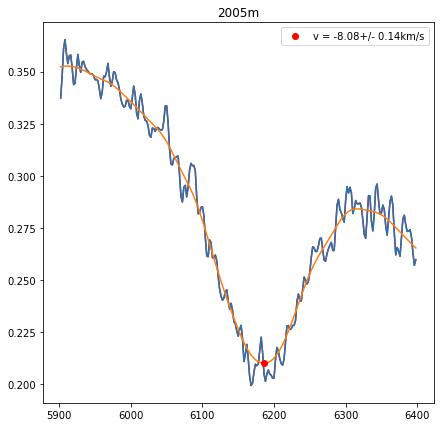

SN05M_050204_b01_DUP_WF.dat 53405.21 53405.21 0.492172211312
Velocity: (-8.078419020091943, 6186.0, 0.13804557775251658)


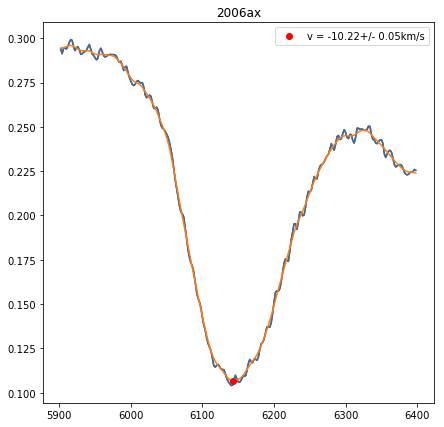

SN06ax_060402_b01_DUP_WF.dat 53827.14 53827.14 0.403249998404
Velocity: (-10.216411741678657, 6142.0, 0.048251427411691306)


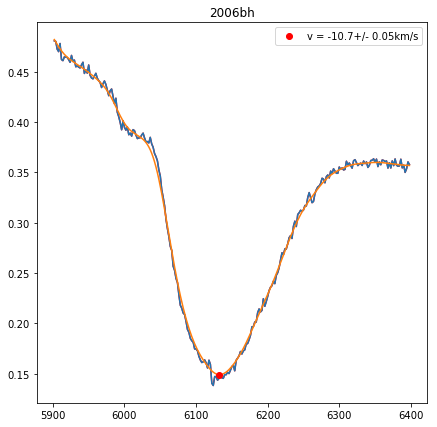

SN06bh_060416_b01_BAA_IM.dat 53841.39 53841.39 8.91826359492
Velocity: (-10.704317028490788, 6132.0, 0.05261817106825519)


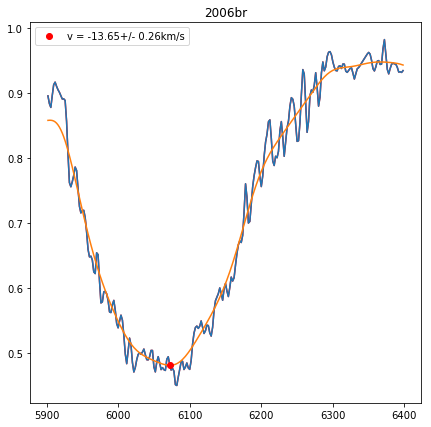

SN06br_060426_b01_DUP_WF.dat 53851.21 53851.21 26.0426121668
Velocity: (-13.647266267639992, 6072.0, 0.2579414576438719)


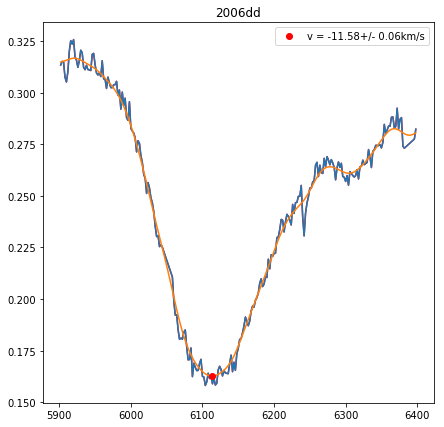

SN06dd_060621_b01_BAA_IM.dat 53907.42 53907.42 -11.4229472994
Velocity: (-11.584409672466169, 6114.0, 0.056175151731569464)


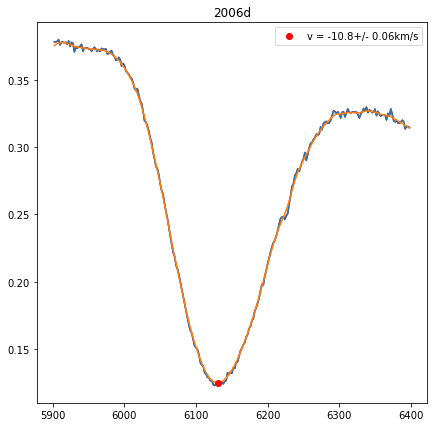

SN06D_060124_g01_CLA_LD.dat 53759.32 53759.32 2.78802300201
Velocity: (-10.801986823599174, 6130.0, 0.059755694851931766)


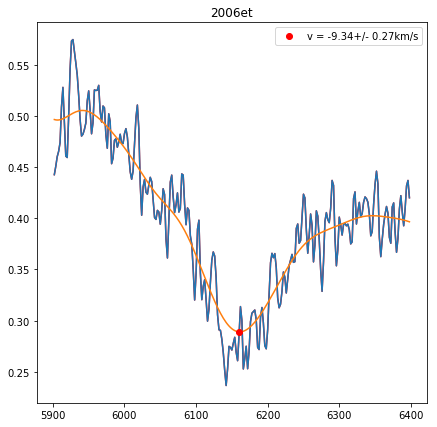

SN06et_060925_b01_DUP_WF.dat 54003.2 54003.2 9.04620301024
Velocity: (-9.340046364602408, 6160.0, 0.26553215417622233)


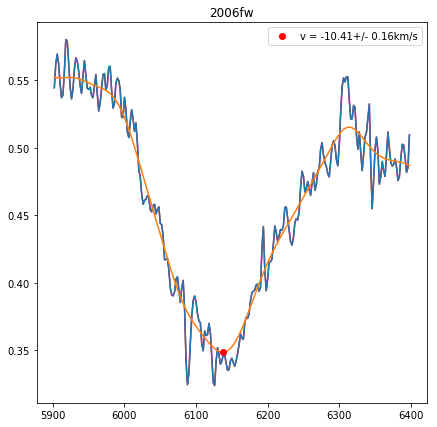

SN06fw_060927_b01_DUP_WF.dat 54005.16 54005.16 2.69621421969
Velocity: (-10.411485110219218, 6138.0, 0.16146691619189424)


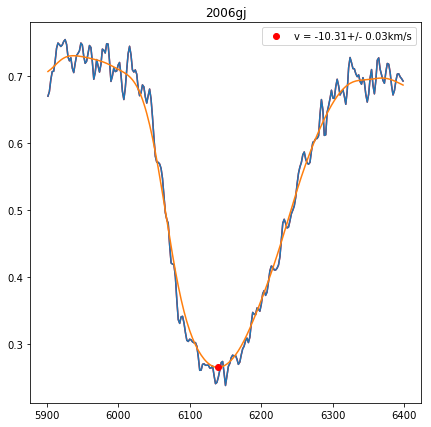

SN06gj_060925_b01_DUP_WF.dat 54003.35 54003.35 4.47732309769
Velocity: (-10.313933633529203, 6140.0, 0.029245193904773883)


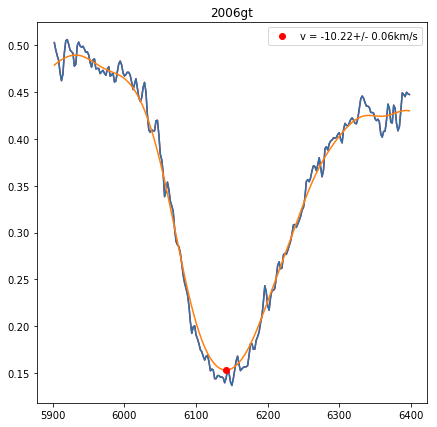

SN06gt_060925_b01_DUP_WF.dat 54003.25 54003.25 2.65129870565
Velocity: (-10.216411741678657, 6142.0, 0.06201234778191902)


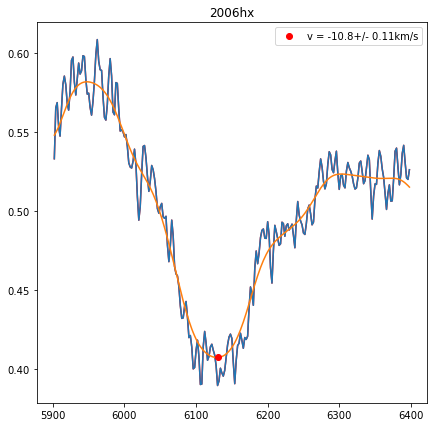

SN06hx_061010_b01_DUP_WF.dat 54018.27 54018.27 -2.96606197643
Velocity: (-10.801986823599174, 6130.0, 0.11003342552431905)


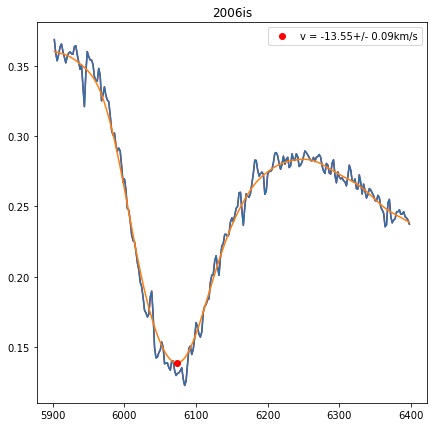

SN06is_061001_b01_BAA_IM.dat 54009.34 54009.34 1.40591064199
Velocity: (-13.548739780235412, 6074.0, 0.08548520686010512)


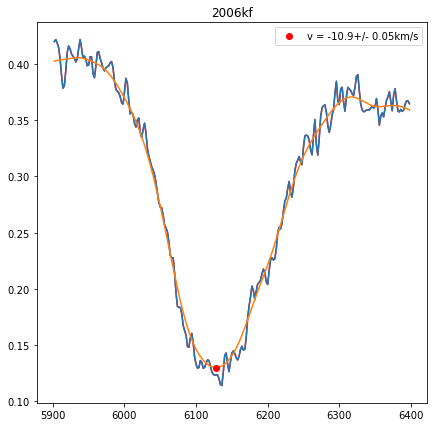

SN06kf_061103_b01_HIL_BC.dat 54043.33 54043.33 2.72103914524
Velocity: (-10.899686192972935, 6128.0, 0.04593948600257015)


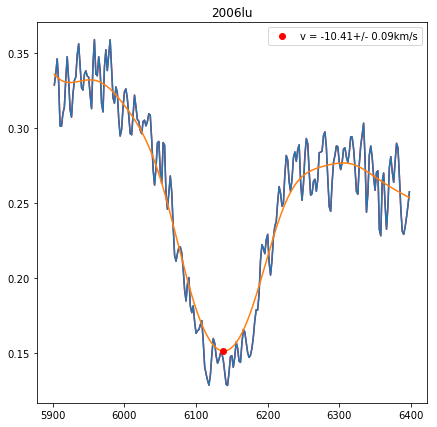

SN06lu_061103_g01_NTT_EM.dat 54042.32 54042.32 8.29694323121
Velocity: (-10.411485110219218, 6138.0, 0.08538605259297108)


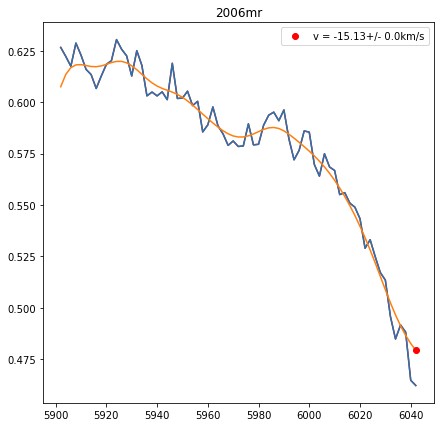

SN06mr_061109_b01_CLA_LD.dat 54048.15 54048.16 -2.4406708217
Velocity: (-15.128702271077849, 6042.0, 3.552713678800501e-15)


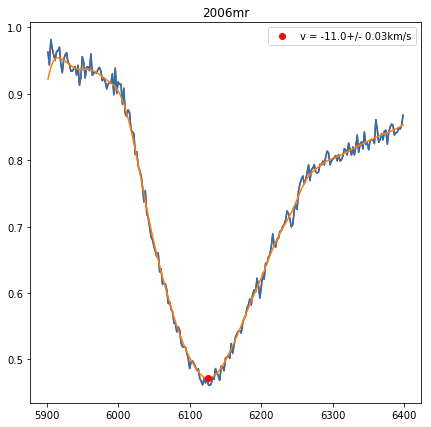

SN06mr_061109_r01_CLA_LD.dat 54048.16 54048.16 -2.43072918879
Velocity: (-10.997415134434632, 6126.0, 0.026521219305707385)


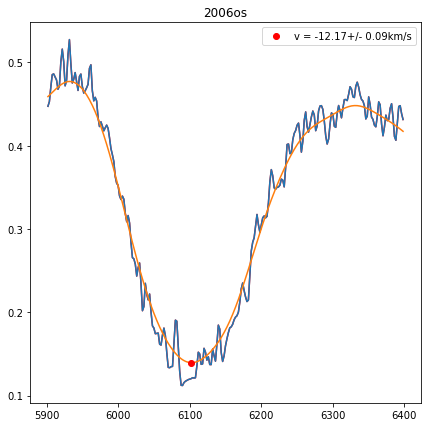

SN06os_061122_b01_DUP_WF.dat 54061.18 54061.18 -1.40296995847
Velocity: (-12.172468233516442, 6102.0, 0.09428978203847167)


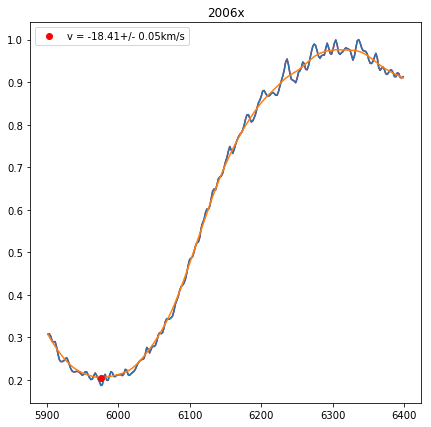

SN06X_060213_g01_NTT_EM.dat 53779.36 53779.36 -6.55863276445
Velocity: (-18.411176350635415, 5976.0, 0.04992954162662372)


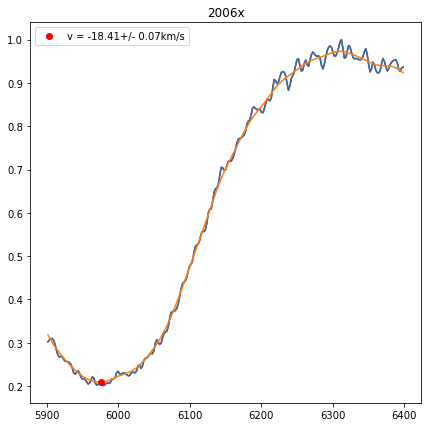

SN06X_060213_r01_NTT_EM.dat 53779.36 53779.36 -6.55863276445
Velocity: (-18.411176350635415, 5976.0, 0.0724835877734068)


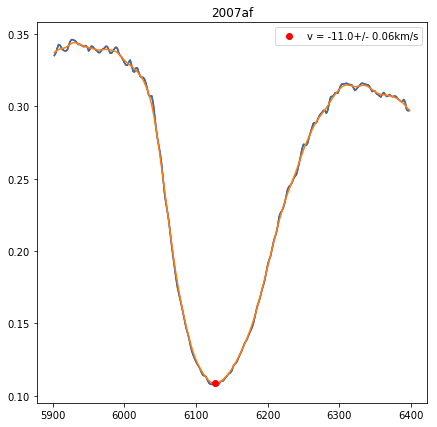

SN07af_070314_b01_DUP_BC.dat 54173.3 54173.31 -0.392853448941
Velocity: (-10.997415134434632, 6126.0, 0.06344059642160339)


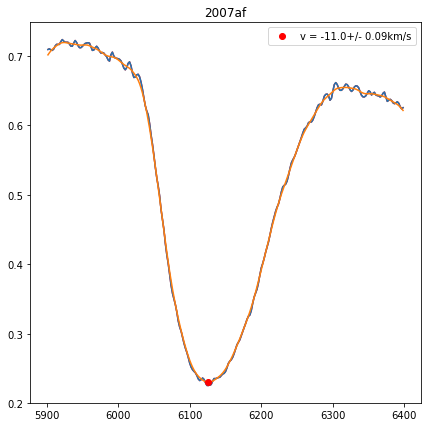

SN07af_070314_r01_DUP_BC.dat 54173.31 54173.31 -0.38290779177
Velocity: (-10.997415134434632, 6126.0, 0.08670723799746782)


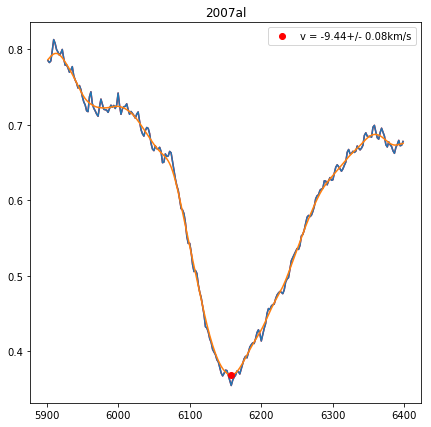

SN07al_070313_g01_BAA_IM.dat 54172.25 54172.25 3.72070047176
Velocity: (-9.437301903025991, 6158.0, 0.08215910837982089)


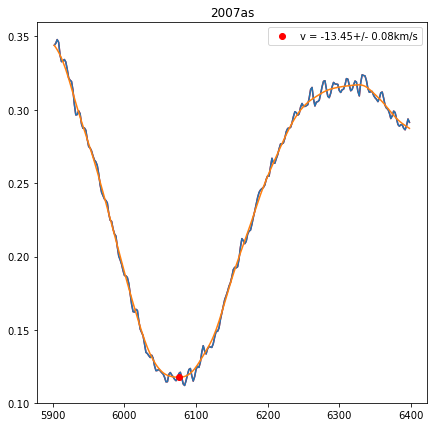

SN07as_070319_b01_DUP_BC.dat 54178.07 54178.07 -1.30211916225
Velocity: (-13.450242798100463, 6076.0, 0.07815959186512263)


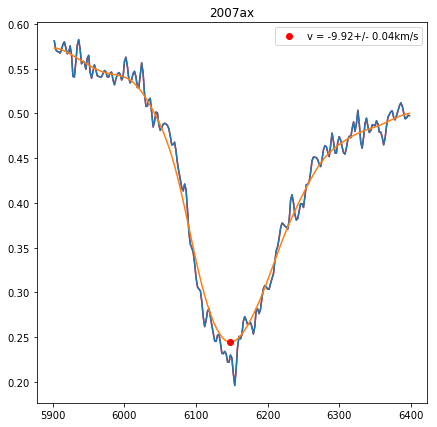

SN07ax_070326_b01_DUP_BC.dat 54185.06 54185.06 -1.39937509802
Velocity: (-9.92402359558339, 6148.0, 0.04324321931427076)


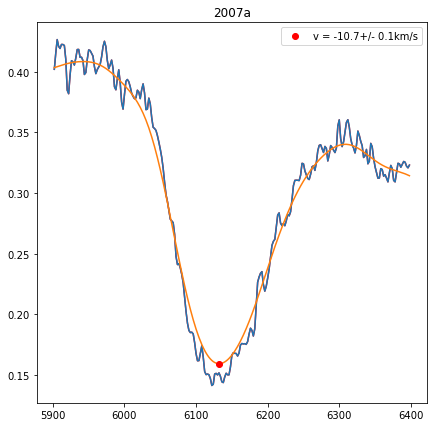

SN07A_070113_b01_DUP_BC.dat 54113.04 54113.04 0.311670435591
Velocity: (-10.704317028490788, 6132.0, 0.09908429551632235)


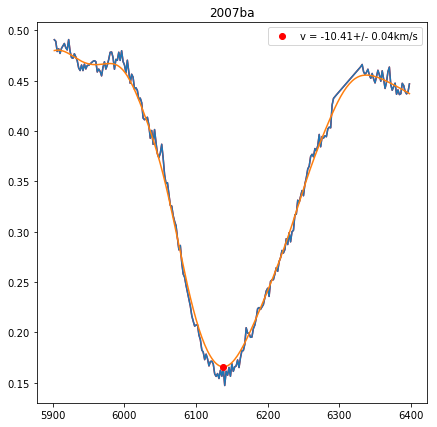

SN07ba_070409_b01_BAA_IM.dat 54199.24 54199.24 8.86748649292
Velocity: (-10.411485110219218, 6138.0, 0.043800504401747965)


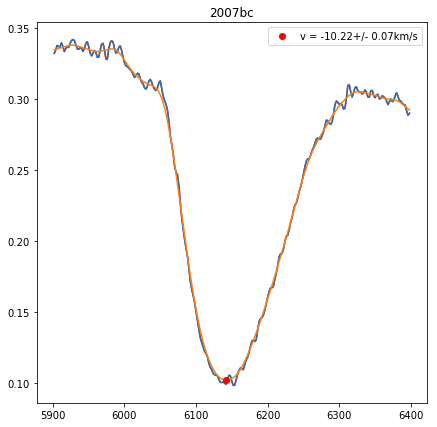

SN07bc_070412_b01_DUP_WF.dat 54202.14 54202.14 2.50587774307
Velocity: (-10.216411741678657, 6142.0, 0.07295181642735227)


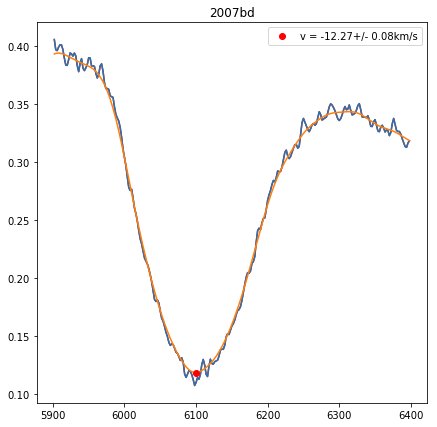

SN07bd_070417_b01_DUP_WF.dat 54207.09 54207.09 0.591711384379
Velocity: (-12.270581404388267, 6100.0, 0.07913616347836129)


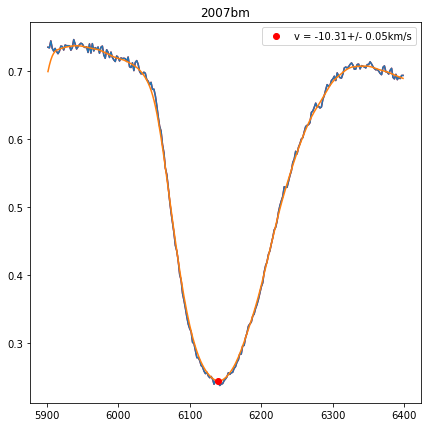

SN07bm_070508_b01_BAA_IM.dat 54228.2 54228.2 4.12338962721
Velocity: (-10.313933633529203, 6140.0, 0.046514977816289715)


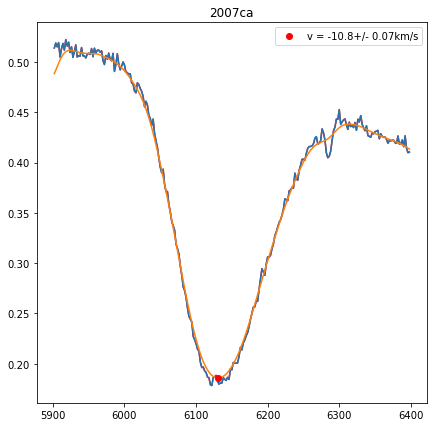

SN07ca_070508_b01_BAA_IM.dat 54228.25 54228.25 1.52948624646
Velocity: (-10.801986823599174, 6130.0, 0.0682953746302585)


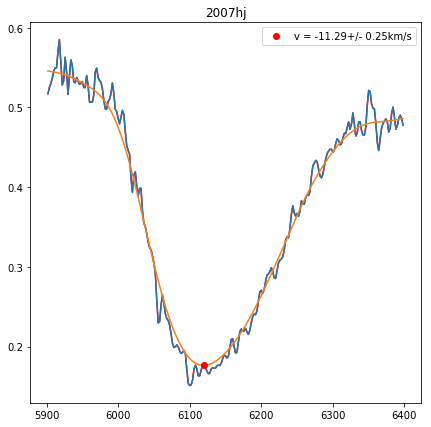

SN07hj_070912_b01_DUP_BC.dat 54355.24 54355.24 6.25176878733
Velocity: (-11.290779369257717, 6120.0, 0.25027501977654665)


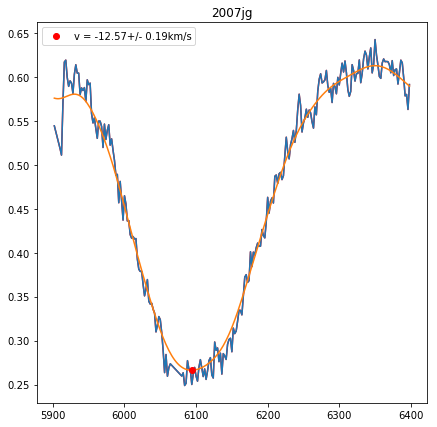

SN07jg_070922_b01_CLA_LD.dat 54365.38 54365.38 -0.61997953982
Velocity: (-12.565098143327868, 6094.0, 0.1917378470786205)


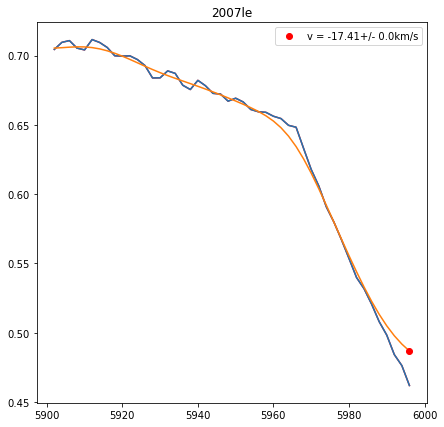

SN07le_071028_b01_CLA_LD.dat 54401.09 54401.07 3.1587699073
Velocity: (-17.413106748496762, 5996.0, 7.105427357601002e-15)


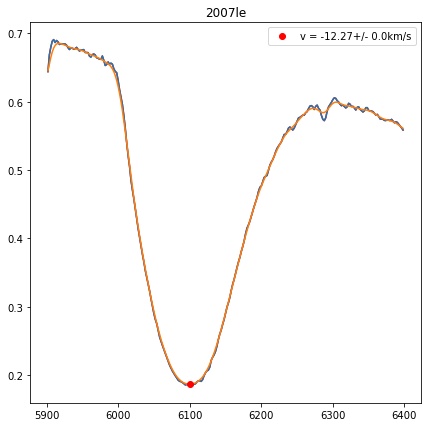

SN07le_071028_g01_CLA_LD.dat 54401.07 54401.07 3.13890342988
Velocity: (-12.270581404388267, 6100.0, 3.552713678800501e-15)


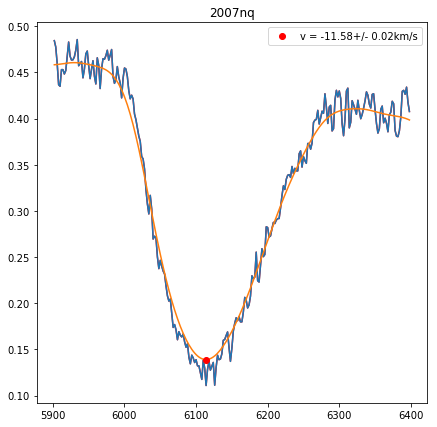

SN07nq_071028_g01_CLA_LD.dat 54401.11 54401.11 4.25441924677
Velocity: (-11.584409672466169, 6114.0, 0.01670156826490633)


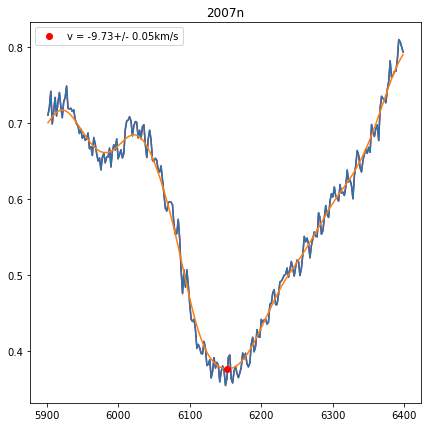

SN07N_070129_b01_BAA_IM.dat 54129.33 54129.33 7.56457650227
Velocity: (-9.729246126124085, 6152.0, 0.05406132005802326)


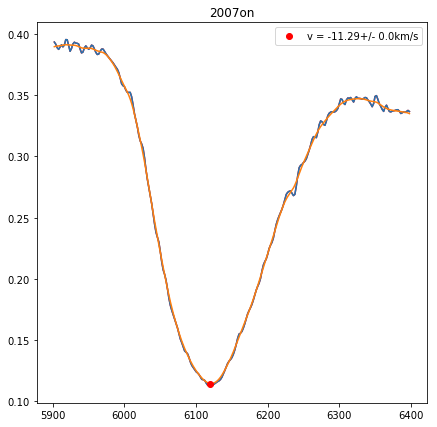

SN07on_071114_b01_DUP_WF.dat 54418.34 54418.34 -0.830605637704
Velocity: (-11.290779369257717, 6120.0, 1.7763568394002505e-15)


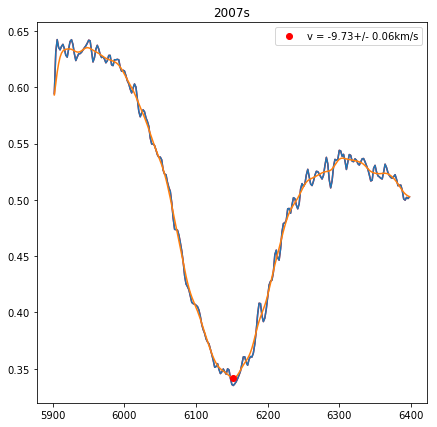

SN07S_070213_b01_DUP_WF.dat 54144.24 54144.24 0.363941217304
Velocity: (-9.729246126124085, 6152.0, 0.059042114927319395)


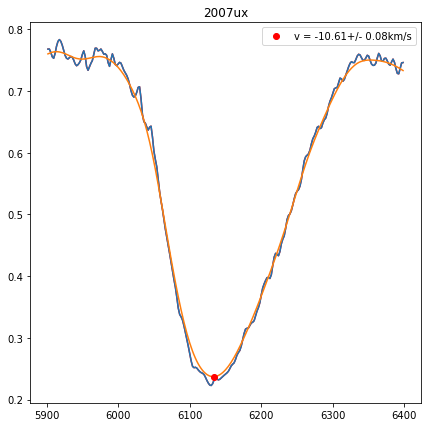

SN07ux_080103_r01_3P6_EF.dat 54468.32 54468.32 7.68249564691
Velocity: (-10.606676809804412, 6134.0, 0.07748823020857555)


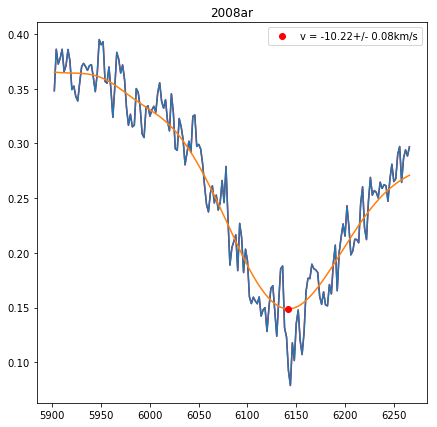

SN08ar_080309_b01_BAA_IM.dat 54534.34 54534.34 0.233884618727
Velocity: (-10.216411741678657, 6142.0, 0.0795752509739021)
SN08ar_080309_r01_BAA_IM.dat 54534.34 54534.34 0.233884618727
Velocity: (nan, nan)


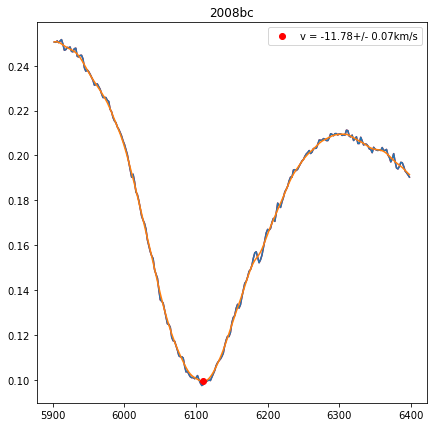

SN08bc_080320_b01_CLA_LD.dat 54545.15 54545.15 -3.71987819772
Velocity: (-11.780310993061766, 6110.0, 0.06741643523142643)
SN08bf_080328_b01_NTT_EM.dat 54553.25 54553.27 -1.32246730432
Velocity: (nan, nan)


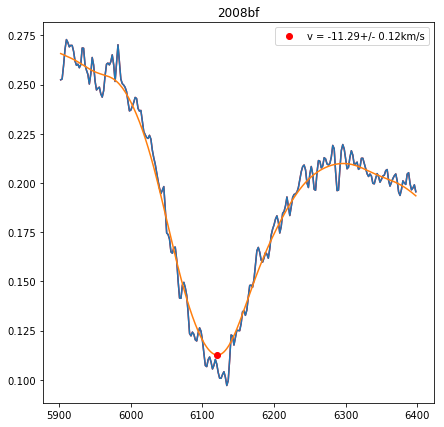

SN08bf_080328_g01_NTT_EM.dat 54553.27 54553.27 -1.30294749169
Velocity: (-11.290779369257717, 6120.0, 0.11824712635399726)


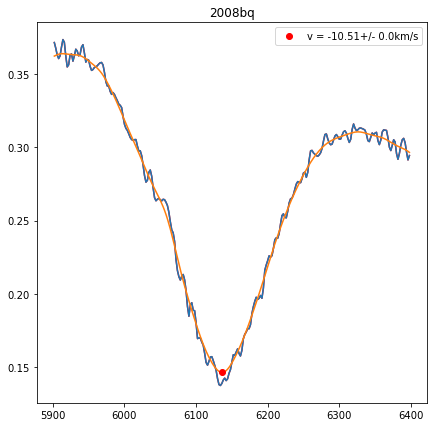

SN08bq_080407_b01_DUP_WF.dat 54562.98 54562.98 1.10250704297
Velocity: (-10.50906616967564, 6136.0, 0.0)


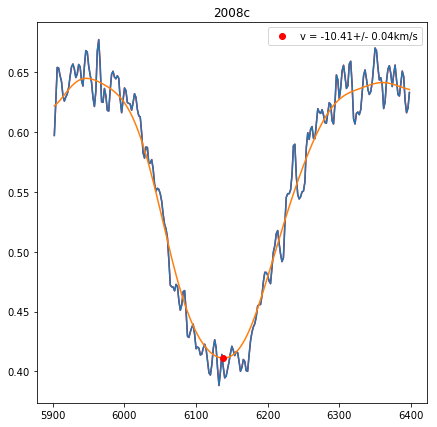

SN08C_080105_b01_DUP_BC.dat 54470.2 54470.2 5.68928220274
Velocity: (-10.411485110219218, 6138.0, 0.03665464653397147)


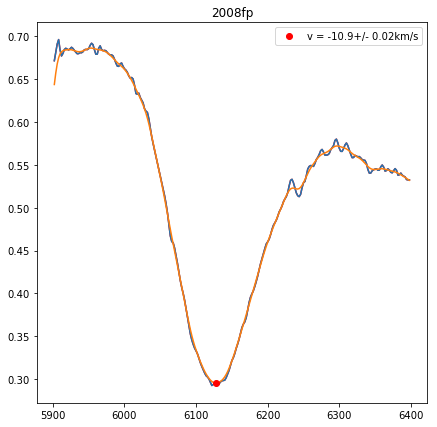

SN08fp_080921_b01_DUP_WF.dat 54730.35 54730.35 0.507127629205
Velocity: (-10.899686192972935, 6128.0, 0.02320231467263814)


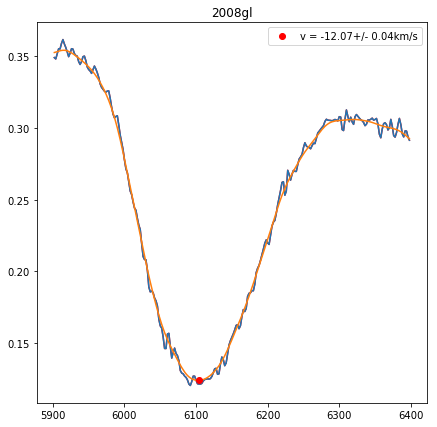

SN08gl_081027_b01_DUP_WF.dat 54766.17 54766.17 -1.45065313247
Velocity: (-12.07438460450608, 6104.0, 0.03767114917792617)


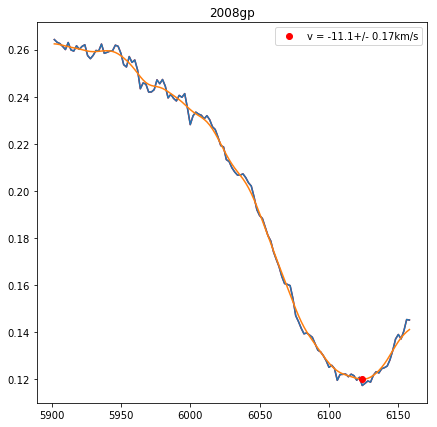

SN08gp_081102_b01_BAA_IM.dat 54772.23 54772.23 -5.81374532739
Velocity: (-11.095173645785795, 6124.0, 0.16848973862170993)


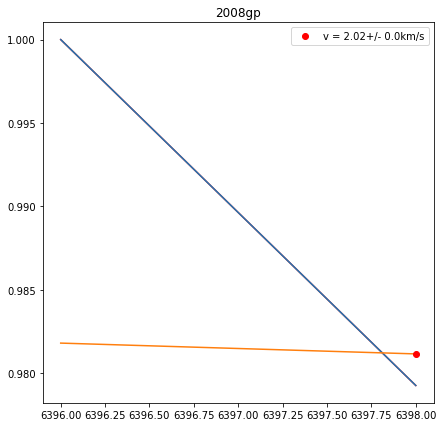

SN08gp_081102_r01_BAA_IM.dat 54772.23 54772.23 -5.81374532739
Velocity: (2.0216308539835866, 6398.0, 8.881784197001252e-16)


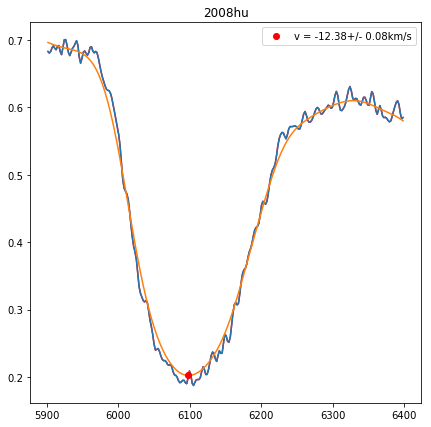

SN08hu_081210_r01_NTT_EF.dat 54810.23 54810.23 3.89635876222
Velocity: (-12.383434613776572, 6097.700274139507, 0.08208675181429073)


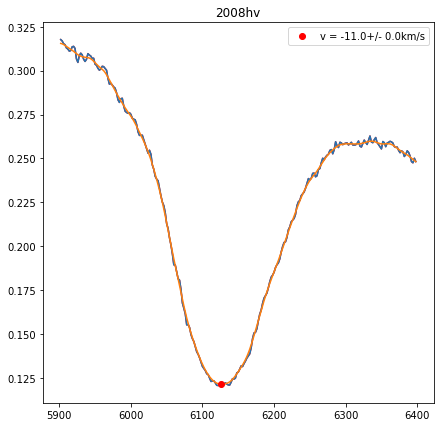

SN08hv_081215_b01_CLA_LD.dat 54815.35 54815.35 -1.29376454859
Velocity: (-10.997415134434632, 6126.0, 1.7763568394002505e-15)
SN08ia_081210_b01_NTT_EF.dat 54810.27 54810.29 -1.23392521296
Velocity: (nan, nan)


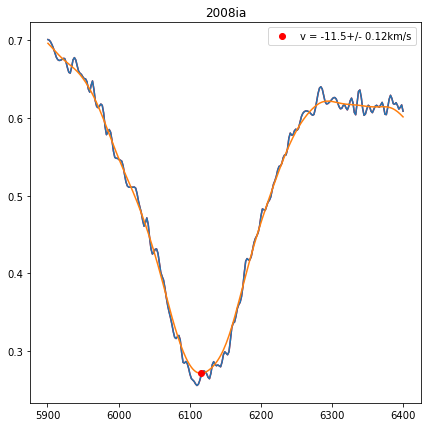

SN08ia_081210_r01_NTT_EF.dat 54810.29 54810.29 -1.21435463066
Velocity: (-11.496231983094336, 6115.801239393427, 0.12459042636329727)


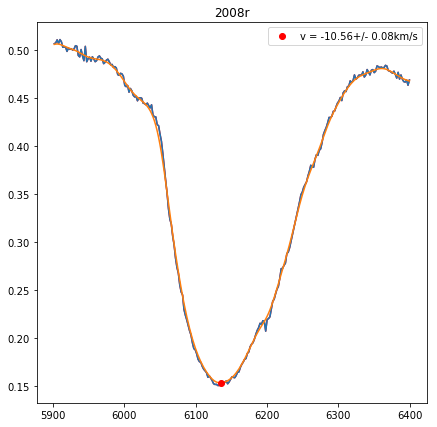

SN08R_080131jan08_b01_CLA_MA.dat 54496.03 54496.03 2.59299457306
Velocity: (-10.560842949839374, 6134.939040583993, 0.08204228657490728)


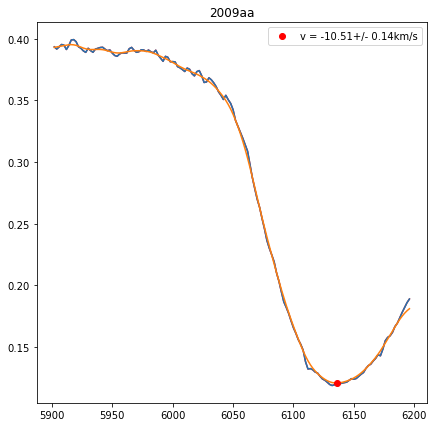

SN09aa_090216_b01_BAA_IM.dat 54878.34 54878.34 0.107075865049
Velocity: (-10.50906616967564, 6136.0, 0.14053279064205662)
SN09aa_090216_r01_BAA_IM.dat 54878.34 54878.34 0.107075865049
Velocity: (nan, nan)


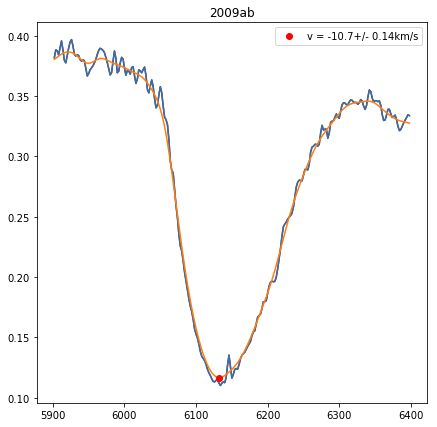

SN09ab_090224_b01_DUP_WF.dat 54886.05 54886.05 2.67017151383
Velocity: (-10.704317028490788, 6132.0, 0.13890497117570122)


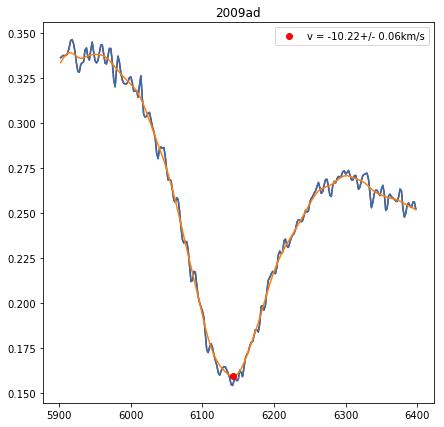

SN09ad_090223_b01_DUP_WF.dat 54885.09 54885.09 -0.534811357593
Velocity: (-10.216411741678657, 6142.0, 0.05800939743425552)


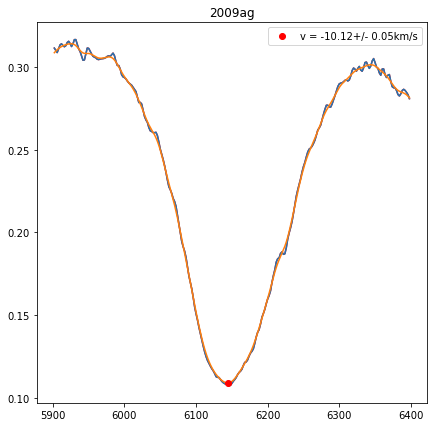

SN09ag_090226_b01_DUP_WF.dat 54888.18 54888.18 -0.475888796523
Velocity: (-10.118919436719901, 6144.0, 0.045075847629694556)


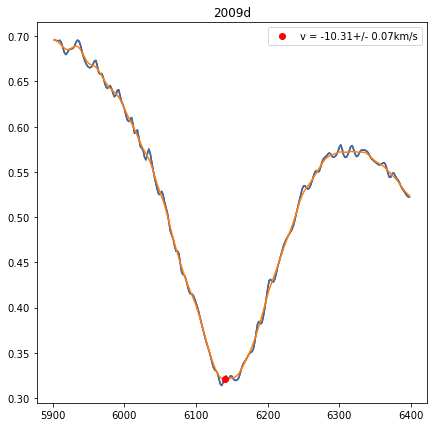

SN09D_090109_r01_NTT_EF.dat 54840.11 54840.11 -0.0585360143373
Velocity: (-10.313933633529203, 6140.0, 0.07318316856982109)


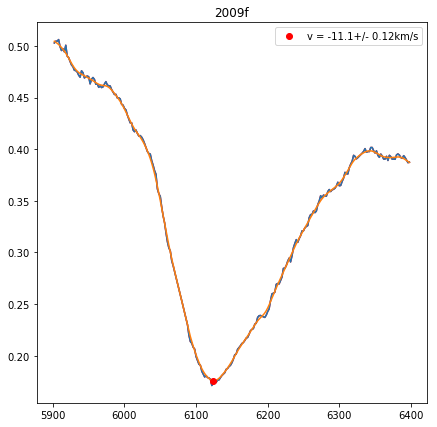

SN09F_090110_r01_GEM_GM.dat 54841.09 54841.09 0.540003711764
Velocity: (-11.095173645785795, 6124.0, 0.1175639203170783)


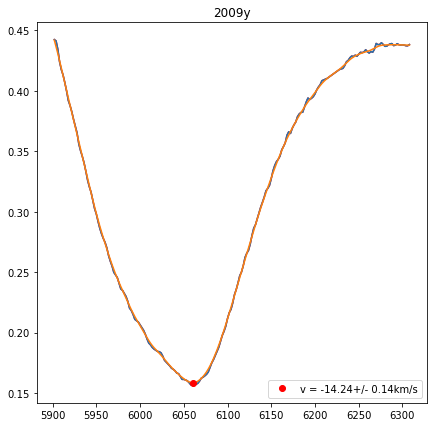

SN09Y_090216_b01_BAA_IM.dat 54878.39 54878.39 2.47683417014
Velocity: (-14.239044645731925, 6060.0, 0.14143443391296492)
SN09Y_090216_r01_BAA_IM.dat 54878.39 54878.39 2.47683417014
Velocity: (nan, nan)
74


In [133]:
found_sne = []
vel_dict = {}
for spec in spec_array:
    if spec.name in sne:
        mjd = mjds[list(sne).index(spec.name)]
        if spec.mjd != None and np.absolute(mjd - spec.mjd) < .02:
            if spec.name == '2008ia':
                spec.wavelength = spec.wavelength/(1.+0.022597)
            if spec.name == '2008r':
                spec.wavelength = spec.wavelength/(1.+0.012887)
            if spec.name == '2008hu':
                spec.wavelength = spec.wavelength/(1.+0.05056)
            found_sne.append(spec.name)
            vexp, snr = sa.find_vexp(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], var_y=None)
            vel_data = sa.measure_velocity(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], 5900, 6400, vexp=vexp, clip=True, rest_wave=6355., varflux=None, plot=True, error=True, sn_name=spec.name)
            if ~np.isnan(vel_data[0]):
                vel_dict[spec.name] = [vel_data[0],vel_data[2]]
            print spec.filename, spec.mjd, mjd, spec.phase
            print 'Velocity:', vel_data
print len(set(found_sne))

In [138]:
for sn in set(sne).difference(set(vel_dict.keys())):
    print sn

2004dt
2008cd
2008cf
2009dc
2004eo
2006ej
2008bz
2007ai
2005hj
2006ef


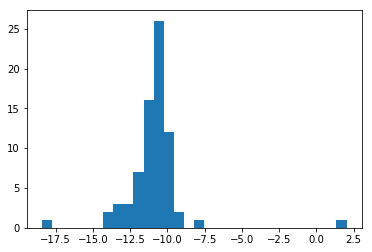

In [136]:
plt.hist(np.transpose(vel_dict.values())[0], bins = 30)
plt.show()

In [137]:
#remove 08gp outlier spec
for sn in vel_dict:
    print sn, np.round(vel_dict[sn][0],2), np.round(vel_dict[sn][1],2)

2006mr -11.0 0.03
2009ad -10.22 0.06
2005am -11.49 0.08
2006os -12.17 0.09
2005ag -11.78 0.28
2007bd -12.27 0.08
2008r -10.56 0.08
2006et -9.34 0.27
2006kf -10.9 0.05
2005eq -10.51 0.07
2006gt -10.22 0.06
2007on -11.29 0.0
2005el -10.9 0.09
2008hu -12.38 0.08
2004gu -11.1 0.07
2008fp -10.9 0.02
2007as -13.45 0.08
2005ku -12.47 0.13
2004gs -10.61 0.0
2005iq -10.12 0.14
2007ax -9.92 0.04
2008c -10.41 0.04
2008ia -11.5 0.12
2006ax -10.22 0.05
2007hj -11.29 0.25
2006d -10.8 0.06
2005kc -10.41 0.1
2005ke -10.22 0.18
2004gc -10.02 0.06
2006gj -10.31 0.03
2009f -11.1 0.12
2005ki -11.39 0.06
2007al -9.44 0.08
2008ar -10.22 0.08
2008bq -10.51 0.0
2007nq -11.58 0.02
2009y -14.24 0.14
2007af -11.0 0.09
2008hv -11.0 0.0
2006lu -10.41 0.09
2007n -9.73 0.05
2007jg -12.57 0.19
2007ca -10.8 0.07
2007ux -10.61 0.08
2005bg -10.31 0.07
2007bm -10.31 0.05
2005be -11.0 0.14
2006fw -10.41 0.16
2006hx -10.8 0.11
2004ef -12.17 0.16
2005bo -10.9 0.04
2008bc -11.78 0.07
2005bl -10.7 0.19
2009d -10.31 0.07
2006i

In [112]:
other_sne = [
'2005al',
'2005lu',
'2005mc',
'2005na',
'2006eq',
'2006ev',
'2006ob',
'2006py',
'2007jd',
'2007sr',
'2008fr',
'2008hj',
'2005ir',
'2005w',
'2006bd',
'2006ot',
'2007cg',
'2007jh'
]

In [114]:

name_string = ''
for l in other_sne:
    name_string += "'" + l + "'"+ ','
name_string = name_string[:-1]
q = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where Spectra.SN in ({names}) and phase between -6 and 10".format(names=name_string)
print q
example_query = [q]

SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where Spectra.SN in ('2005al','2005lu','2005mc','2005na','2006eq','2006ev','2006ob','2006py','2007jd','2007sr','2008fr','2008hj','2005ir','2005w','2006bd','2006ot','2007cg','2007jh') and phase between -6 and 10


In [115]:
spec_array = kpora.grab(example_query[0], verbose=True, make_corr = False, db_file='../data/kaepora_v1.2.db')

15 Total Spectra found
15 spectra of SNe that have host reddening corrections
Arrays cleaned
Name Filename Source SNR Phase MJD MJD_max z Host Morphology Minwave Maxwave
2005mc sn2005mc-20060105.368-ui.flm bsnip 26.6308583158 6.60345427962 53740.368 0.025221 9.0 3282.0 10190.0
2005na sn2005na-20060105.335-ui.flm bsnip 40.5116724849 0.432612766749 53740.335 0.026322 10.0 3278.0 10180.0
2005na sn2005na-20060106.361-ui-corrected.flm bsnip 21.475175393 1.43229902506 53741.361 0.026322 10.0 3278.0 10180.0
2005w sn2005w-20050211.200-br.flm bsnip 2.6092297517 0.663105336289 53412.2 0.00888948313703 8.0 5054.0 10060.0
2006ot sn2006ot-20061123.362-br.flm bsnip 64.4316359628 -2.38628810179 54062.362 0.0531 10.0 3010.0 8732.0
2006ot sn2006ot-20061201.241-ui.flm bsnip 12.9410415701 5.09543253252 54070.241 0.0531 10.0 3192.0 9920.0
2005mc sn2005mc-20051227.37-fast.flm cfa 48.9215632894 -2.17318997562 53731.37 0.025221 9.0 3466.0 7176.0
2005mc sn2005mc-20060104.38-fast.flm cfa 26.0608159359 5.639759

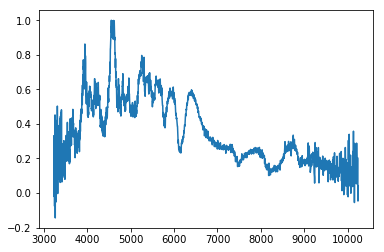

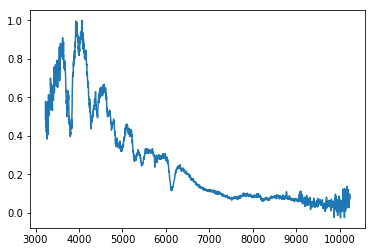

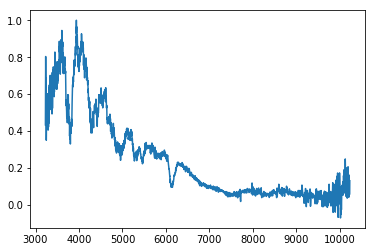

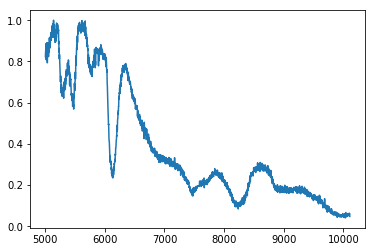

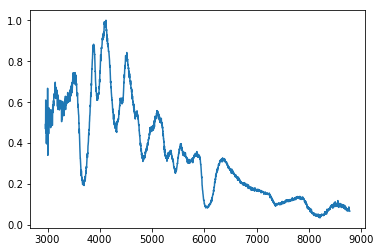

...

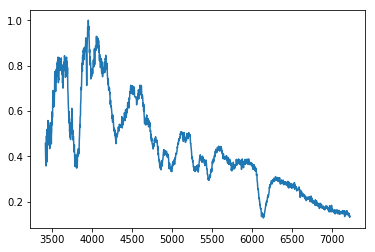

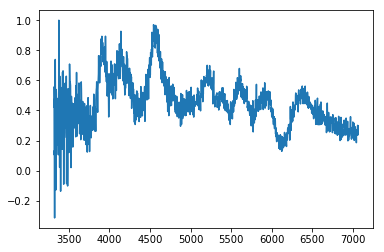

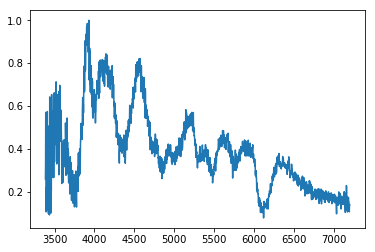

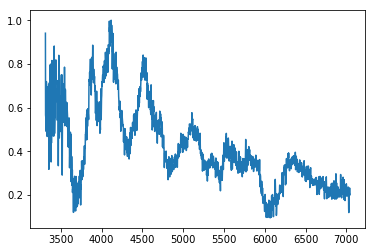

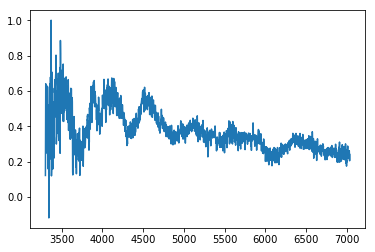

In [116]:
for spec in spec_array:
    plt.plot(spec.wavelength, spec.flux)
    plt.show()

# Recalculating all velocities (without CSP)

In [156]:
q = "SELECT * from Spectra inner join Events ON Spectra.SN = Events.SN where phase between -20 and 20 and source != 'csp' and source != 'foundation' and source != 'swift_uv'"
spec_array = kpora.grab(q, verbose=True, make_corr = False, db_file='../data/kaepora_v1.2.db')

ERROR:  2002bo_20020314_0_2_00.dat None
ERROR:  2002bo_20020403_0_2_00.dat None
ERROR:  sn2006oa-20061116-not.dat None
ERROR:  sn2006oa-20061122-not.dat None
ERROR:  sn2007jg-20070918-not.dat None
ERROR:  sn1992a-19920116.220-iue.flm None
2232 Total Spectra found
2232 spectra of SNe that have host reddening corrections
Arrays cleaned
Name Filename Source SNR Phase MJD MJD_max z Host Morphology Minwave Maxwave
1989b sn1989b-19890215.flm bsnip 211.573494466 7.46988552759 47572.0 0.002425 12.0 3494.0 8378.0
1989b sn1989b-19890221.flm bsnip 12.070823537 13.455370726 47578.0 0.002425 12.0 3494.0 6932.0
1989m sn1989m-19890709-oi1i2.flm bsnip 221.143500405 2.49 47716.0 0.00506 12.0 3118.0 10198.0
1989m sn1989m-19890710-oi1i2.flm bsnip 242.272778994 3.48 47717.0 0.00506 12.0 3436.0 10098.0
1990n sn1990n-19900717-oi.flm bsnip 196.252213907 7.33808719397 48089.0 0.003395 13.0 3960.0 9788.0
1990o sn1990o-19900717-opt2.flm bsnip 67.146111096 12.5753882934 48089.0 0.030664 11.0 3856.0 6818.0
1990y 

2003w sn2003w-20030228-br.flm bsnip 127.394284873 17.8409149951 52698.0 0.020071 14.0 3086.0 9186.0
2003y sn2003Y-20030204-ui.flm bsnip 35.2214097328 -2.4259003955 52674.233 0.016942 8.0 3144.0 10176.0
2004as sn2004as-20040316.608-br-corrected.flm bsnip 77.2642615553 -4.99116894806 53080.608 0.031021 None 3258.0 8902.0
2004bd sn2004bd-20040410.156-ui-corrected.flm bsnip 55.4761185134 11.0572258019 53105.156 0.008933 10.0 3324.0 10256.0
2004bg sn2004bg-20040424.256-ui.flm bsnip 0.826842737152 11.088748182 53119.256 0.021035 15.0 3334.0 10322.0
2004bk sn2004bk-20040424.371-ui-corrected.flm bsnip 40.6072251462 6.42248642393 53119.371 0.023124 12.0 3376.0 9996.0
2004bl sn2004bl-20040512.189-ui.flm bsnip 1.14500222114 4.61 53137.189 0.017319 16.0 3364.0 10348.0
2004bl sn2004bl-20040527.218-lowopt.flm bsnip 2.0636304664 19.38 53152.218 0.017319 16.0 3972.0 6584.0
2004br sn2004br-20040527.285-lowopt.flm bsnip 3.32312731397 3.5 53152.285 0.0231593551296 None 3948.0 6546.0
2004bv sn2004bv-20040

2007au sn2007au-20070410.192-ui-corrected.flm bsnip 23.6386869011 16.0878477421 54200.192 0.020584 8.0 3310.0 10336.0
2007ax sn2007ax-20070410.281-ui.flm bsnip 22.3131829677 13.7176500033 54200.281 0.006878 8.0 3344.0 10476.0
2007ba sn2007ba-20070410.475-ui.flm bsnip 18.8818091217 10.0566868205 54200.475 0.038513 9.0 3244.0 10156.0
2007ba sn2007ba-20070413.629-deimos.flm bsnip 76.8509987579 13.0937215037 54203.629 0.038513 9.0 4334.0 9168.0
2007ba sn2007ba-20070416.623-deimos.flm bsnip 73.8052370195 15.9766897477 54206.623 0.038513 9.0 4334.0 9168.0
2007bc sn2007bc-20070410.323-ui-corrected.flm bsnip 79.5556137906 0.725901253913 54200.323 0.0208 10.0 3300.0 10334.0
2007bc sn2007bc-20070426.387-ui-corrected.flm bsnip 4.66021970254 16.4625783699 54216.387 0.0208 10.0 3558.0 10236.0
2007bd sn2007bd-20070410.254-ui.flm bsnip 25.136459039 -6.03933619683 54200.254 0.030908 10.0 3270.0 10232.0
2007bd sn2007bd-20070426.226-ui.flm bsnip 11.7618239989 9.45380189115 54216.226 0.030908 10.0 3558.0

1996bl sn1996bl-19961103.25-fast.flm cfa 15.5810768679 13.4227799228 50390.25 0.036 None 3624.0 7242.0
1996bl sn1996bl-19961108.24-fast.flm cfa 14.5548744116 18.2393822394 50395.24 0.036 None 3624.0 7240.0
1996bo sn1996bo-19961103.27-fast.flm cfa 33.2930311612 3.27931700555 50390.27 0.017285 14.0 3690.0 7376.0
1996bo sn1996bo-19961105.24-fast.flm cfa 49.410964619 5.21584413414 50392.24 0.017285 14.0 3690.0 7374.0
1996bo sn1996bo-19961107.15-fast.flm cfa 31.8602985067 7.09339074104 50394.15 0.017285 14.0 3690.0 7374.0
1996bo sn1996bo-19961109.28-fast.flm cfa 31.0533166456 9.18719926078 50396.28 0.017285 14.0 3690.0 7372.0
1996bo sn1996bo-19961111.27-fast.flm cfa 21.8162647711 11.1433865632 50398.27 0.017285 14.0 3690.0 7374.0
1996c sn1996C-19960217.48-fast.flm cfa 52.462625645 1.86368062318 50130.48 0.027 None 3656.0 7312.0
1996c sn1996C-19960220.40-fast.flm cfa 50.4575123113 4.70691333983 50133.4 0.027 None 3656.0 7312.0
1996c sn1996C-19960223.44-mmt.flm cfa 19.3173088176 7.66699123661

1999aa sn1999aa-19990213.35-fast.flm cfa 86.3519149696 -9.28588397771 51222.35 0.014443 14.0 3444.0 7066.0
1999aa sn1999aa-19990214.33-fast.flm cfa 106.018881861 -8.31983659998 51223.33 0.014443 14.0 3444.0 7066.0
1999aa sn1999aa-19990215.28-fast.flm cfa 97.5460400955 -7.38336210117 51224.28 0.014443 14.0 3444.0 7066.0
1999aa sn1999aa-19990216.24-fast.flm cfa 78.1387159384 -6.43702997605 51225.24 0.014443 14.0 3444.0 7066.0
1999aa sn1999aa-19990217.26-fast.flm cfa 76.3624979228 -5.43155209311 51226.26 0.014443 14.0 3444.0 7066.0
1999aa sn1999aa-19990218.25-fast.flm cfa 86.9561860613 -4.45564708909 51227.25 0.014443 14.0 3444.0 7066.0
1999aa sn1999aa-19990219.28-fast.flm cfa 122.36626933 -3.44031157985 51228.28 0.014443 14.0 3464.0 7066.0
1999aa sn1999aa-19990220.29-fast.flm cfa 123.34016827 -2.44469132321 51229.29 0.014443 14.0 3404.0 7086.0
1999aa sn1999aa-19990221.29-fast.flm cfa 123.568414644 -1.45892869288 51230.29 0.014443 14.0 3720.0 7382.0
1999aa sn1999aa-19990223.25-fast.flm cf

2001cp sn2001cp-20010624.40-fast.flm cfa 61.0452080954 -3.9945148777 52084.4 0.022402 13.0 3692.0 7324.0
2001cp sn2001cp-20010627.26-fast.flm cfa 54.1593838673 -1.19718075668 52087.26 0.022402 13.0 3692.0 7324.0
2001cp sn2001cp-20010629.28-fast.flm cfa 53.2696013982 0.778558727391 52089.28 0.022402 13.0 3692.0 7324.0
2001cp sn2001cp-20010715.25-fast.flm cfa 38.4754006638 16.3986377178 52105.25 0.022402 13.0 3692.0 7324.0
2001da sn2001da-20010714.46-fast.flm cfa 70.1786877241 0.252655587176 52104.46 0.017195 11.0 3710.0 7362.0
2001da sn2001da-20010715.47-mmt.flm cfa 170.842401213 1.24558221383 52105.47 0.017195 11.0 3198.0 9076.0
2001da sn2001da-20010716.46-fast.flm cfa 71.2405176279 2.21884692709 52106.46 0.017195 11.0 3710.0 7362.0
2001da sn2001da-20010718.45-fast.flm cfa 92.3879094814 4.1752073103 52108.45 0.017195 11.0 3710.0 7362.0
2001da sn2001da-20010719.47-fast.flm cfa 61.0987381308 5.17796489365 52109.47 0.017195 11.0 3710.0 7362.0
2001da sn2001da-20010724.45-fast.flm cfa 74.52

2002es sn2002es-20020906.49-fast.flm cfa 30.3402079824 11.6361833085 52523.49 0.02843 8.0 3670.0 7282.0
2002es sn2002es-20020910.46-fast.flm cfa 22.1736341922 15.4964363155 52527.46 0.02843 8.0 3670.0 7282.0
2002es sn2002es-20020912.46-fast.flm cfa 24.0481880968 17.4411481579 52529.46 0.02843 8.0 3670.0 7282.0
2002eu sn2002eu-20020903.46-fast.flm cfa 22.3957198032 4.43801523863 52520.46 0.037626 None 3638.0 7216.0
2002eu sn2002eu-20020905.49-fast.flm cfa 18.0819822352 6.39440414947 52522.49 0.037626 None 3638.0 7216.0
2002eu sn2002eu-20020907.49-fast.flm cfa 8.45816442014 8.32188090892 52524.49 0.037626 None 3638.0 7216.0
2002eu sn2002eu-20020910.40-fast.flm cfa 15.9909132142 11.1263595939 52527.4 0.037626 None 3638.0 7216.0
2002eu sn2002eu-20020913.40-fast.flm cfa 14.1582103494 14.0175747331 52530.4 0.037626 None 3638.0 7216.0
2002fb sn2002fb-20020907.51-fast.flm cfa 16.858123239 -2.50992795158 52524.51 0.015567 1.0 3716.0 7374.0
2002fb sn2002fb-20020909.43-fast.flm cfa 27.5289574117 

2003w sn2003W-20030202.30-fast.flm cfa 41.2258395592 -7.35340971363 52672.3 0.020071 14.0 3700.0 7342.0
2003w sn2003W-20030203.33-fast.flm cfa 50.8304202155 -6.34367607745 52673.33 0.020071 14.0 3700.0 7342.0
2003w sn2003W-20030204.27-fast.flm cfa 44.5127058758 -5.42217159394 52674.27 0.020071 14.0 3700.0 7342.0
2003w sn2003W-20030206.32-fast.flm cfa 51.0776177476 -3.41250756075 52676.32 0.020071 14.0 3700.0 7342.0
2003w sn2003W-20030207.40-fast.flm cfa 54.7885060079 -2.35375772863 52677.4 0.020071 14.0 3700.0 7342.0
2003w sn2003W-20030209.35-fast.flm cfa 51.6166390318 -0.442126087303 52679.35 0.020071 14.0 3700.0 7342.0
2003w sn2003W-20030210.35-fast.flm cfa 54.5928990352 0.538197831327 52680.35 0.020071 14.0 3700.0 7342.0
2003y sn2003Y-20030131.35-fast.flm cfa 17.5787711557 -6.24421058428 52670.35 0.016942 8.0 3712.0 7364.0
2003y sn2003Y-20030201.33-fast.flm cfa 20.7882633781 -5.28053713977 52671.33 0.016942 8.0 3712.0 7364.0
2003y sn2003Y-20030203.31-fast.flm cfa 11.6578311239 -3.33

2005na sn2005na-20060104.34-fast.flm cfa 52.0343316192 -0.536868546135 53739.34 0.026322 10.0 3454.0 7170.0
2005na sn2005na-20060107.32-fast.flm cfa 56.1449704997 2.36670362712 53742.32 0.026322 10.0 3454.0 7170.0
2005na sn2005na-20060109.43-fast.flm cfa 68.6477610116 4.42258862228 53744.43 0.026322 10.0 3464.0 7170.0
2005na sn2005na-20060122.27-fast.flm cfa 30.1756134819 16.9332821473 53757.27 0.026322 10.0 3458.0 7172.0
2006ac sn2006ac-20060221.43-fast.flm cfa 56.8030655932 6.33854165649 53787.43 0.023106 12.0 3520.0 7194.0
2006ac sn2006ac-20060222.43-fast.flm cfa 56.4560274148 7.31595748632 53788.43 0.023106 12.0 3466.0 7194.0
2006ac sn2006ac-20060224.37-fast.flm cfa 51.5769150753 9.21214419621 53790.37 0.023106 12.0 3472.0 7202.0
2006ac sn2006ac-20060225.38-fast.flm cfa 45.8383501031 10.1993341843 53791.38 0.023106 12.0 3466.0 7194.0
2006ac sn2006ac-20060226.34-fast.flm cfa 41.9067952462 11.137653381 53792.34 0.023106 12.0 3468.0 7198.0
2006ac sn2006ac-20060228.36-fast.flm cfa 51.4

2006x sn2006X-20060304.51-fast.flm cfa 102.174760251 12.4915443078 53798.51 0.00524 13.0 3522.0 7320.0
2006x sn2006X-20060305.46-fast.flm cfa 163.013101655 13.4365922566 53799.46 0.00524 13.0 3522.0 7320.0
2006x sn2006X-20060306.42-fast.flm cfa 172.032720351 14.3915880785 53800.42 0.00524 13.0 3524.0 7322.0
2006x sn2006X-20060309.30-fast.flm cfa 109.518744406 17.2565755442 53803.3 0.00524 13.0 3518.0 7314.0
2007a sn2007A-20070109.12-fast.flm cfa 67.9218474944 -3.54242454036 54109.12 0.0171 10.0 3468.0 7234.0
2007a sn2007A-20070110.14-fast.flm cfa 91.0761878938 -2.53957329663 54110.14 0.0171 10.0 3468.0 7234.0
2007a sn2007A-20070117.11-fast.flm cfa 67.0102871178 4.31324353554 54117.11 0.0171 10.0 3472.0 7240.0
2007ae sn2007ae-20070225.54-fast.flm cfa 18.9312262903 2.48217988382 54156.54 0.064387 19.0 3316.0 6912.0
2007ae sn2007ae-20070226.53-fast.flm cfa 5.5396724307 3.41229270932 54157.53 0.064387 19.0 3494.0 6916.0
2007af sn2007af-20070309.47-fast.flm cfa 183.426552686 -5.1966057462 5

2007s sn2007S-20070226.30-fast.flm cfa 63.0578676864 13.2448959463 54157.3 0.0139 None 3482.0 7262.0
2007sr sn2007sr-20071229.53-fast.flm cfa 67.2038873652 15.2395330773 54463.53 0.005477 18.0 3518.0 7330.0
2007sr sn2007sr-20071230.54-fast.flm cfa 179.734845228 16.2440314398 54464.54 0.005477 18.0 3512.0 7328.0
2007sr sn2007sr-20071231.53-fast.flm cfa 188.110172008 17.2286387456 54465.53 0.005477 18.0 3512.0 7330.0
2007sr sn2007sr-20080101.49-fast.flm cfa 128.769538041 18.1834094663 54466.49 0.005477 18.0 3514.0 7332.0
2007ux sn2007ux-20080101.38-fast.flm cfa 36.4348100963 5.80067221837 54466.38 0.030915 None 3428.0 7148.0
2007ux sn2007ux-20080111.39-mmt.flm cfa 71.8528180149 15.5104931056 54476.39 0.030915 None 3162.0 8096.0
2008a sn2008A-20080105.08-fast.flm cfa 44.6850953849 -7.89037688847 54470.08 0.016428 10.0 3468.0 7242.0
2008a sn2008A-20080106.11-fast.flm cfa 44.3430925525 -6.87702424569 54471.11 0.016428 10.0 3468.0 7242.0
2008a sn2008A-20080109.13-fast.flm cfa 29.9492839839 -

2002er 2002er_20020922_3281_9756_00.dat other 90.6603188987 13.8463506215 52539.0 0.008569 10.0 3306.0 9622.0
2002er 2002er_20020923_3281_9756_00.dat other 90.7199914551 14.8378544254 52540.0 0.008569 10.0 3306.0 9622.0
2002er 2002er_20020926_3489_8768_00.dat other 142.752258019 17.8123658371 52543.0 0.008569 10.0 3512.0 8644.0
2003cg 2003cg_20030322_4227_6981_00.dat other 137.295098555 -9.24282712398 52720.0 0.00413 10.0 4264.0 6902.0
2003cg 2003cg_20030323_3700_9347_00.dat other 50.8174902575 -8.24694013724 52721.0 0.00413 10.0 3738.0 9258.0
2003cg 2003cg_20030324_3650_9133_00.dat other 86.8281578198 -7.25105315049 52722.0 0.00413 10.0 3688.0 9044.0
2003cg 2003cg_20030325_3720_9153_00.dat other 96.7342982897 -6.25516616375 52723.0 0.00413 10.0 3758.0 9064.0
2003cg 2003cg_20030326_3650_9347_00.dat other 303.013450347 -5.259279177 52724.0 0.00413 10.0 3688.0 9258.0
2003cg 2003cg_20030329_4000_7771_00.dat other 38.0083199797 -2.27161821677 52727.0 0.00413 10.0 4036.0 7688.0
2003cg 2003c

2005cf sn2005cf-20050617.3-uvot-clip.flm uv 278.360260422 4.6420079864 53538.0 0.006461 8.0 2140.0 4918.0
2005cf sn2005cf-20050617.3-uvot.flm uv 292.878126525 4.6420079864 53538.0 0.006461 8.0 1966.0 9608.0
2005m sn2005m-20050128-hst.flm uv 1.02098043518e+16 -6.5626223092 53398.0 0.022 19.0 1962.0 3272.0
2005m sn2005m-20050131-hst.flm uv 1.42572845794e+15 -3.62720156556 53401.0 0.022 19.0 1910.0 3258.0
asassn-14lp asassn-14lp-visit3-hst.flm foley_hst 79.7877056298 -4.4 None 0.0051 14.0 1644.0 10126.0
2011by sn2011by-hst+lick.flm foley_hst 247.061987065 0.1 None 0.002843 13.0 1654.0 10116.0
2011fe sn2011fe-visit1-hst.flm foley_hst 210.958503451 -13.1 None 0.000804 15.0 1652.0 10184.0
2011fe sn2011fe-visit2-hst.flm foley_hst 307.489666596 -10.1 None 0.000804 15.0 1652.0 10184.0
2011fe sn2011fe-visit3-hst.flm foley_hst 291.401894483 -6.9 None 0.000804 15.0 1722.0 10184.0
2011fe sn2011fe-visit4-hst.flm foley_hst 292.903077167 -2.9 None 0.000804 15.0 1722.0 10184.0
2011fe sn2011fe-visit5-hs

In [157]:
names = []
for spec in spec_array:
    names.append(spec.name)
names = set(names)
print len(names)

361


In [158]:
max_light_spec = []
for name in names:
    events = []
    for spec in spec_array:
        if spec.name == name:
            events.append(spec)
    ac_phase = events[0]
    for e in events:
        if abs(e.phase - 0) < abs(ac_phase.phase - 0):
            ac_phase = e
    max_light_spec.append(ac_phase)

In [159]:
for spec in max_light_spec:
    print spec.name, spec.phase, spec.minwave, spec.maxwave

1996bo 3.27931700555 3700.0 7555.81
1996bl -2.0888030888 3700.0 7555.81
1996bk 2.57881221657 3700.0 7560.22
2007gk -1.72 3310.0 10500.0
2007gi -0.35 3310.0 10500.0
2004e 5.26 3320.0 10400.0
2004l 3.59956836177 3720.0 7540.5
snf20080522-000 -0.315789473686 3475.0 7417.54
1993ac 6.74928503336 3150.0 8172.65
2007hj -0.591650042942 3471.0 7413.54
2005lz 0.451002115207 4929.9 10061.0
2005ls 10.3220195903 3490.0 7410.49
2005lu 18.357398046 3495.0 7411.08
2006dm -7.9 3310.0 10700.0
2006os 7.27433630032 3310.0 10500.0
2006or 2.01074814914 3310.0 10252.0
1998dx 0.827148689459 3720.0 7540.5
2006ot 1.35314784921 3475.0 7411.66
1998bp 0.182100509578 3720.0 7515.0
2006oa 0.0754716981149 3476.0 7412.66
1998bu 0.45364270104 3620.0 5520.5
2001cp 0.778558727391 3720.0 7540.5
2001cj 13.6297112083 3200.0 8900.0
2001ck 4.82257467501 3720.0 7540.5
2002fk -1.41690455504 3720.0 7540.5
1997e -3.24506506409 3700.0 7552.87
1999aa 0.460351148368 3340.0 10550.0
2002fb -0.619358447056 3720.0 7540.5
2007ux 4.907291

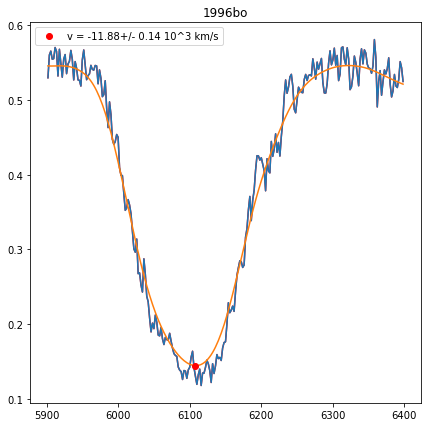

sn1996bo-19961103.27-fast.flm 50390.27 54878.39 3.27931700555
Velocity: (-11.878305981858274, 6108.0, 0.13734630342700926)


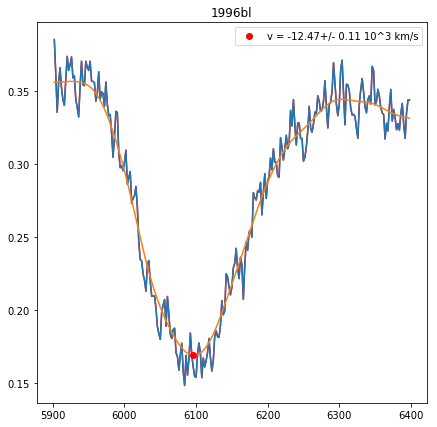

sn1996bl-19961018.18-fast.flm 50374.18 54878.39 -2.0888030888
Velocity: (-12.466896361799964, 6096.0, 0.10973060098216783)


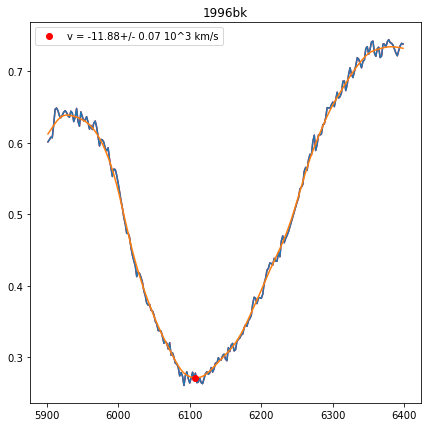

sn1996bk-19961015.10-fast.flm 50371.1 54878.39 2.57881221657
Velocity: (-11.878305981858274, 6108.0, 0.07132384713406198)


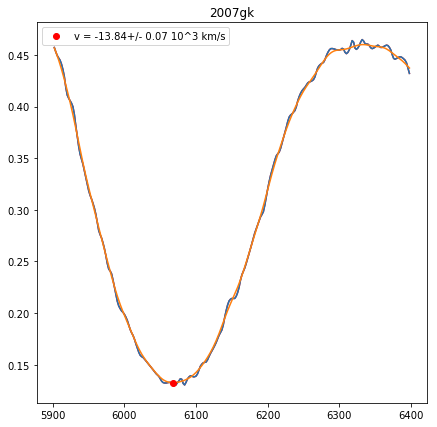

sn2007gk-20070814.237-ui.flm 54326.237 54878.39 -1.72
Velocity: (-13.84440774713146, 6068.0, 0.07064239007194424)


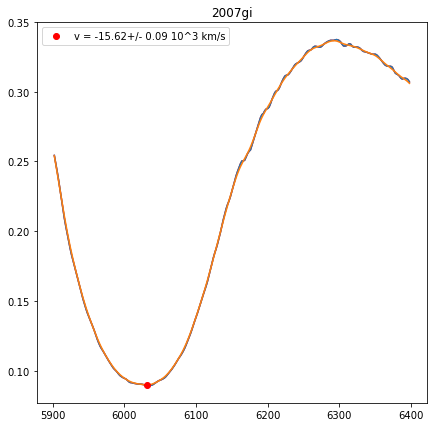

sn2007gi-20070814.173-ui.flm 54326.173 54878.39 -0.35
Velocity: (-15.623987686431857, 6032.0, 0.08648866784851708)


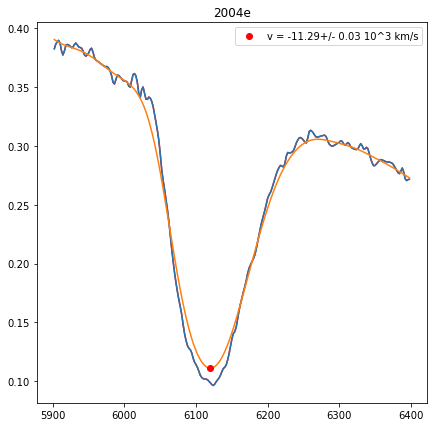

sn2004e-20040117-ui.flm 53021.517 54878.39 5.26
Velocity: (-11.290779369257717, 6120.0, 0.032896409775260614)


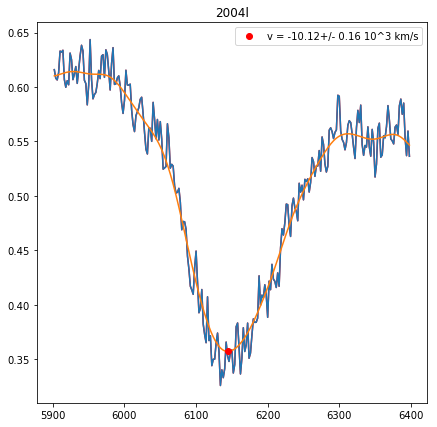

sn2004L-20040127.40-fast.flm 53031.4 54878.39 3.59956836177
Velocity: (-10.118919436719901, 6144.0, 0.16218114701459913)


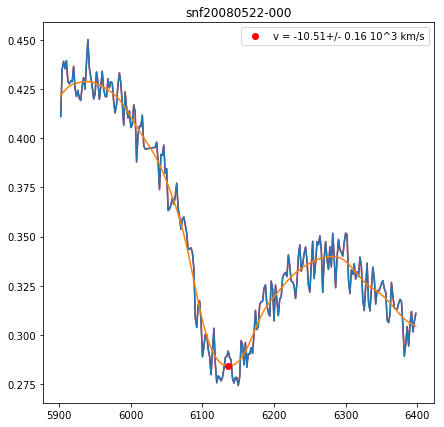

snf20080522-000-20080604.17-fast.flm 54621.17 54878.39 -0.315789473686
Velocity: (-10.50906616967564, 6136.0, 0.15651472087822976)


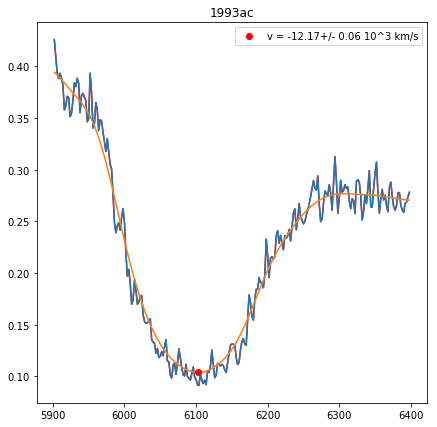

sn1993ac-19931016.49-mmt.flm 49276.49 54878.39 6.74928503336
Velocity: (-12.172468233516442, 6102.0, 0.05801499659342317)


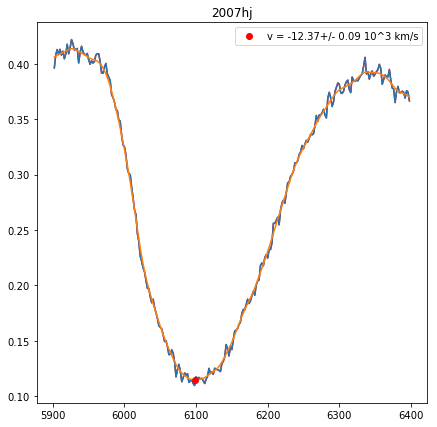

sn2007hj-20070905.30-fast.flm 54348.3 54878.39 -0.591650042942
Velocity: (-12.368724114647867, 6098.0, 0.09121573175736855)


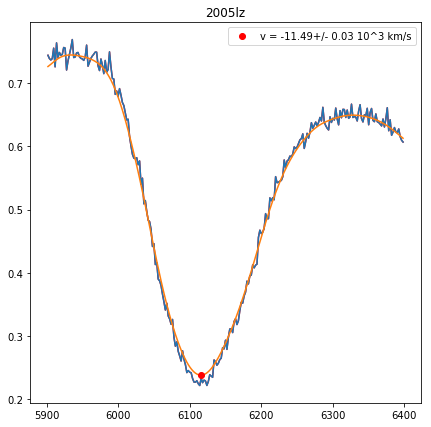

sn2005lz-20060101.381-deimos.flm 53736.381 54878.39 0.451002115207
Velocity: (-11.486503345380463, 6116.0, 0.03494899685443176)


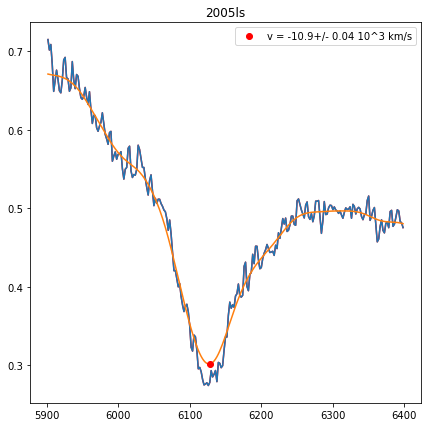

sn2005ls-20051221.22-fast.flm 53725.22 54878.39 10.3220195903
Velocity: (-10.899686192972935, 6128.0, 0.03909157658467918)


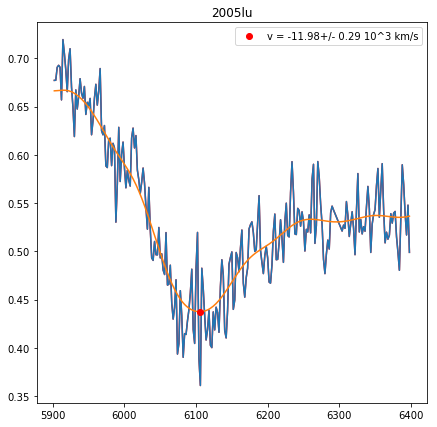

sn2005lu-20051223.16-fast.flm 53727.16 54878.39 18.357398046
Velocity: (-11.976330519809686, 6106.0, 0.28500734348957496)


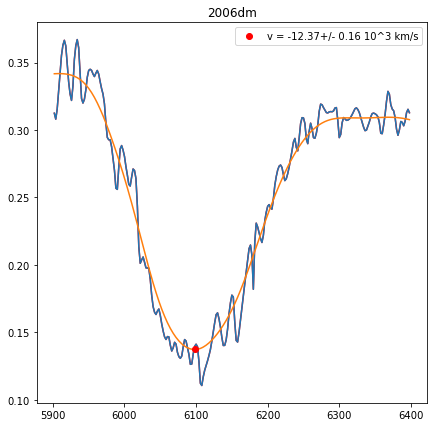

sn2006dm-20060704.421-ui.flm 53920.421 54878.39 -7.9
Velocity: (-12.368724114647867, 6098.0, 0.1614043296347262)


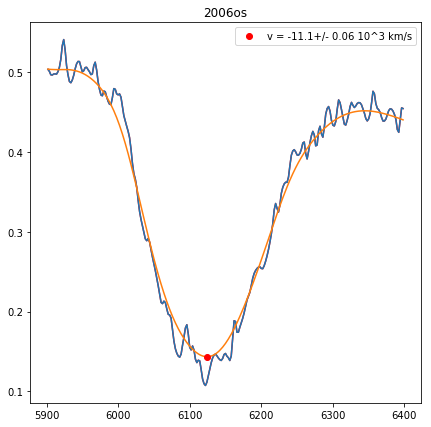

sn2006os-20061201.142-ui.flm 54070.142 54878.39 7.27433630032
Velocity: (-11.095173645785795, 6124.0, 0.05527399392599549)


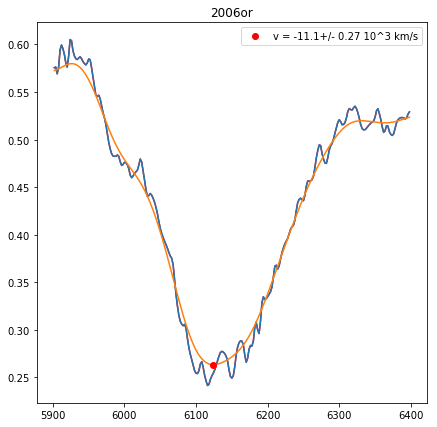

sn2006or-20061201.530-ui.flm 54070.53 54878.39 2.01074814914
Velocity: (-11.095173645785795, 6124.0, 0.26914825346775123)


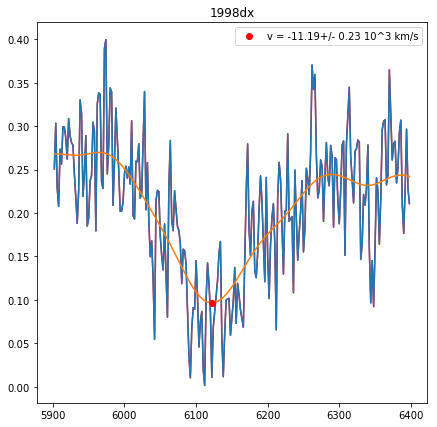

sn1998dx-19980917.13-fast.flm 51073.13 54878.39 0.827148689459
Velocity: (-11.192961724806997, 6122.0, 0.23415182851747435)


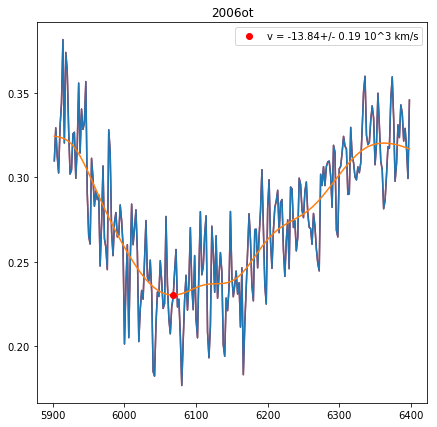

sn2006ot-20061127.30-fast.flm 54066.3 54878.39 1.35314784921
Velocity: (-13.84440774713146, 6068.0, 0.19222353529466552)


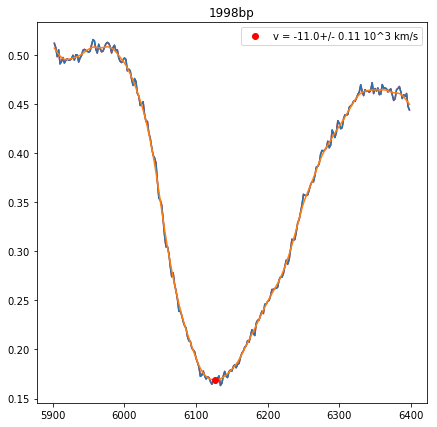

sn1998bp-19980503.45-fast.flm 50936.45 54878.39 0.182100509578
Velocity: (-10.997415134434632, 6126.0, 0.1055153849768896)


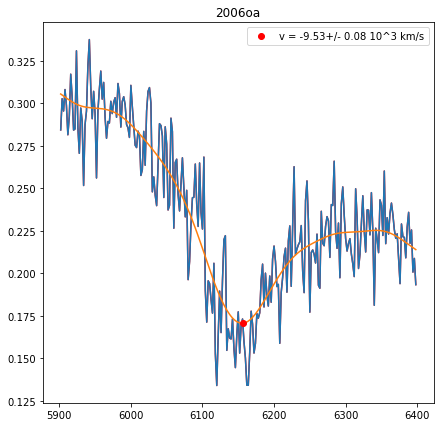

sn2006oa-20061127.10-fast.flm 54066.1 54878.39 0.0754716981149
Velocity: (-9.534587044015712, 6156.0, 0.08195547314635511)
sn1998bu-19980520.15-fast.flm 50953.15 54878.39 0.45364270104
Velocity: (nan, nan)


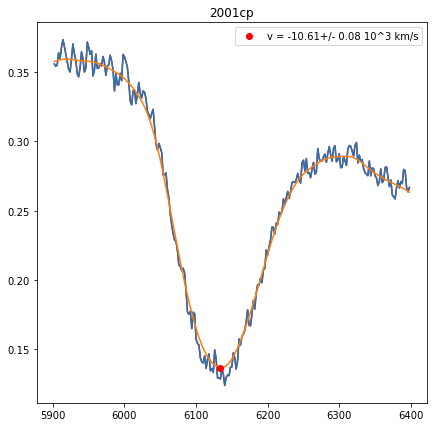

sn2001cp-20010629.28-fast.flm 52089.28 54878.39 0.778558727391
Velocity: (-10.606676809804412, 6134.0, 0.07546687393807411)


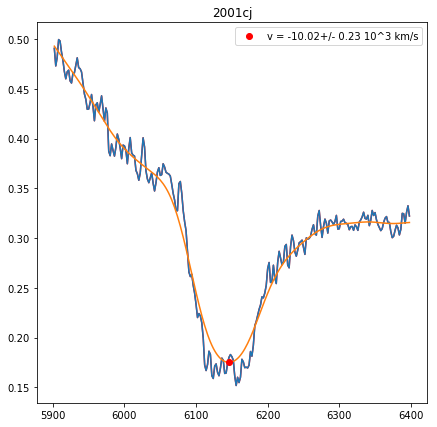

sn2001cj-20010619.26-mmt.flm 52079.26 54878.39 13.6297112083
Velocity: (-10.021456720684506, 6146.0, 0.2306602531502307)


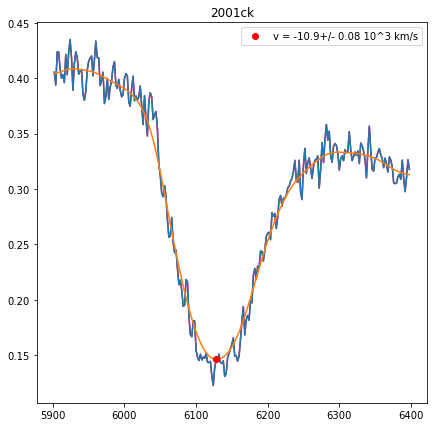

sn2001ck-20010617.29-fast.flm 52077.29 54878.39 4.82257467501
Velocity: (-10.899686192972935, 6128.0, 0.08464886362049694)


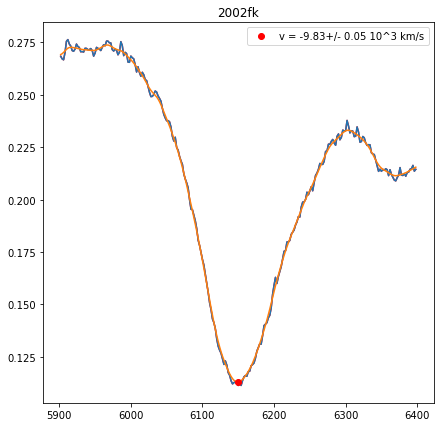

sn2002fk-20020929.44-fast.flm 52546.44 54878.39 -1.41690455504
Velocity: (-9.826620063406793, 6150.0, 0.0541780993794651)


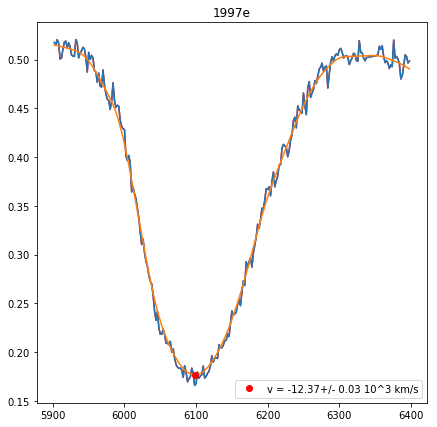

sn1997E-19970116.25-fast.flm 50464.25 54878.39 -3.24506506409
Velocity: (-12.368724114647867, 6098.0, 0.02808665359498117)


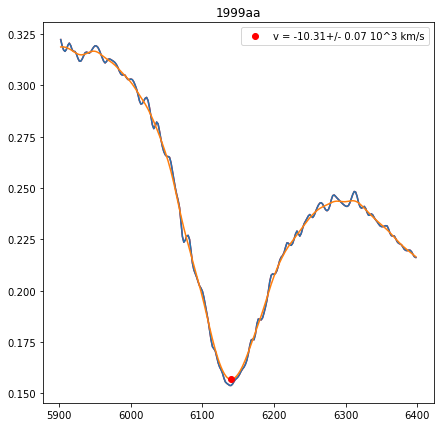

sn1999aa-19990223-ui.flm 51232.237 54878.39 0.460351148368
Velocity: (-10.313933633529203, 6140.0, 0.06667201842520598)


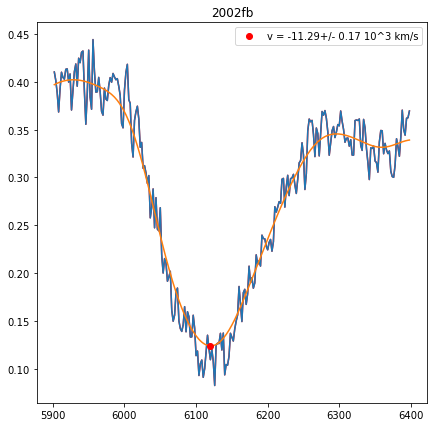

sn2002fb-20020909.43-fast.flm 52526.43 54878.39 -0.619358447056
Velocity: (-11.290779369257717, 6120.0, 0.16608852477341493)


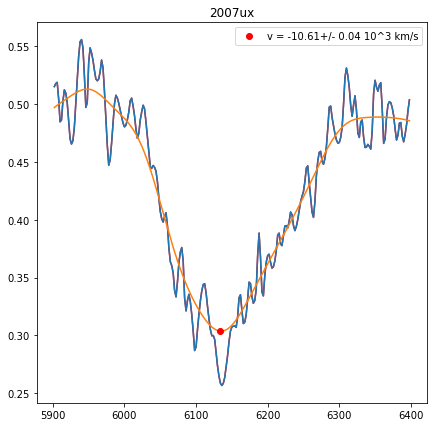

sn2007ux-20071231.459-ui.flm 54465.459 54878.39 4.90729109578
Velocity: (-10.606676809804412, 6134.0, 0.037500783338392775)


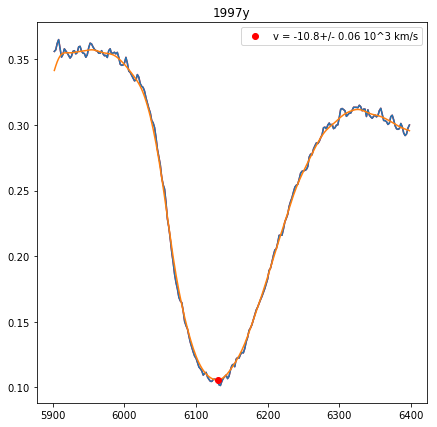

sn1997y-19970209-uohp.flm 50488.351 54878.39 2.77201914426
Velocity: (-10.801986823599174, 6130.0, 0.057716140099996316)


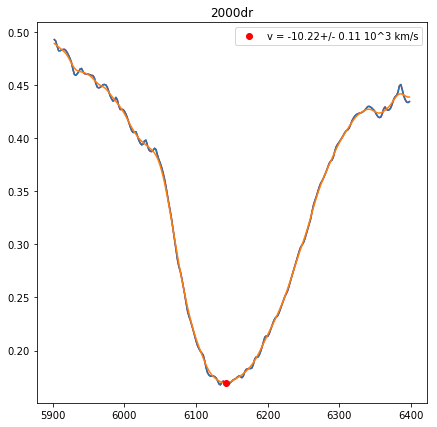

sn2000dr-20001024-ui.flm 51841.306 54878.39 6.78
Velocity: (-10.216411741678657, 6142.0, 0.10703083641586157)


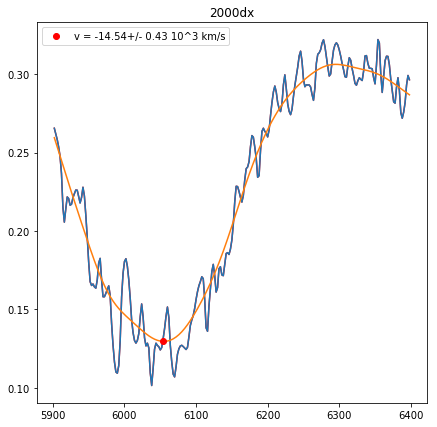

sn2000dx-20001101-ui.flm 51849.255 54878.39 -9.26
Velocity: (-14.535331926120003, 6054.0, 0.4340705055334938)


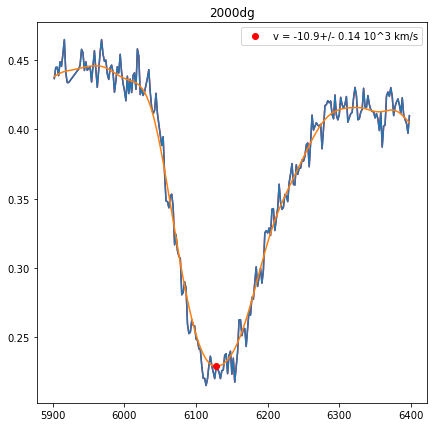

sn2000dg-20000903.37-fast.flm 51790.37 54878.39 0.163699217138
Velocity: (-10.899686192972935, 6128.0, 0.13685460137213803)


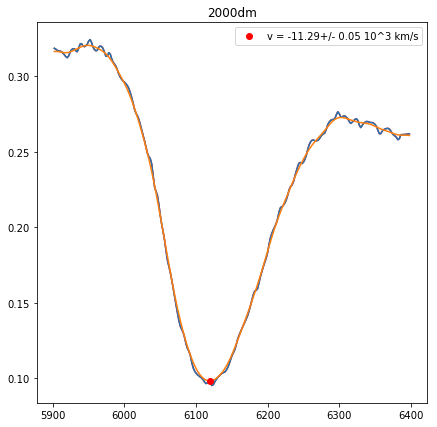

sn2000dm-20000926-ui-corrected.flm 51813.244 54878.39 -1.72992995557
Velocity: (-11.290779369257717, 6120.0, 0.04771054981369013)


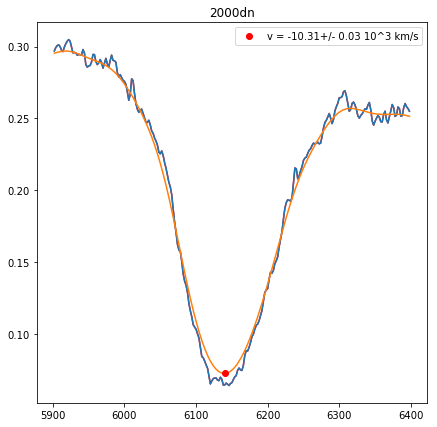

sn2000dn-20001006-uri-corrected.flm 51823.327 54878.39 -0.845876955424
Velocity: (-10.313933633529203, 6140.0, 0.03169086378746356)


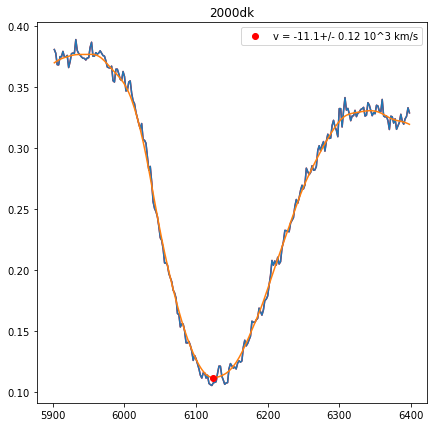

sn2000dk-20000926.37-fast.flm 51813.37 54878.39 0.916022731518
Velocity: (-11.095173645785795, 6124.0, 0.11738346913985698)


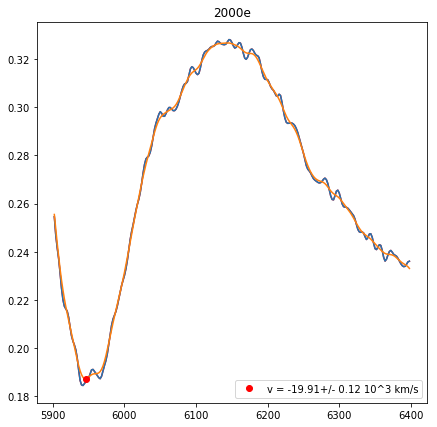

2000E_20000131_3274_7349_00.dat 51574.0 54878.39 -1.94376710625
Velocity: (-19.913781287400706, 5946.0, 0.1178951403310623)


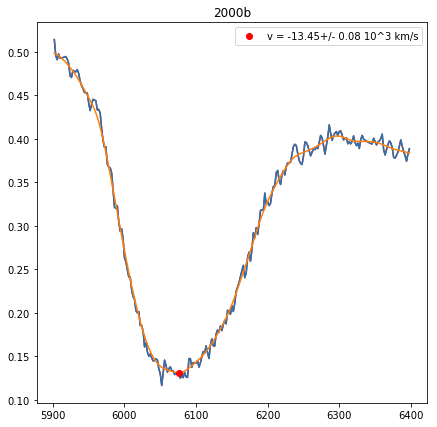

sn2000B-20000128.13-fast.flm 51571.13 54878.39 9.04467130209
Velocity: (-13.450242798100463, 6076.0, 0.07941139170446775)


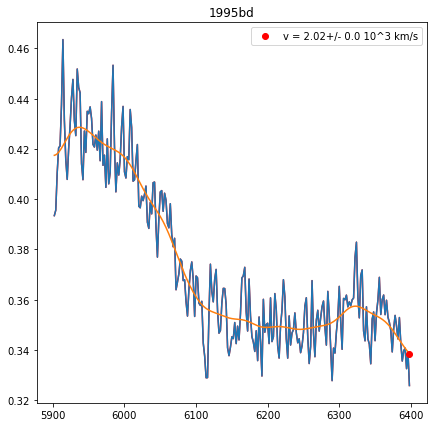

sn1995bd-19951228.25-fast.flm 50079.25 54878.39 -6.94165188251
Velocity: (2.0216308539835866, 6398.0, 8.881784197001252e-16)


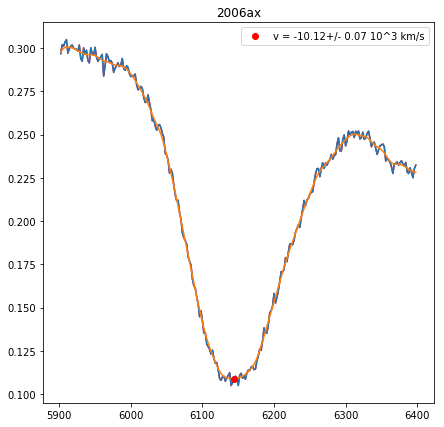

sn2006ax-20060402.30-fast.flm 53827.3 54878.39 0.560615851265
Velocity: (-10.118919436719901, 6144.0, 0.06933052013563723)


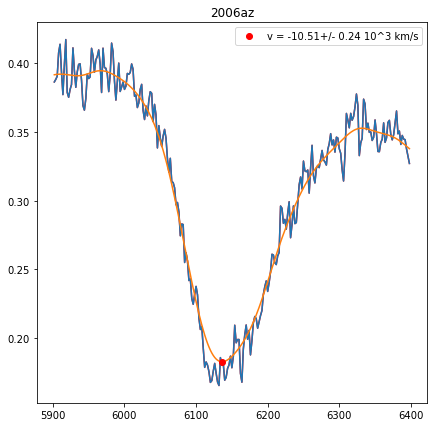

sn2006az-20060331.37-fast.flm 53825.37 54878.39 -0.527676332644
Velocity: (-10.50906616967564, 6136.0, 0.23568837801115558)


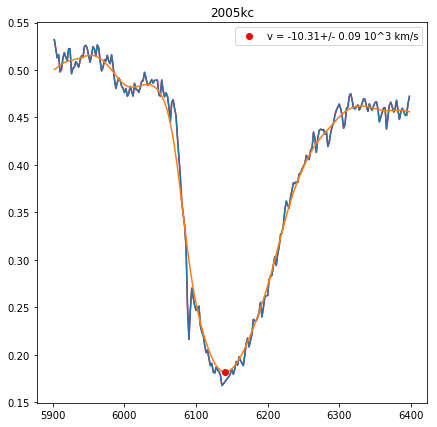

sn2005kc-20051130.11-fast.flm 53704.11 54878.39 6.73122389471
Velocity: (-10.313933633529203, 6140.0, 0.08551222975825998)


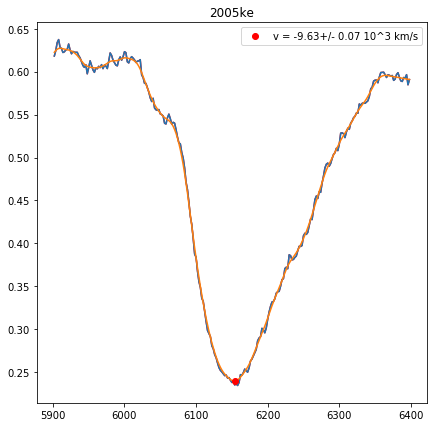

sn2005ke-20051125.30-fast.flm 53699.3 54878.39 0.0925483639845
Velocity: (-9.631901785684354, 6154.0, 0.06670850169368832)


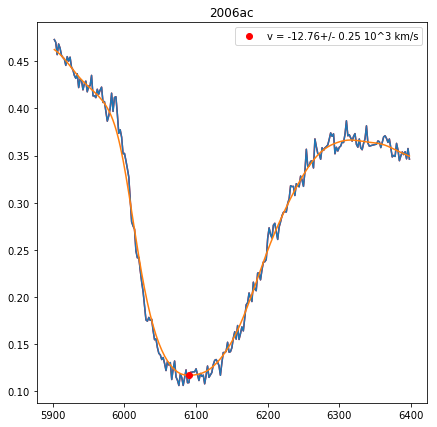

sn2006ac-20060221.43-fast.flm 53787.43 54878.39 6.33854165649
Velocity: (-12.761590299337318, 6090.0, 0.25215968740909617)


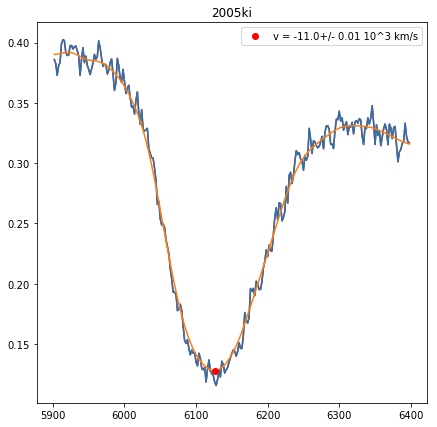

sn2005ki-20051202.52-fast.flm 53706.52 54878.39 1.13127166513
Velocity: (-10.997415134434632, 6126.0, 0.013682051804637713)


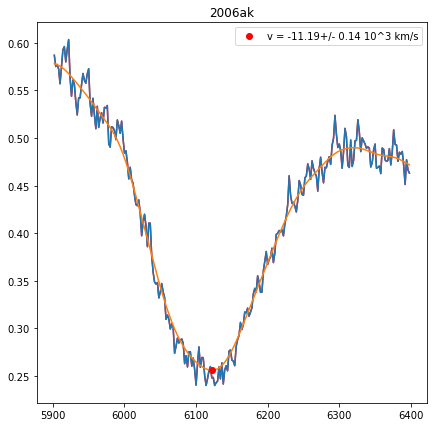

sn2006ak-20060221.33-fast.flm 53787.33 54878.39 8.25739331471
Velocity: (-11.192961724806997, 6122.0, 0.14372672134656567)


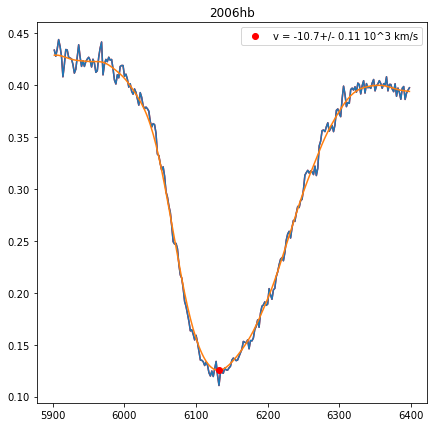

sn2006hb-20060928.51-fast.flm 54006.51 54878.39 8.15782631306
Velocity: (-10.704317028490788, 6132.0, 0.11301093470487603)


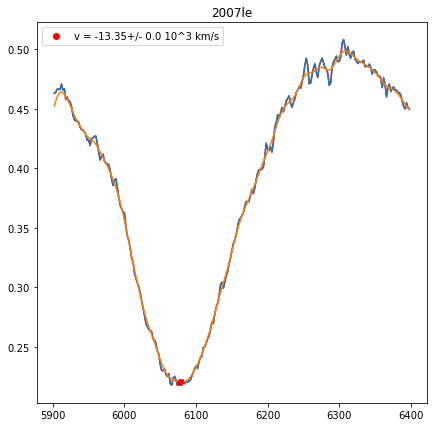

sn2007le-20071019.21-fast.flm 54392.21 54878.39 -5.66194606053
Velocity: (-13.351775323989612, 6078.0, 0.0)
sn2004dt-20040820-hst.flm 53237.0 54878.39 0.674688397911
Velocity: (nan, nan)


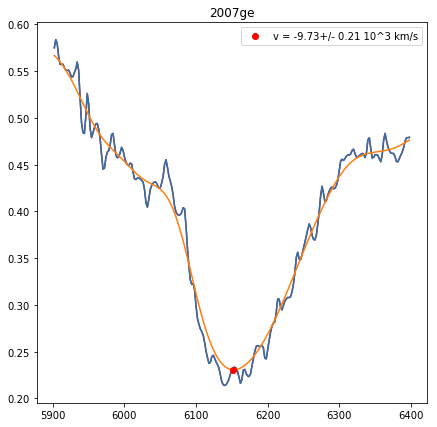

sn2007ge-20070807.492-ui.flm 54319.492 54878.39 12.53
Velocity: (-9.729246126124085, 6152.0, 0.2139917656257315)


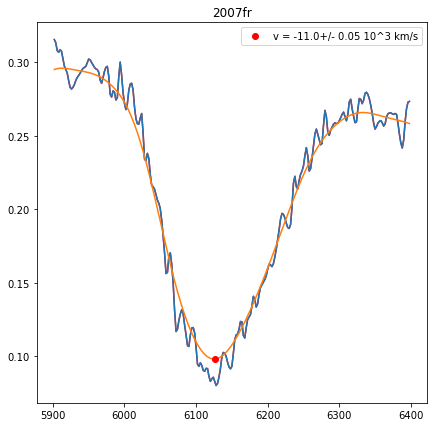

sn2007fr-20070720.287-ui.flm 54301.287 54878.39 -1.25
Velocity: (-10.997415134434632, 6126.0, 0.04521265096460579)


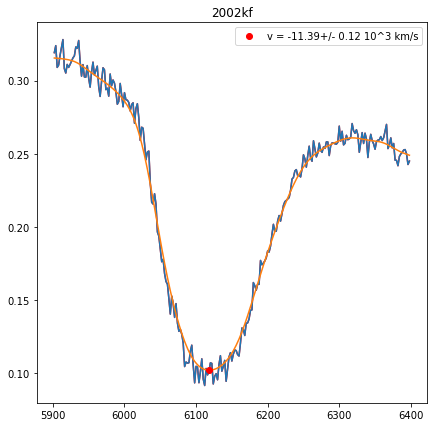

sn2002kf-20021231.34-fast.flm 52639.34 54878.39 1.51378396939
Velocity: (-11.388626576876426, 6118.0, 0.11732517342713157)


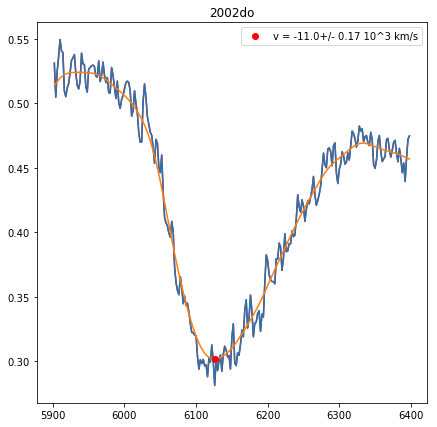

sn2002do-20020619.43-fast.flm 52444.43 54878.39 1.97660946509
Velocity: (-10.997415134434632, 6126.0, 0.1683993623135816)
sn1980n-19801213.495-iue.flm 44586.0 54878.39 0.189885184083
Velocity: (nan, nan)


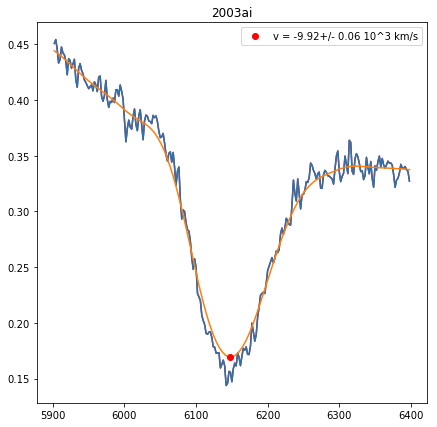

sn2003ai-20030228-br.flm 52698.0 54878.39 8.104792907
Velocity: (-9.92402359558339, 6148.0, 0.05727198063188343)


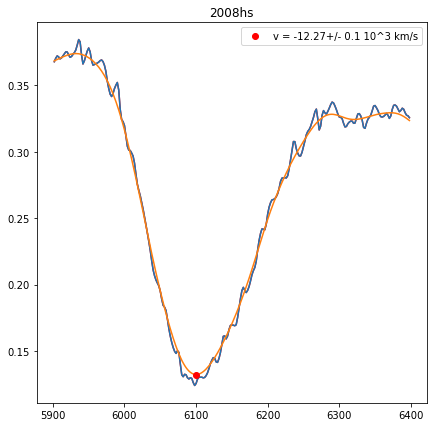

sn2008hs-20081205.326-ui.flm 54805.326 54878.39 -7.94
Velocity: (-12.270581404388267, 6100.0, 0.102312816851423)


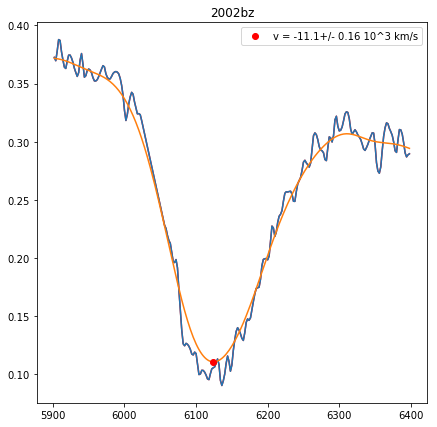

sn2002bz-20020408-ui.flm 52372.484 54878.39 5.64141032365
Velocity: (-11.095173645785795, 6124.0, 0.15510817929290735)


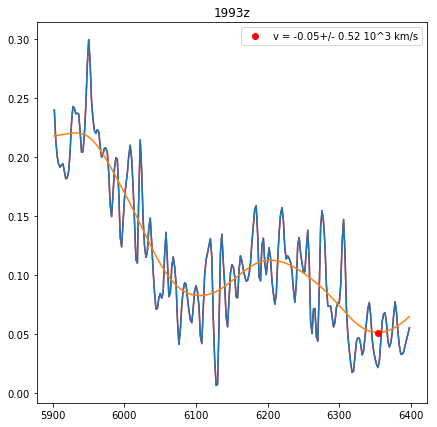

sn1993z-19940317-ui.flm 49428.236 54878.39 0.83
Velocity: (-0.04717797720421123, 6354.0, 0.51516602317719)


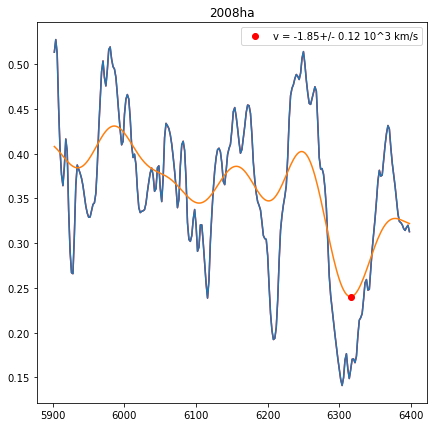

sn2008ha-20081120-ui.flm 54790.225 54878.39 7.46
Velocity: (-1.845441575337562, 6316.0, 0.12332535046780921)


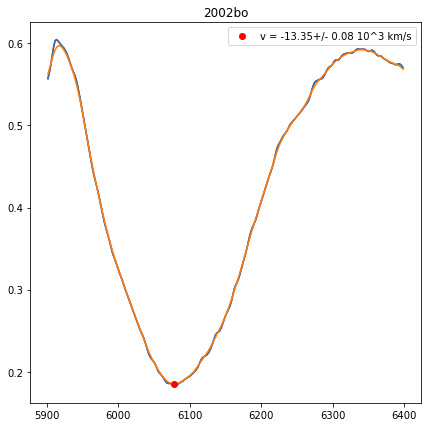

2002bo_20020323_3356_10385_00.dat 52356.0 54878.39 -0.477973392818
Velocity: (-13.351775323989612, 6078.0, 0.08057269559873062)
sn2012cg-visit1-hst.flm None 54878.39 2.1
Velocity: (nan, nan)


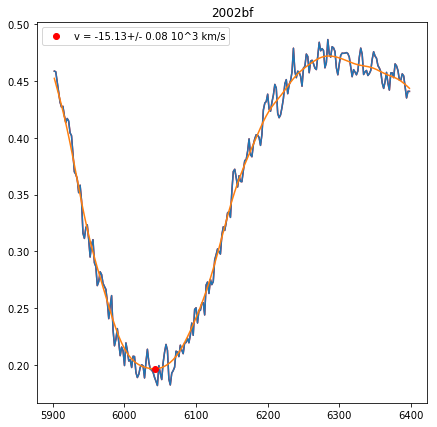

sn2002bf-20020306.22-fast.flm 52339.22 54878.39 2.79731340748
Velocity: (-15.128702271077849, 6042.0, 0.07730345948188615)


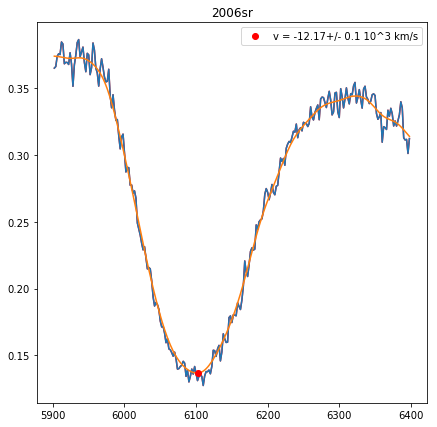

sn2006sr-20061222.12-fast.flm 54091.12 54878.39 -0.573163825258
Velocity: (-12.172468233516442, 6102.0, 0.0964270940535323)


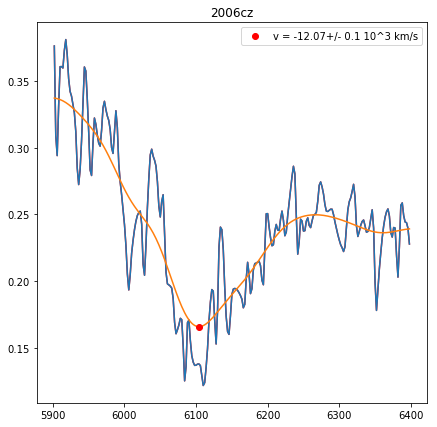

sn2006cz-20060626.304-ui.flm 53912.304 54878.39 2.66173929736
Velocity: (-12.07438460450608, 6104.0, 0.0994310889273264)


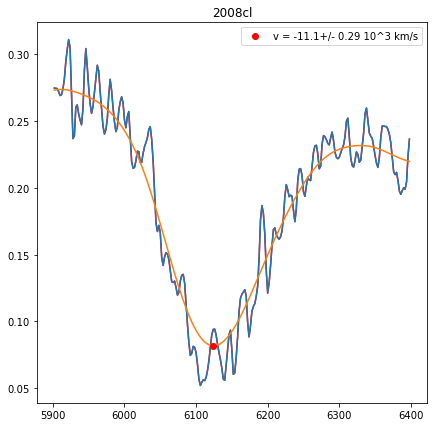

sn2008cl-20080517.308-ui.flm 54603.308 54878.39 4.24
Velocity: (-11.095173645785795, 6124.0, 0.28622232631295813)


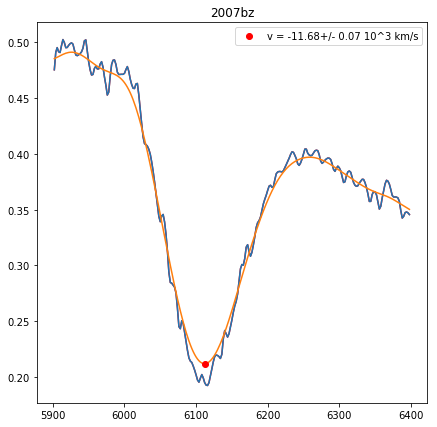

sn2007bz-20070426.419-ui.flm 54216.419 54878.39 0.94932558736
Velocity: (-11.682345555808643, 6112.0, 0.06926349907803779)


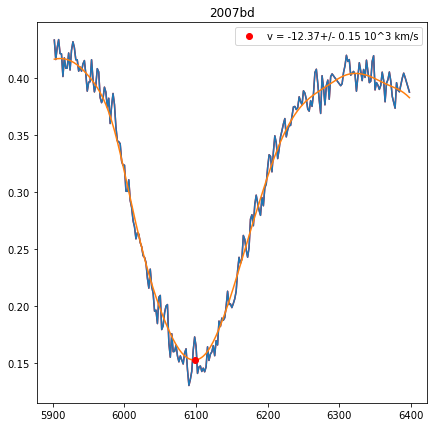

sn2007bd-20070415.20-fast.flm 54205.2 54878.39 -1.24162388885
Velocity: (-12.368724114647867, 6098.0, 0.1452618531337848)


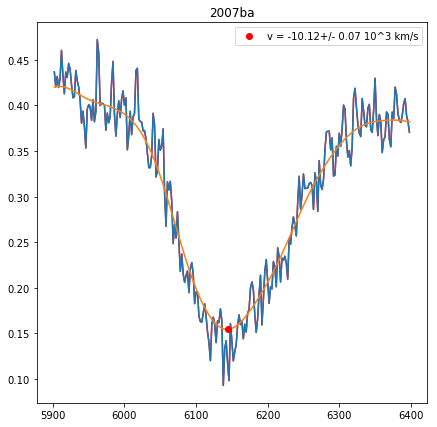

sn2007ba-20070409.43-fast.flm 54199.43 54878.39 9.05044038929
Velocity: (-10.118919436719901, 6144.0, 0.07228459495293589)


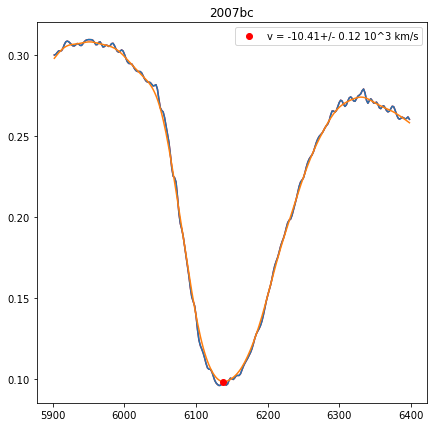

sn2007bc-20070410.323-ui-corrected.flm 54200.323 54878.39 0.725901253913
Velocity: (-10.411485110219218, 6138.0, 0.12264485909973102)


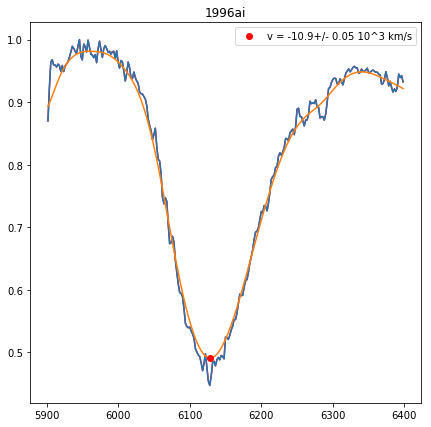

sn1996ai-19960620.15-mmt.flm 50254.15 54878.39 13.3538552329
Velocity: (-10.899686192972935, 6128.0, 0.048051803744727145)


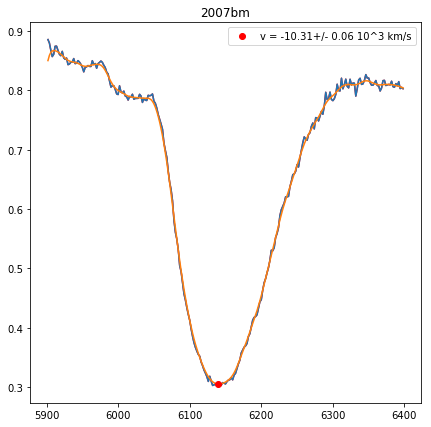

sn2007bm-20070511.16-fast.flm 54231.16 54878.39 7.0651185487
Velocity: (-10.313933633529203, 6140.0, 0.061193145643963276)


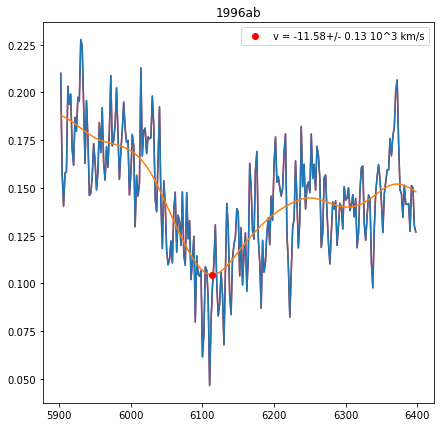

sn1996ab-19960522.37-fast.flm 50225.37 54878.39 -0.194690265481
Velocity: (-11.584409672466169, 6114.0, 0.12839211545080348)


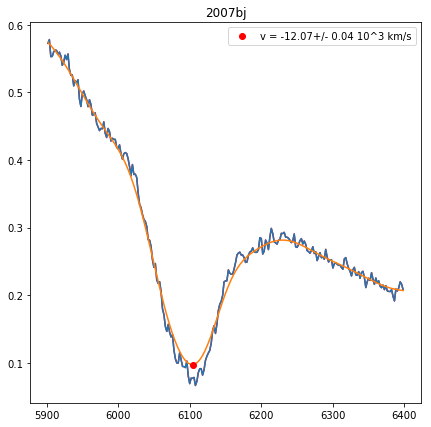

sn2007bj-20070422.41-fast.flm 54212.41 54878.39 12.0093478167
Velocity: (-12.07438460450608, 6104.0, 0.03922163387855733)


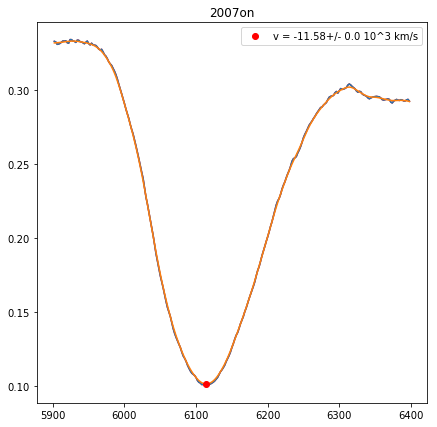

sn2007on-20071112.468-br.flm 54416.473 54878.39 -2.68555865827
Velocity: (-11.584409672466169, 6114.0, 3.552713678800501e-15)


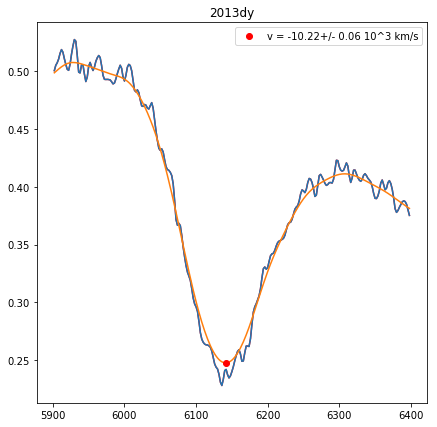

sn2013dy-visit3-hst.flm None 54878.39 -0.8
Velocity: (-10.216411741678657, 6142.0, 0.05903553554965167)


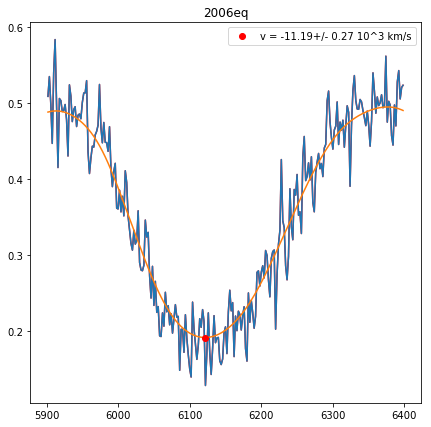

sn2006eq-20060902.26-fast.flm 53980.26 54878.39 4.68790644006
Velocity: (-11.192961724806997, 6122.0, 0.27126720095517604)


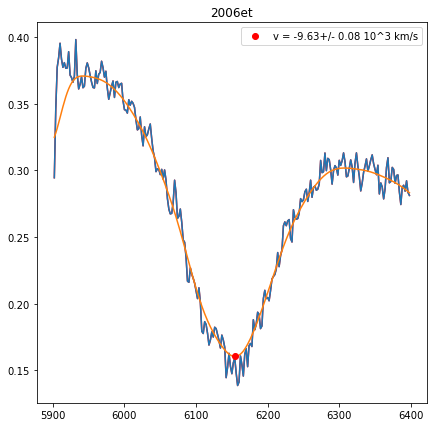

sn2006et-20060918.36-fast.flm 53996.36 54878.39 2.35762571152
Velocity: (-9.631901785684354, 6154.0, 0.08175516578258983)


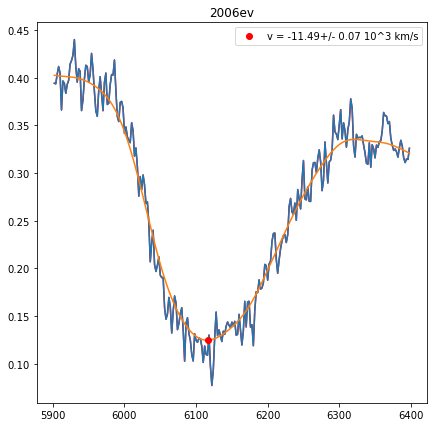

sn2006ev-20060916.23-fast.flm 53994.23 54878.39 9.88691915201
Velocity: (-11.486503345380463, 6116.0, 0.07336189064842022)


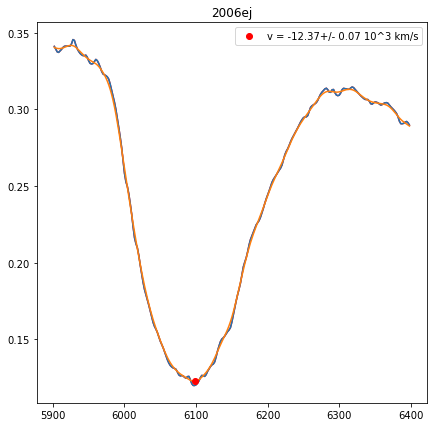

sn2006ej-20060824.430-ui.flm 53971.43 54878.39 -0.386103412998
Velocity: (-12.368724114647867, 6098.0, 0.07258030226120911)


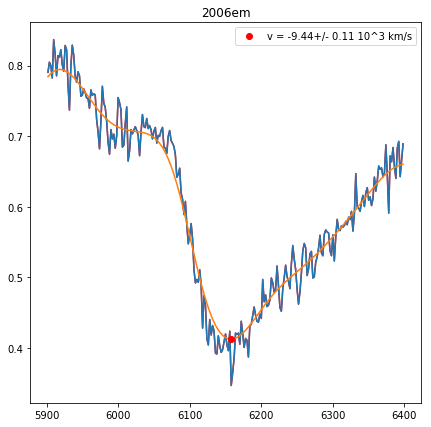

sn2006em-20060902.41-fast.flm 53980.41 54878.39 6.00157177015
Velocity: (-9.437301903025991, 6158.0, 0.11224324245372828)


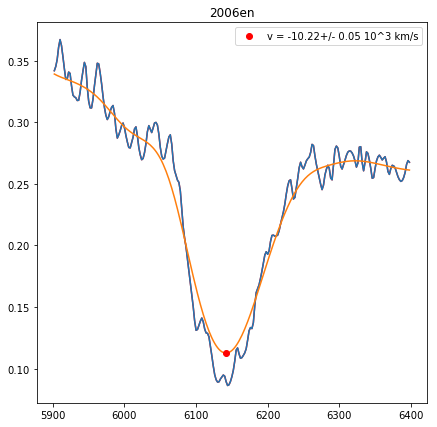

sn2006en-20060902.319-ui-corrected.flm 53980.319 54878.39 8.8222268952
Velocity: (-10.216411741678657, 6142.0, 0.048760945925272914)


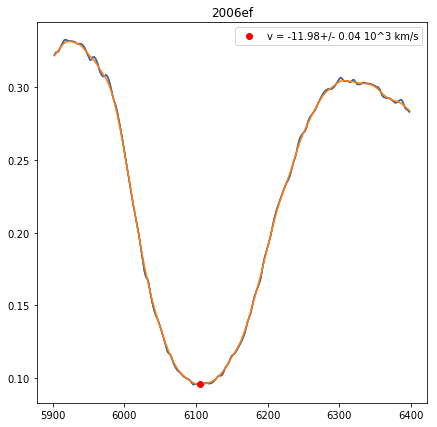

sn2006ef-20060824.454-ui-corrected.flm 53971.454 54878.39 4.43362917059
Velocity: (-11.976330519809686, 6106.0, 0.03920981518056479)


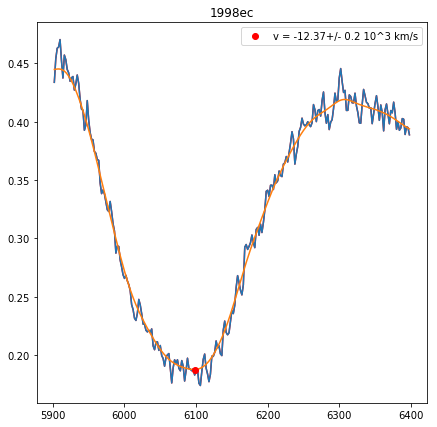

sn1998ec-19980930.50-fast.flm 51086.5 54878.39 -2.55809393077
Velocity: (-12.368724114647867, 6098.0, 0.20420358169053857)


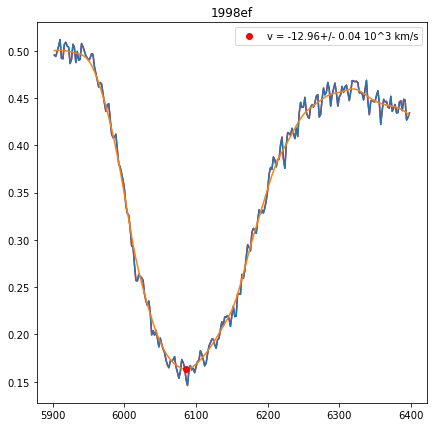

sn1998ef-19981029.31-fast.flm 51115.31 54878.39 1.4826940423
Velocity: (-12.958200562113579, 6086.0, 0.04137620736525647)


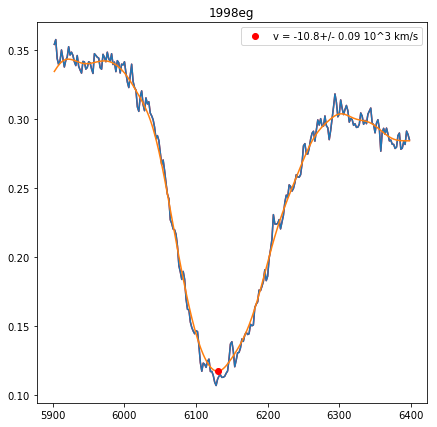

sn1998eg-19981024.15-fast.flm 51110.15 54878.39 -1.20320855615
Velocity: (-10.801986823599174, 6130.0, 0.08593694402472311)


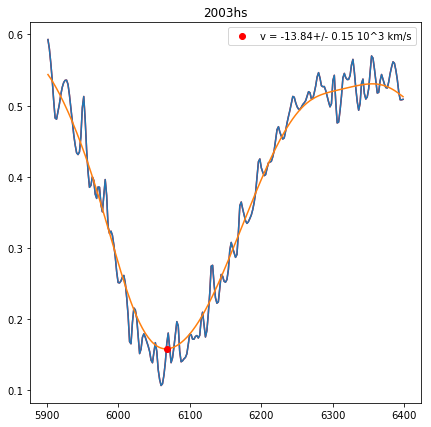

sn2003hs-20030903-ui.flm 52885.316 54878.39 -5.49
Velocity: (-13.84440774713146, 6068.0, 0.14849200552073746)


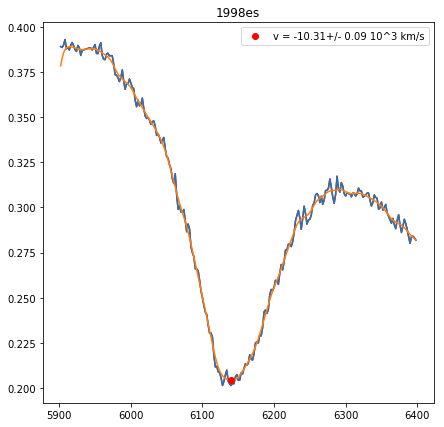

sn1998es-19981125.22-fast.flm 51142.22 54878.39 0.465085442134
Velocity: (-10.313933633529203, 6140.0, 0.09422035701311123)


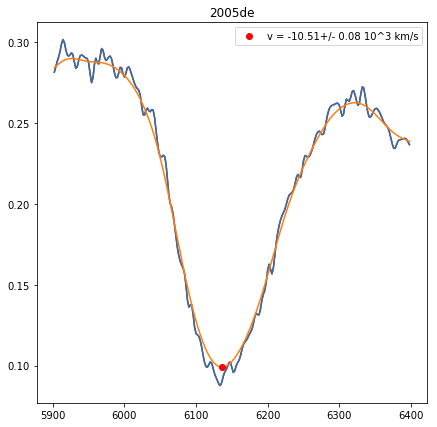

sn2005de-20050815.340-ui-corrected.flm 53597.34 54878.39 -0.75
Velocity: (-10.50906616967564, 6136.0, 0.07928724349437484)


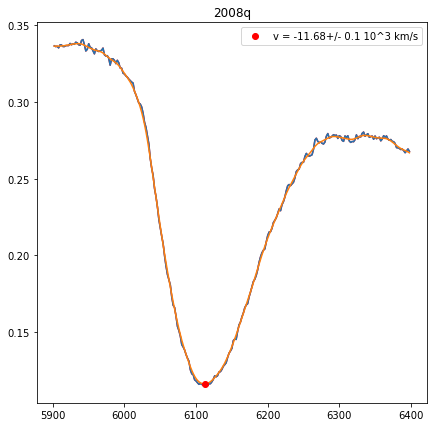

sn2008Q-20080209.09-fast.flm 54505.09 54878.39 -0.307509175682
Velocity: (-11.682345555808643, 6112.0, 0.09779157469240028)


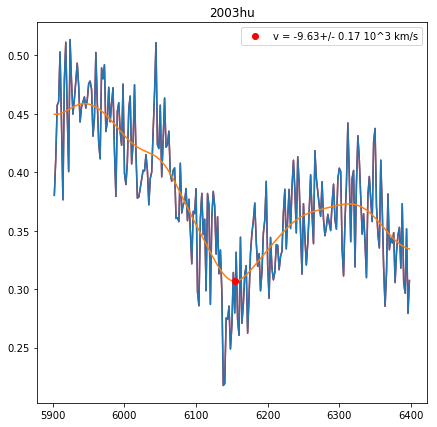

sn2003hu-20030919.19-fast.flm 52901.19 54878.39 8.0223255814
Velocity: (-9.631901785684354, 6154.0, 0.16545043771232013)


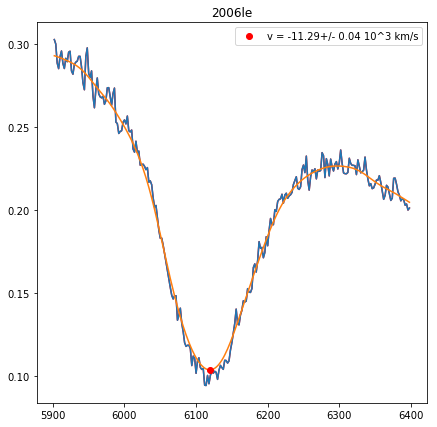

sn2006le-20061111.39-fast.flm 54050.39 54878.39 3.42823893882
Velocity: (-11.290779369257717, 6120.0, 0.04439934972929859)


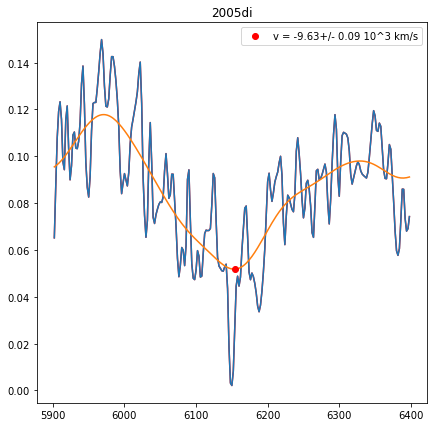

sn2005di-20050826.406-ui.flm 53608.406 54878.39 0.49
Velocity: (-9.631901785684354, 6154.0, 0.09097197794834556)


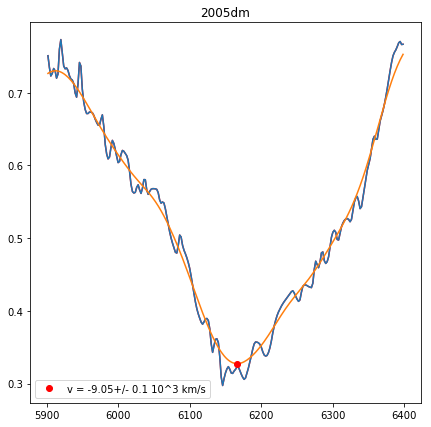

sn2005dm-20050902.420-ui-corrected.flm 53615.42 54878.39 5.23
Velocity: (-9.048457383292659, 6166.0, 0.10285081753114181)


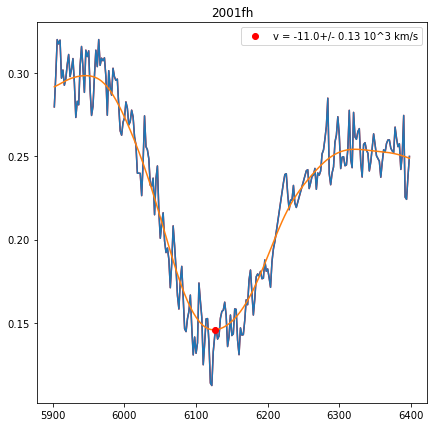

sn2001fh-20011109.10-fast.flm 52222.1 54878.39 -1.19349648072
Velocity: (-10.997415134434632, 6126.0, 0.1263636191452249)


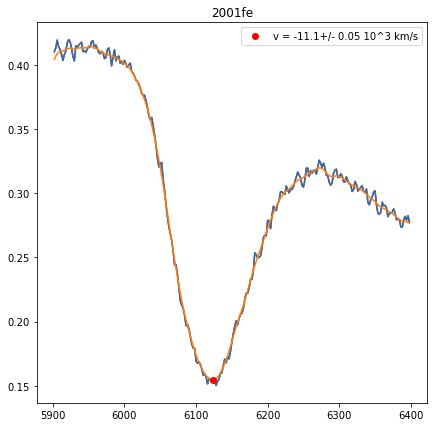

sn2001fe-20011116.51-fast.flm 52229.51 54878.39 -0.0128263441259
Velocity: (-11.095173645785795, 6124.0, 0.04632307076024404)
sn1999by-19990513.18-fast.flm 51311.18 54878.39 1.51677230852
Velocity: (nan, nan)


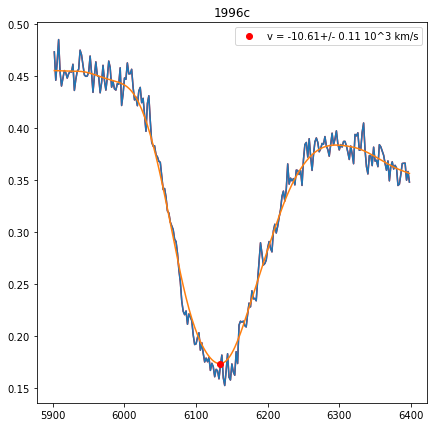

sn1996C-19960217.48-fast.flm 50130.48 54878.39 1.86368062318
Velocity: (-10.606676809804412, 6134.0, 0.10772476246400091)


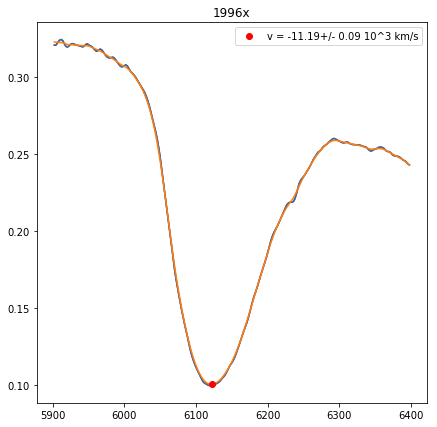

1996X_19960418_3079_10670_00.dat 50191.0 54878.39 0.0933516726309
Velocity: (-11.192961724806997, 6122.0, 0.08685139806435743)


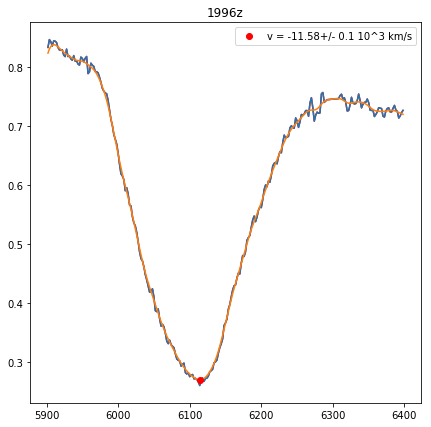

sn1996Z-19960518.18-fast.flm 50221.18 54878.39 6.2268317495
Velocity: (-11.584409672466169, 6114.0, 0.10339922778891314)


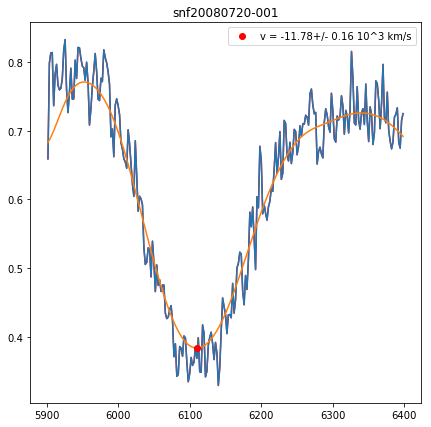

snf20080720-001-20080724.44-fast.flm 54671.44 54878.39 -0.352630032325
Velocity: (-11.780310993061766, 6110.0, 0.1589624879059887)


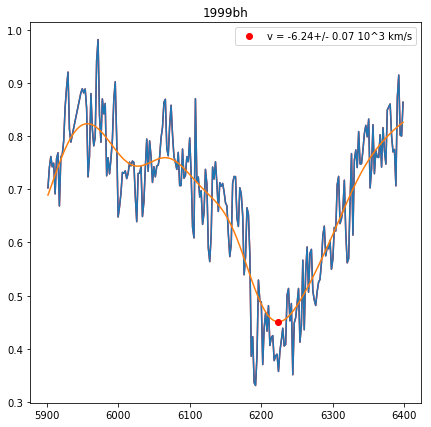

sn1999bh-19990409.27-fast.flm 51277.27 54878.39 5.08255464729
Velocity: (-6.243509518950409, 6224.0, 0.07295161582188171)


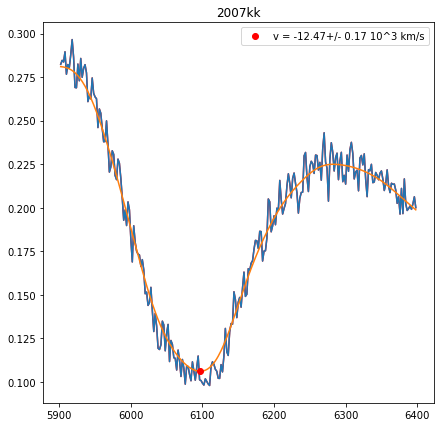

sn2007kk-20071008.41-fast.flm 54381.41 54878.39 -0.758885686833
Velocity: (-12.466896361799964, 6096.0, 0.16963427305972595)


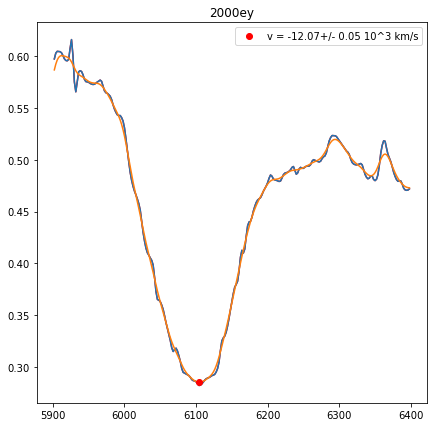

sn2000ey-20001129-ui.flm 51877.157 54878.39 7.9
Velocity: (-12.07438460450608, 6104.0, 0.046463075382465316)


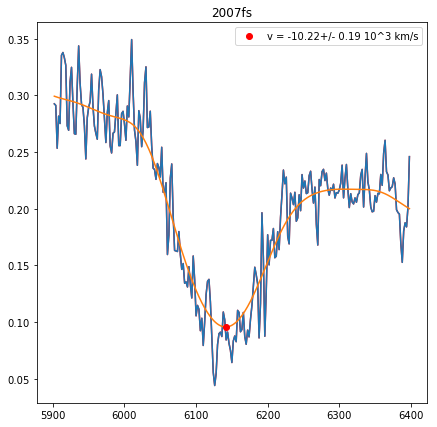

sn2007fs-20070718.42-fast.flm 54299.42 54878.39 3.06726753651
Velocity: (-10.216411741678657, 6142.0, 0.19321698732646253)


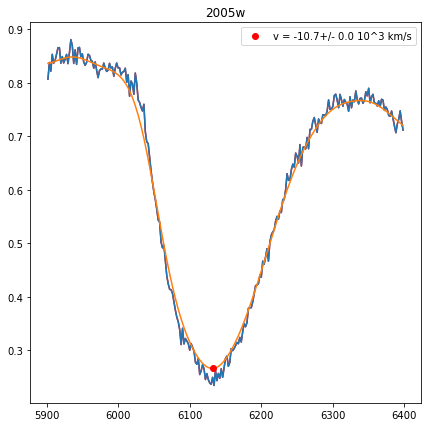

sn2005w-20050211.200-br.flm 53412.2 54878.39 0.663105336289
Velocity: (-10.704317028490788, 6132.0, 0.0)


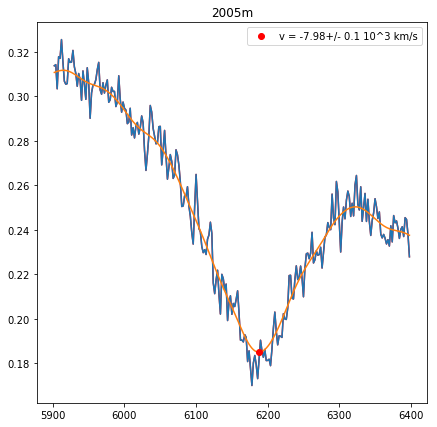

sn2005M-20050204.26-fast.flm 53405.26 54878.39 0.541095890411
Velocity: (-7.981578104319885, 6188.0, 0.1042355734940794)


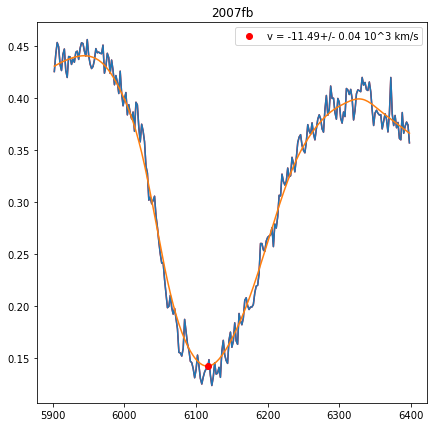

sn2007fb-20070707.44-fast.flm 54288.44 54878.39 1.7091851018
Velocity: (-11.486503345380463, 6116.0, 0.04267875210744109)


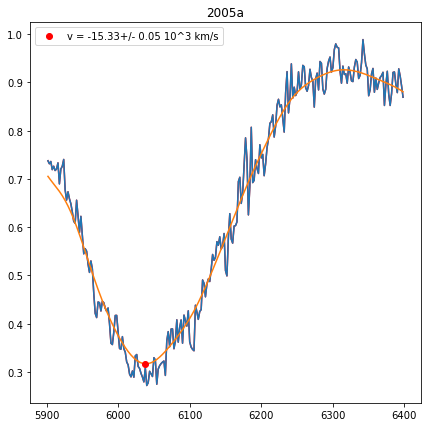

sn2005A-20050108.13-fast.flm 53378.13 54878.39 1.23540378765
Velocity: (-15.326728084622237, 6038.0, 0.04915602495067955)


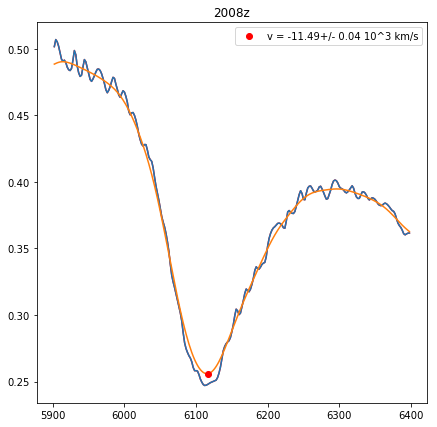

sn2008z-20080216.463-ui.flm 54512.463 54878.39 -2.1910106857
Velocity: (-11.486503345380463, 6116.0, 0.04180151665494215)


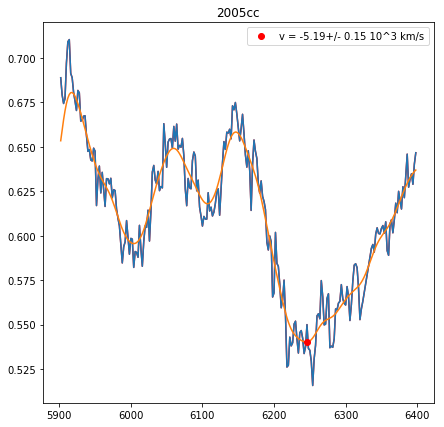

sn2005cc-20050531.20-fast.flm 53521.2 54878.39 2.58046075119
Velocity: (-5.186085714032509, 6246.0, 0.14510118593826943)


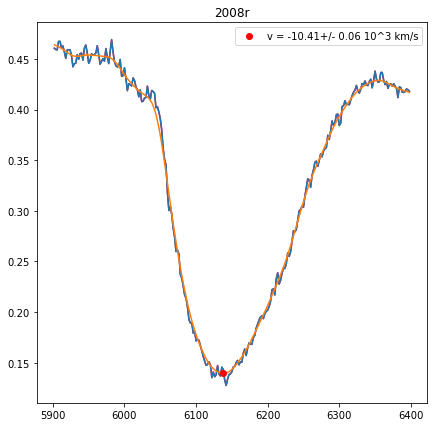

sn2008R-20080202.13-fast.flm 54498.13 54878.39 4.66502220029
Velocity: (-10.411485110219218, 6138.0, 0.055729320007504024)


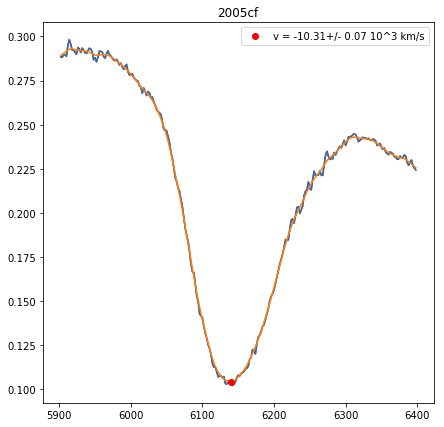

sn2005cf-20050612.36-fast.flm 53533.36 54878.39 0.0317945752486
Velocity: (-10.313933633529203, 6140.0, 0.07040748919863168)


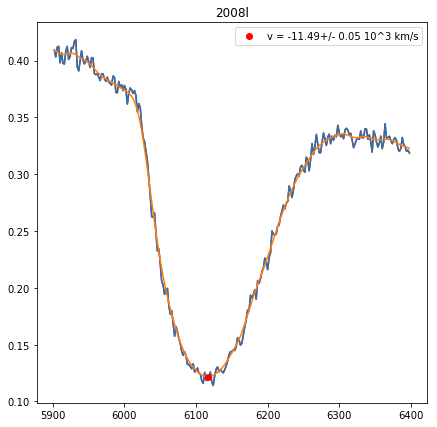

sn2008L-20080202.15-fast.flm 54498.15 54878.39 4.74592897783
Velocity: (-11.486503345380463, 6116.0, 0.04794962810148031)


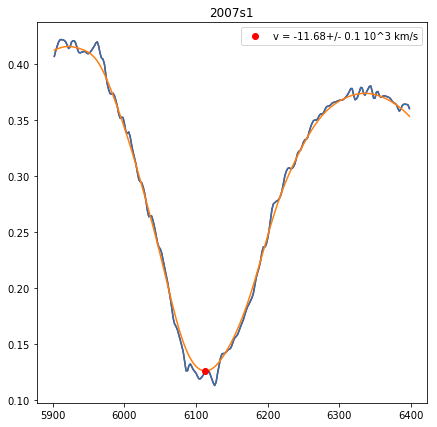

sn2007s1-20071102.133-ui-corrected.flm 54406.133 54878.39 -1.23
Velocity: (-11.682345555808643, 6112.0, 0.10393943733421108)


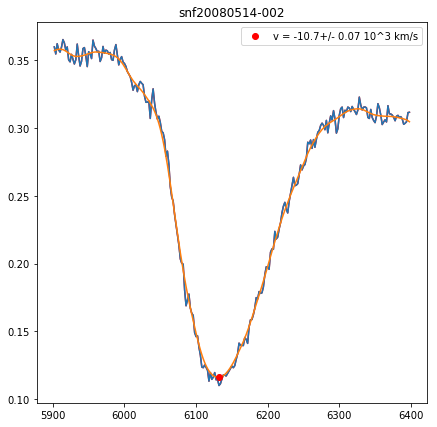

snf20080514-002-20080528.31-fast.flm 54614.31 54878.39 2.55406595557
Velocity: (-10.704317028490788, 6132.0, 0.07198084084256631)


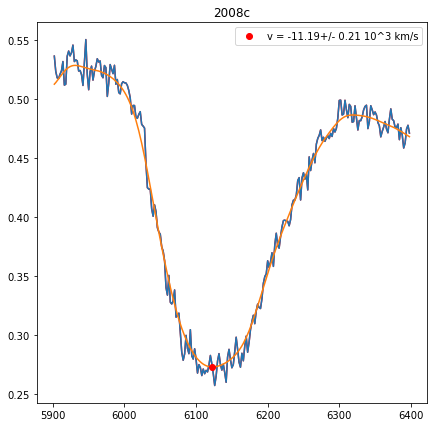

sn2008C-20080105.27-fast.flm 54470.27 54878.39 5.7581120944
Velocity: (-11.192961724806997, 6122.0, 0.21151438637629208)


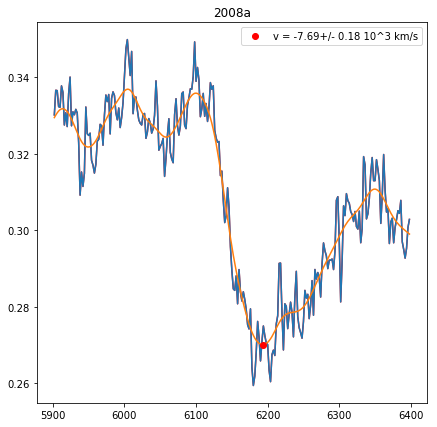

sn2008A-20080113.13-fast.flm 54478.13 54878.39 0.0295151255168
Velocity: (-7.691233133814922, 6194.0, 0.17506345723969421)


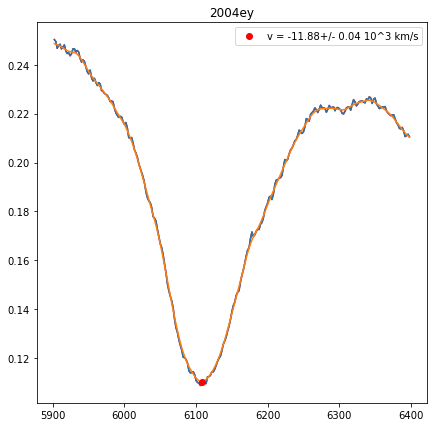

sn2004ey-20041018-br.flm 53296.203 54878.39 -7.04085309307
Velocity: (-11.878305981858274, 6108.0, 0.03919799551860308)


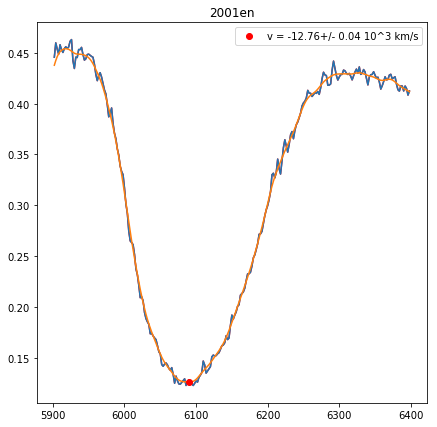

sn2001en-20011011.39-fast.flm 52193.39 54878.39 2.00320710011
Velocity: (-12.761590299337318, 6090.0, 0.043113521847289143)


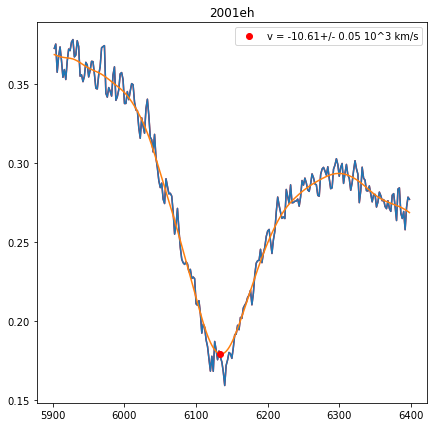

sn2001eh-20010917.39-fast.flm 52169.39 54878.39 -0.38089323804
Velocity: (-10.606676809804412, 6134.0, 0.04745344919443579)


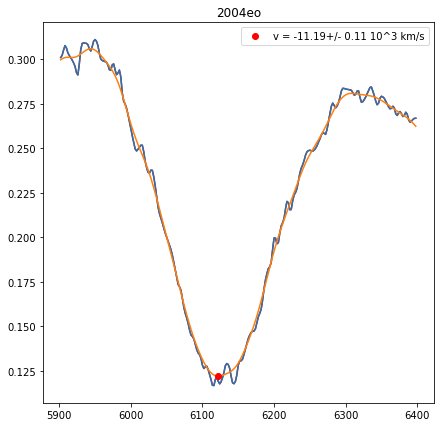

sn2004eo-20040924.242-ui.flm 53272.242 54878.39 -5.31947886238
Velocity: (-11.192961724806997, 6122.0, 0.10684528747112808)


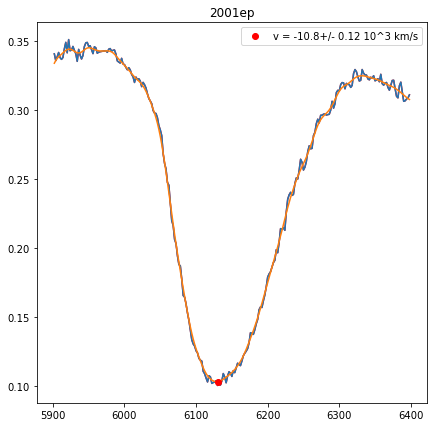

sn2001ep-20011017.42-fast.flm 52199.42 54878.39 -0.325723575183
Velocity: (-10.801986823599174, 6130.0, 0.1173158130407572)


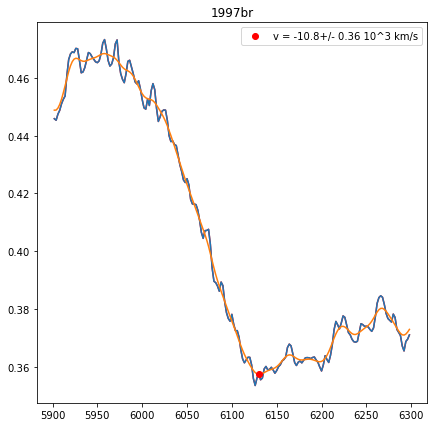

sn1997br-19970416-uoi.flm 50554.43 54878.39 -4.41866036556
Velocity: (-10.801986823599174, 6130.0, 0.357916152921015)


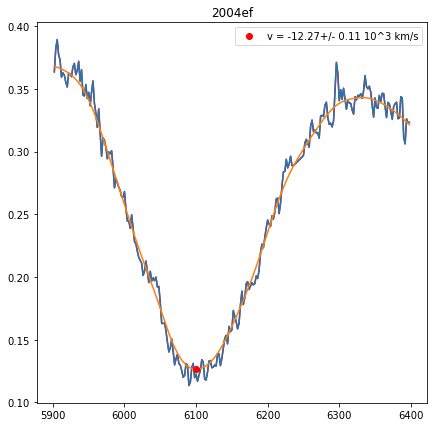

sn2004ef-20040915.30-fast.flm 53263.3 54878.39 -0.261885478447
Velocity: (-12.270581404388267, 6100.0, 0.10614937341961052)


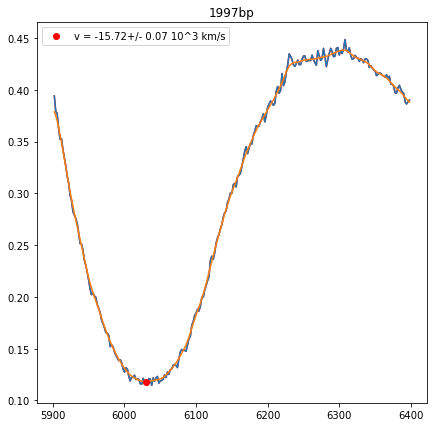

sn1997bp-19970410.27-fast.flm 50548.27 54878.39 0.0932251128592
Velocity: (-15.723133109336263, 6030.0, 0.0698899936588148)


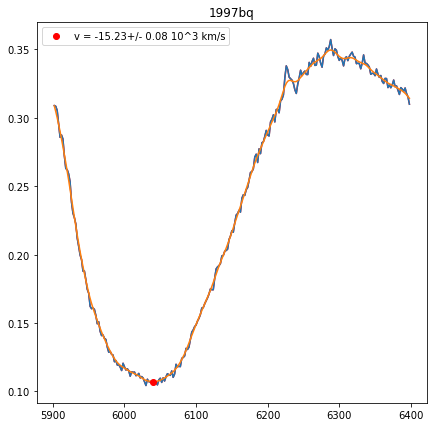

sn1997bq-19970414.21-fast.flm 50552.21 54878.39 -5.45402666677
Velocity: (-15.227700450308582, 6040.0, 0.08403939669862061)


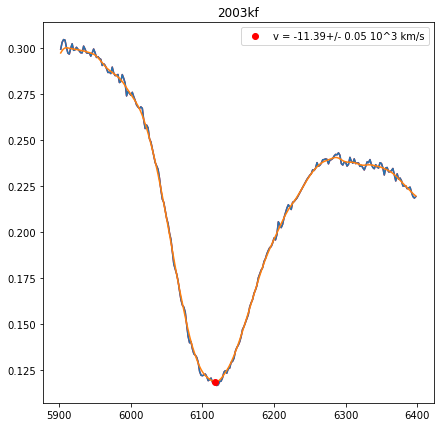

sn2003kf-20031204.43-fast.flm 52977.43 54878.39 -3.41973499784
Velocity: (-11.388626576876426, 6118.0, 0.049700428282906835)


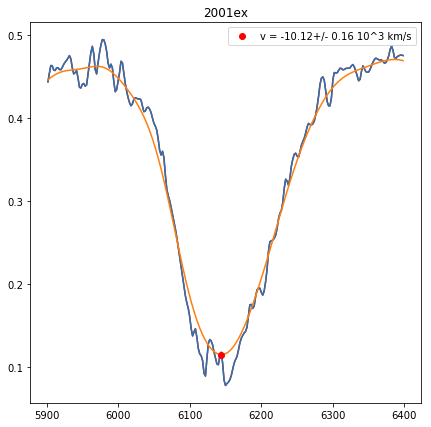

sn2001ex-20011020-ui-corrected.flm 52202.429 54878.39 -1.62805516097
Velocity: (-10.118919436719901, 6144.0, 0.1581566737555765)


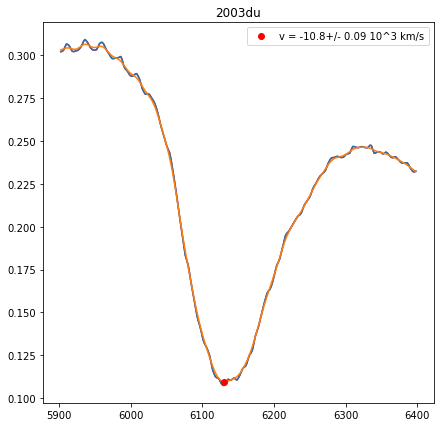

2003du_20030506_3446_7775_00.dat 52765.0 54878.39 -0.435221545654
Velocity: (-10.801986823599174, 6130.0, 0.08550675583590184)


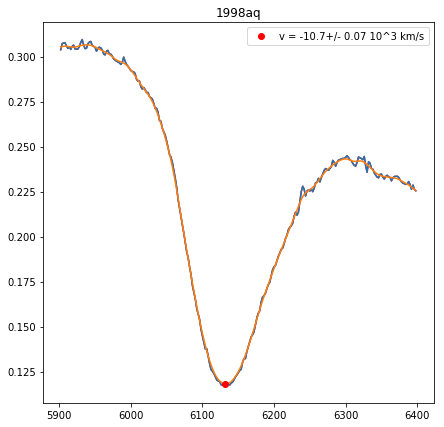

sn1998aq-19980427.29-fast.flm 50930.29 54878.39 -0.446348955211
Velocity: (-10.704317028490788, 6132.0, 0.07176755139491323)


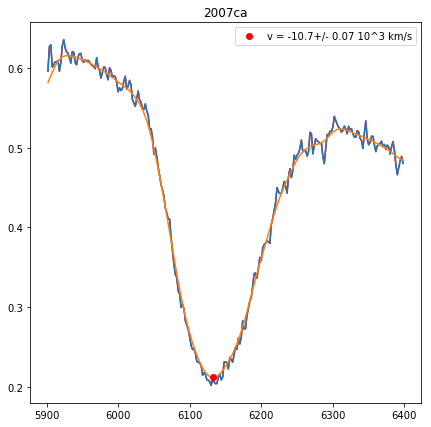

sn2007ca-20070510.23-fast.flm 54230.23 54878.39 3.48202188024
Velocity: (-10.704317028490788, 6132.0, 0.07029070394145383)


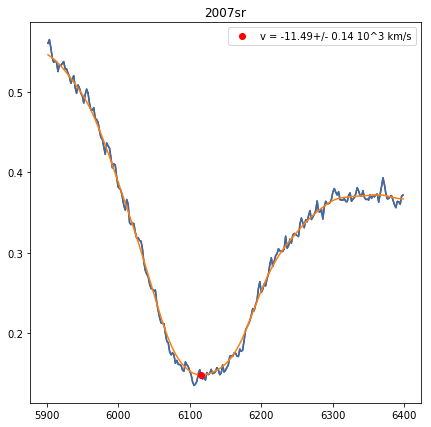

sn2007sr-20071229.53-fast.flm 54463.53 54878.39 15.2395330773
Velocity: (-11.486503345380463, 6116.0, 0.13906636289686336)


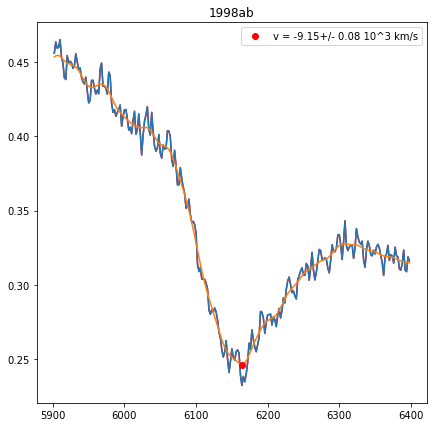

sn1998ab-19980418.28-fast.flm 50921.28 54878.39 6.85598345685
Velocity: (-9.145624102899788, 6164.0, 0.08261550879200659)


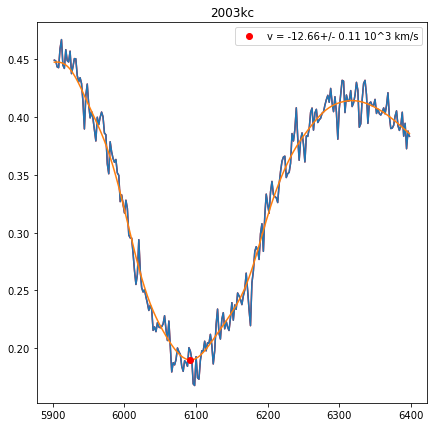

sn2003kc-20031203.49-fast.flm 52976.49 54878.39 -0.769471997032
Velocity: (-12.663329456693525, 6092.0, 0.10802571811579481)


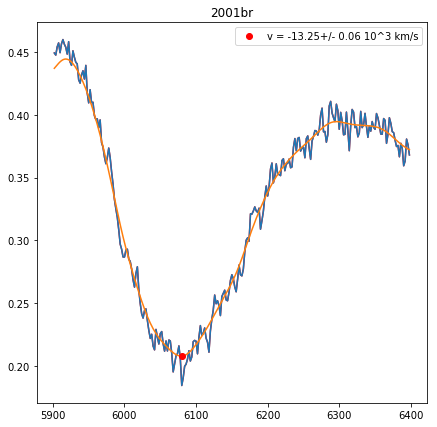

sn2001br-20010521.44-fast.flm 52050.44 54878.39 -0.450702900566
Velocity: (-13.253337360635408, 6080.0, 0.05823294320907106)


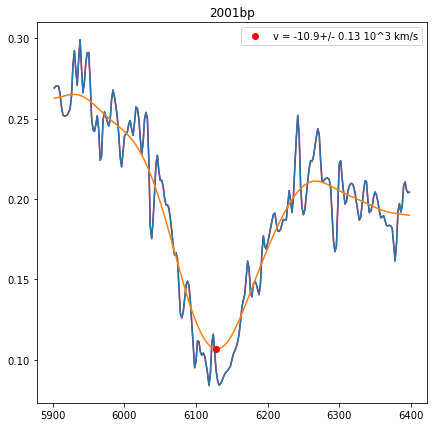

sn2001bp-far-20010516-ui.flm 52045.463 54878.39 0.51
Velocity: (-10.899686192972935, 6128.0, 0.1346778116366928)


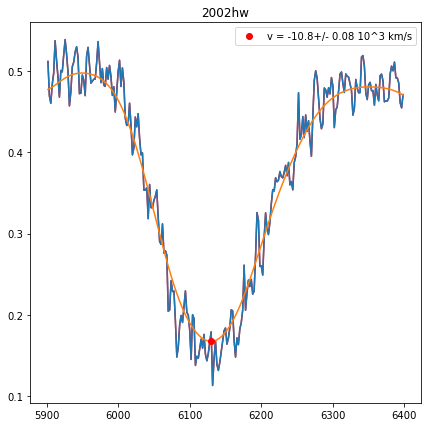

sn2002hw-20021114.10-fast.flm 52592.1 54878.39 -2.94240492956
Velocity: (-10.801986823599174, 6130.0, 0.07720640429587351)


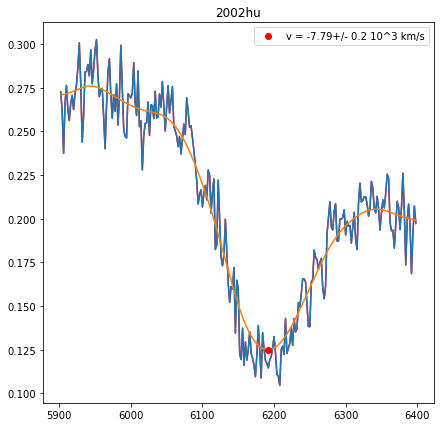

sn2002hu-20021113.25-fast.flm 52591.25 54878.39 -0.674757281553
Velocity: (-7.787985159628715, 6192.0, 0.19924812758808547)
sn2001ba-20010508.791-hst.flm 52037.0 54878.39 2.64482685271
Velocity: (nan, nan)


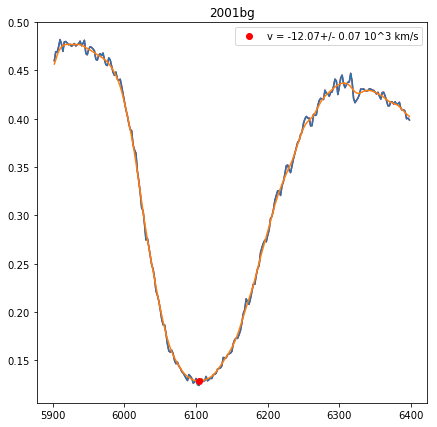

sn2001bg-20010515.23-fast.flm 52044.23 54878.39 4.20008698053
Velocity: (-12.07438460450608, 6104.0, 0.06558715347552117)


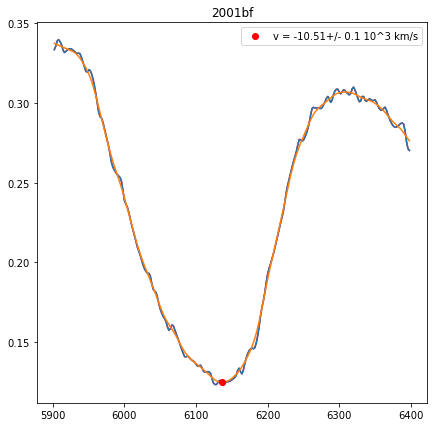

sn2001bf-20010516-ui-corrected.flm 52045.439 54878.39 1.95962387038
Velocity: (-10.50906616967564, 6136.0, 0.10286504788430699)


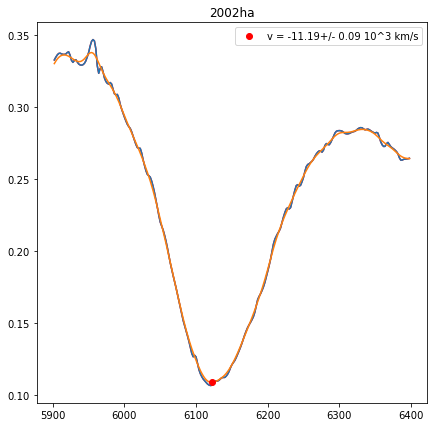

sn2002ha-20021102-ui-corrected.flm 52580.14 54878.39 -0.0433753943234
Velocity: (-11.192961724806997, 6122.0, 0.09209020751544521)


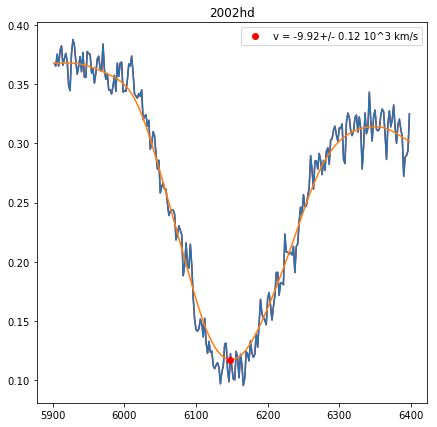

sn2002hd-20021029.52-fast.flm 52576.52 54878.39 9.77363011539
Velocity: (-9.92402359558339, 6148.0, 0.12074122569178283)


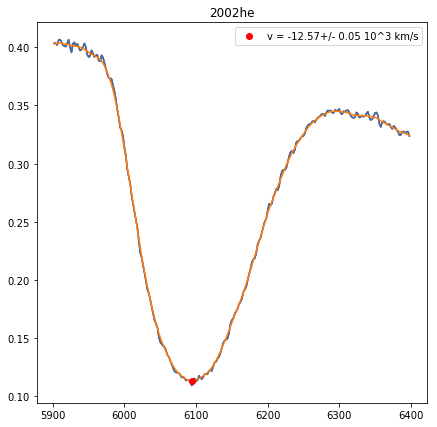

sn2002he-20021108-br.flm 52586.0 54878.39 0.0575854705037
Velocity: (-12.565098143327868, 6094.0, 0.046519045266374584)


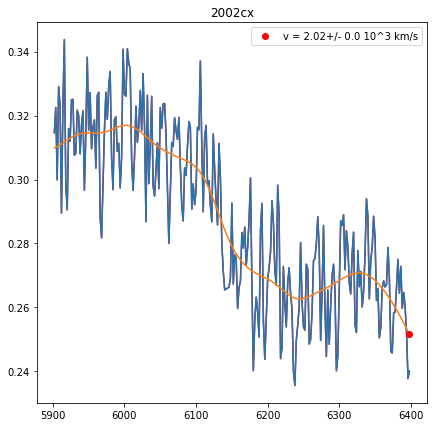

sn2002cx-20020517.23-fast.flm 52411.23 54878.39 12.6537775291
Velocity: (2.0216308539835866, 6398.0, 8.881784197001252e-16)


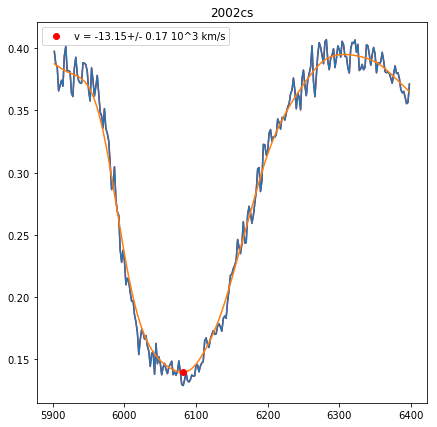

sn2002cs-20020519.39-fast.flm 52413.39 54878.39 3.33736639459
Velocity: (-13.15492891074885, 6082.0, 0.1700462667613678)


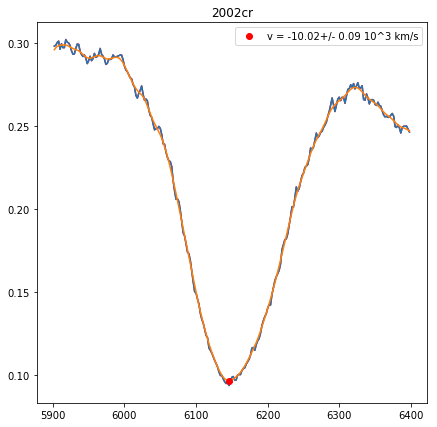

sn2002cr-20020515.28-fast.flm 52409.28 54878.39 0.888646720821
Velocity: (-10.021456720684506, 6146.0, 0.09352262797579569)


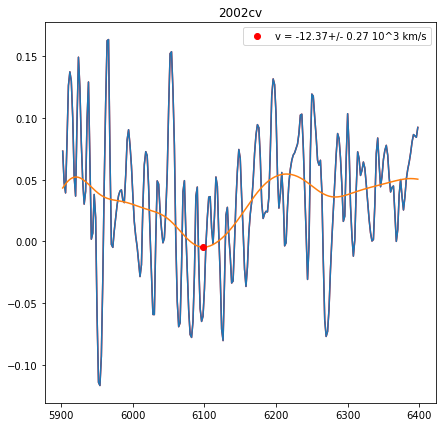

sn2002cv-20020519-ui.flm 52413.191 54878.39 -1.4
Velocity: (-12.368724114647867, 6098.0, 0.2710545756051718)


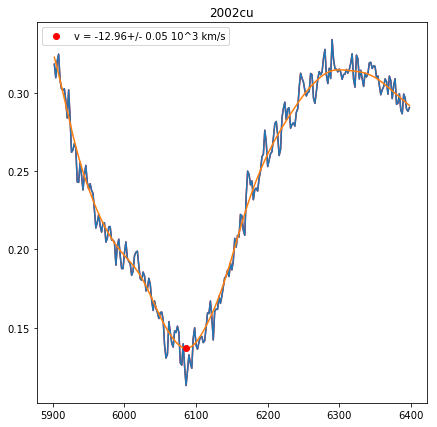

sn2002cu-20020518.47-fast.flm 52412.47 54878.39 -3.35182537674
Velocity: (-12.958200562113579, 6086.0, 0.051243120755151646)


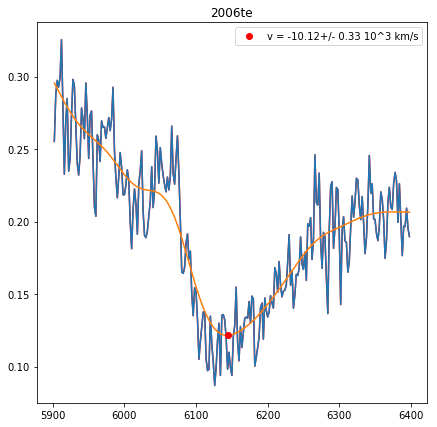

sn2006te-20070109.49-fast.flm 54109.49 54878.39 12.8044808413
Velocity: (-10.118919436719901, 6144.0, 0.32824679540595364)


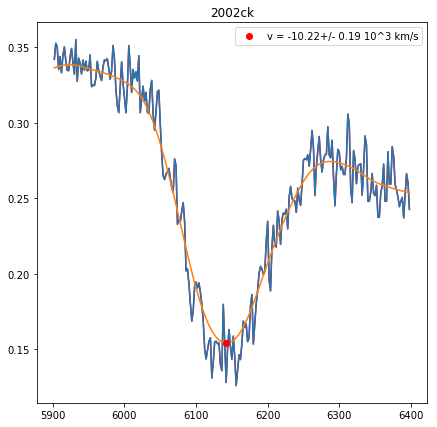

sn2002ck-20020502.46-fast.flm 52396.46 54878.39 0.378690778588
Velocity: (-10.216411741678657, 6142.0, 0.18733704244299693)
sn1992a-19920118.952-iue.flm 48639.0 54878.39 -1.39725180644
Velocity: (nan, nan)


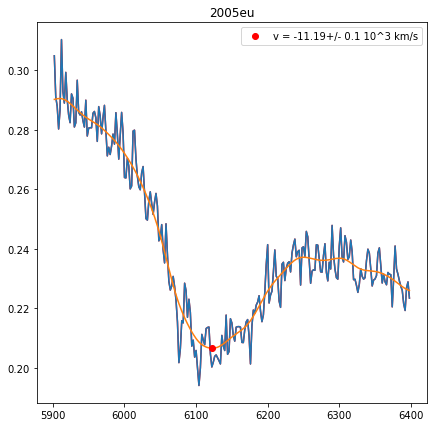

sn2005eu-20051011.37-fast.flm 53654.37 54878.39 -5.13479563243
Velocity: (-11.192961724806997, 6122.0, 0.10332010190697219)


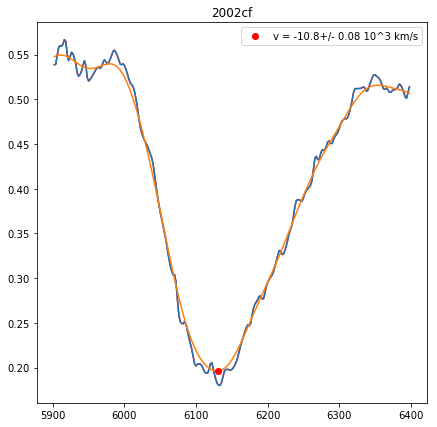

sn2002cf-20020420-ui-corrected.flm 52384.335 54878.39 -0.457902060169
Velocity: (-10.801986823599174, 6130.0, 0.0779271654723129)


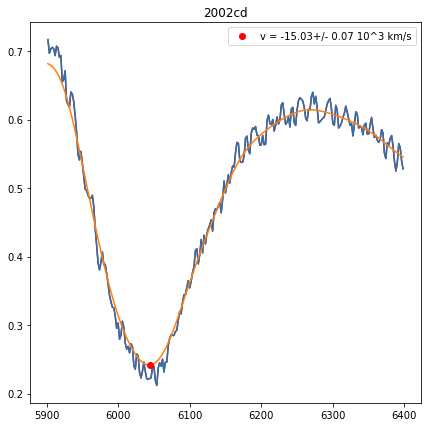

sn2002cd-20020419.48-fast.flm 52383.48 54878.39 0.3434473803
Velocity: (-15.029733550059401, 6044.0, 0.06795707672268501)


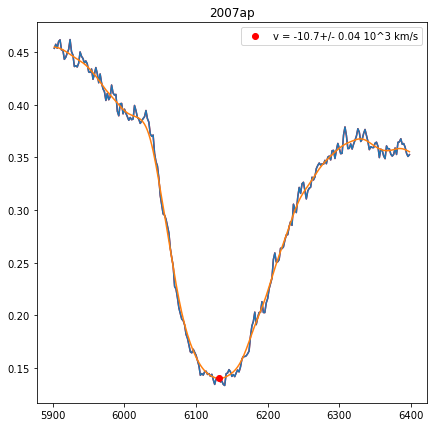

sn2007ap-20070315.45-fast.flm 54174.45 54878.39 9.24870400012
Velocity: (-10.704317028490788, 6132.0, 0.042828343506441185)


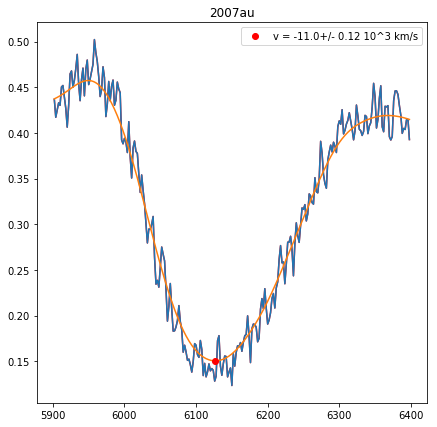

sn2007au-20070326.15-fast.flm 54185.15 54878.39 1.34922750112
Velocity: (-10.997415134434632, 6126.0, 0.12042636596066508)


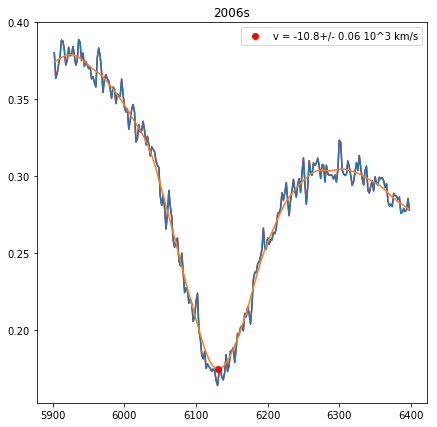

sn2006S-20060203.47-fast.flm 53769.47 54878.39 -0.120143164141
Velocity: (-10.801986823599174, 6130.0, 0.05900765806435499)


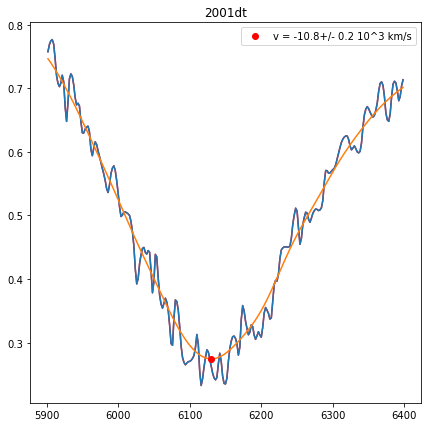

sn2001dt-20010912-ui.flm 52164.306 54878.39 13.6
Velocity: (-10.801986823599174, 6130.0, 0.20027645301451913)


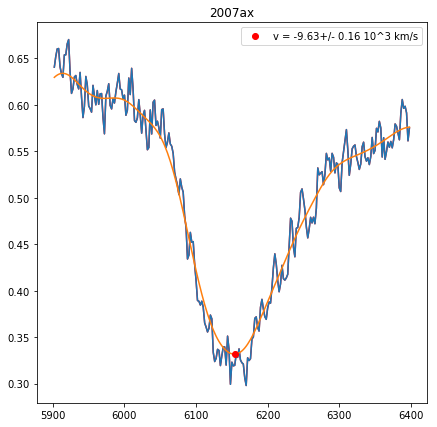

sn2007ax-20070327.26-fast.flm 54186.26 54878.39 -0.207572317595
Velocity: (-9.631901785684354, 6154.0, 0.16080078072138787)


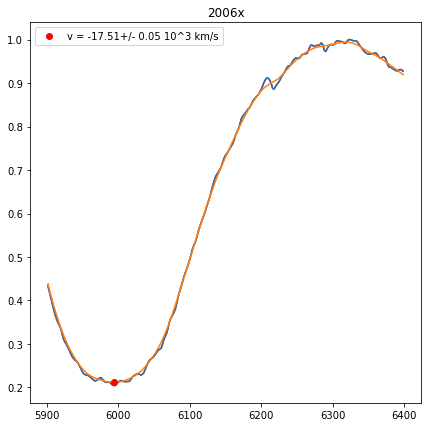

2006X_20060219_3731_8515_00.dat 53785.0 54878.39 -0.948032310693
Velocity: (-17.512781557345757, 5994.0, 0.04884487604943915)
sn2006d-20060120-snifs-b.dat 53755.0 54878.39 -1.49514178069
Velocity: (nan, nan)


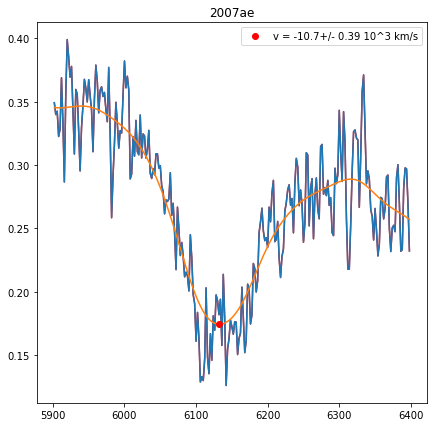

sn2007ae-20070225.54-fast.flm 54156.54 54878.39 2.48217988382
Velocity: (-10.704317028490788, 6132.0, 0.3913100098979929)


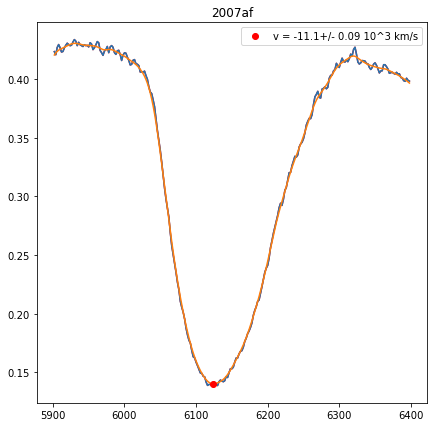

sn2007af-20070314.44-fast.flm 54173.44 54878.39 -0.253614251726
Velocity: (-11.095173645785795, 6124.0, 0.0885495511210297)


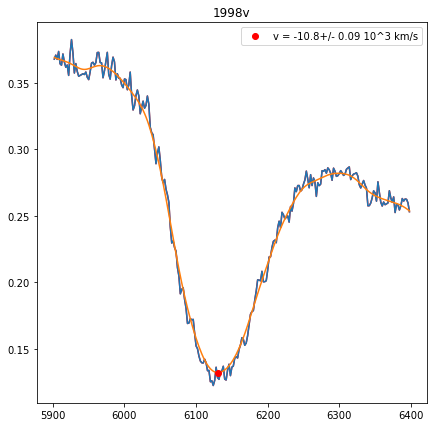

sn1998V-19980319.51-fast.flm 50891.51 54878.39 0.38620814359
Velocity: (-10.801986823599174, 6130.0, 0.0893655104669865)


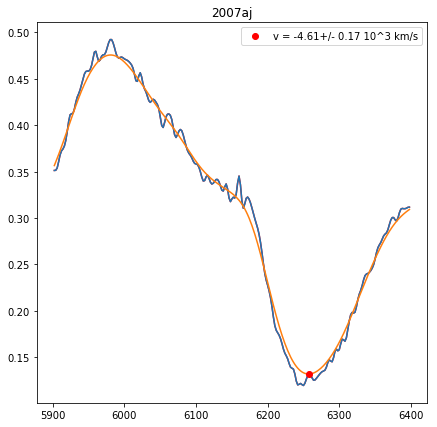

sn2007aj-20070313.374-ui.flm 54172.374 54878.39 10.75
Velocity: (-4.61082195256962, 6258.0, 0.16785236890762398)


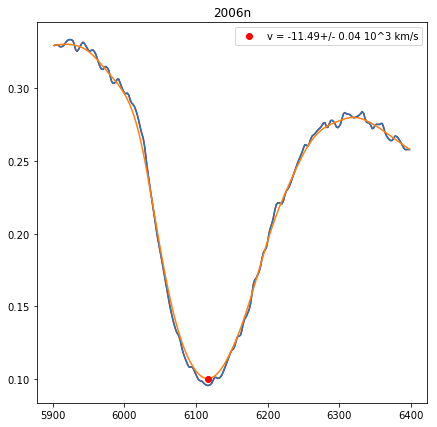

sn2006n-20060124.285-ui.flm 53759.285 54878.39 -0.458454643058
Velocity: (-11.486503345380463, 6116.0, 0.03839714485464786)


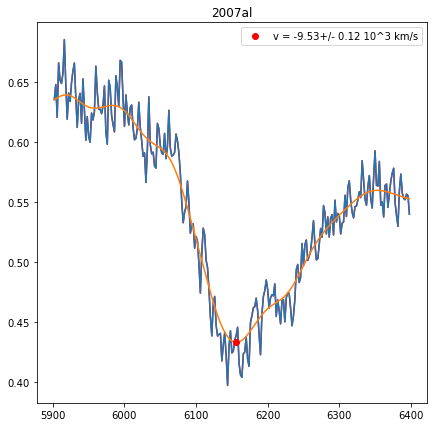

sn2007al-20070312.31-fast.flm 54171.31 54878.39 2.79200731099
Velocity: (-9.534587044015712, 6156.0, 0.12176193681087055)


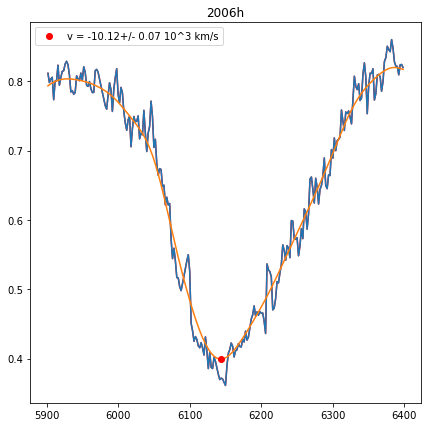

sn2006H-20060122.11-fast.flm 53757.11 54878.39 4.25348103981
Velocity: (-10.118919436719901, 6144.0, 0.06961261838554562)


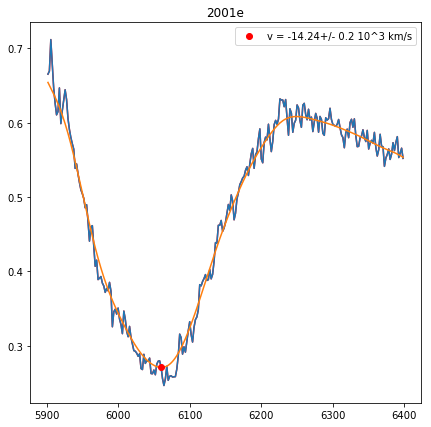

sn2001E-20010119.49-fast.flm 51928.49 54878.39 2.83539038126
Velocity: (-14.239044645731925, 6060.0, 0.1982761906378877)


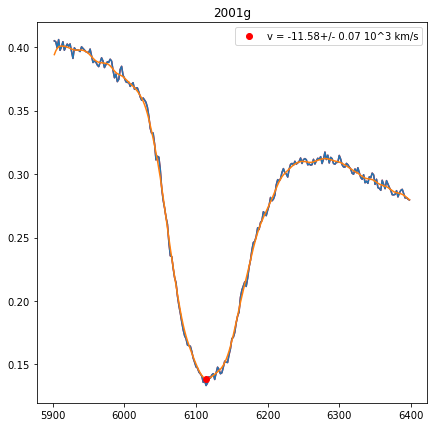

sn2001G-20010125.34-fast.flm 51934.34 54878.39 3.72650648622
Velocity: (-11.584409672466169, 6114.0, 0.06861427475420297)


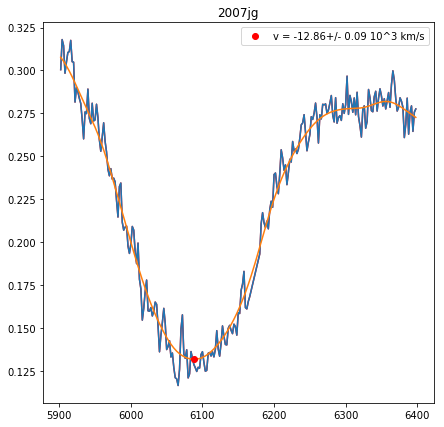

sn2007jg-20070920.46-fast.flm 54363.46 54878.39 -2.47124037369
Velocity: (-12.859880668678267, 6088.0, 0.08940420768405594)


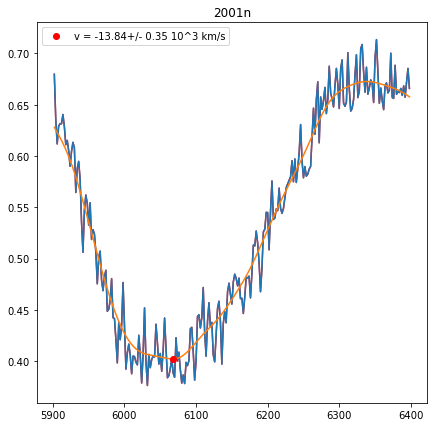

sn2001N-20010122.46-fast.flm 51931.46 54878.39 3.66004750129
Velocity: (-13.84440774713146, 6068.0, 0.3526313697512412)


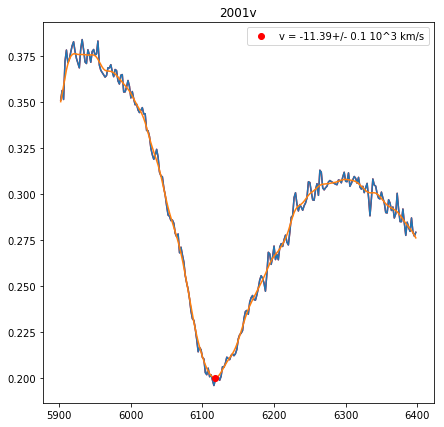

sn2001V-20010301.47-fast.flm 51969.47 54878.39 -2.41177988961
Velocity: (-11.388626576876426, 6118.0, 0.09945288290063303)


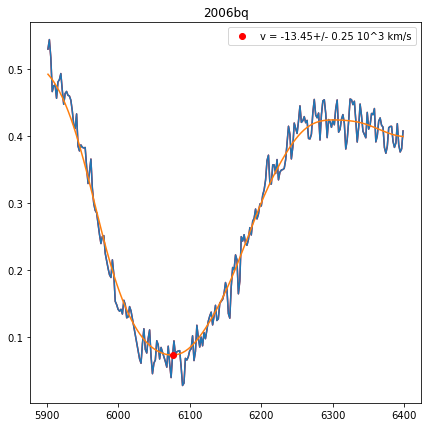

sn2006bq-20060427.35-fast.flm 53852.35 54878.39 6.92530127556
Velocity: (-13.450242798100463, 6076.0, 0.25230558386002655)


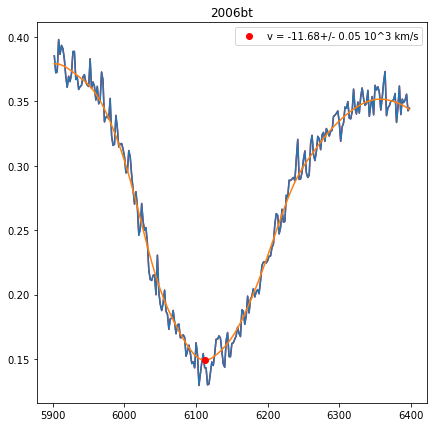

sn2006bt-20060501.39-fast.flm 53856.39 54878.39 -0.549335565557
Velocity: (-11.682345555808643, 6112.0, 0.048879719905050856)


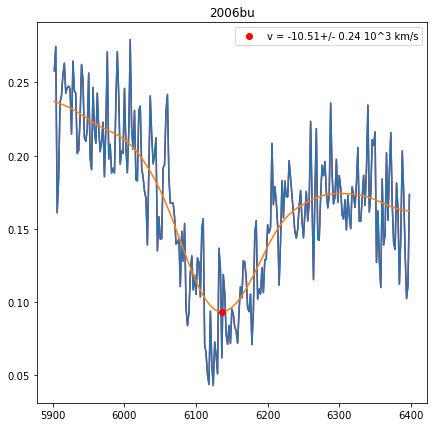

sn2006bu-20060505.19-fast.flm 53860.19 54878.39 6.83533765033
Velocity: (-10.50906616967564, 6136.0, 0.241001395368228)


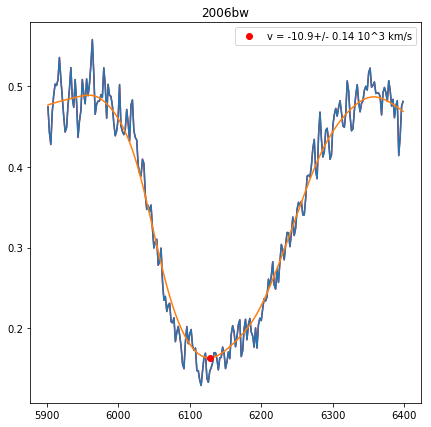

sn2006bw-20060502.31-fast.flm 53857.31 54878.39 8.83007994159
Velocity: (-10.899686192972935, 6128.0, 0.13520755689885253)


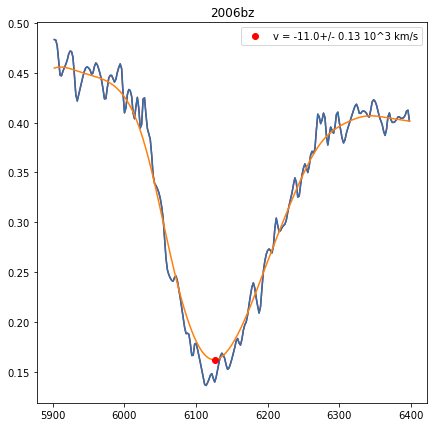

sn2006bz-20060505.218-ui.flm 53860.218 54878.39 12.0760069501
Velocity: (-10.997415134434632, 6126.0, 0.13274922183299967)


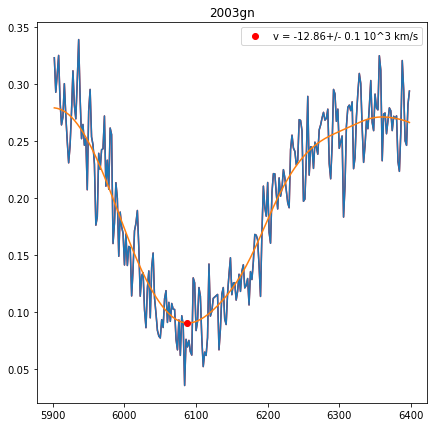

sn2003gn-20030729.37-fast.flm 52849.37 54878.39 -3.02576248248
Velocity: (-12.859880668678267, 6088.0, 0.0963976286546422)


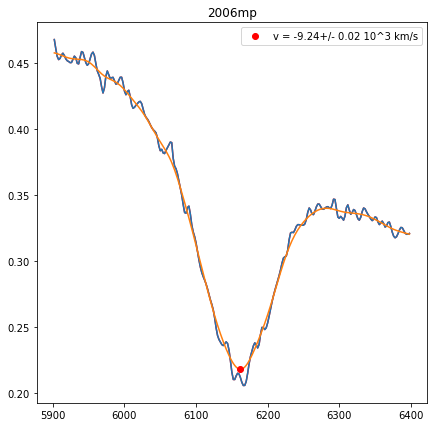

sn2006mp-20061120.101-ui.flm 54059.101 54878.39 5.55989031249
Velocity: (-9.242820430611571, 6162.0, 0.019046512621296457)


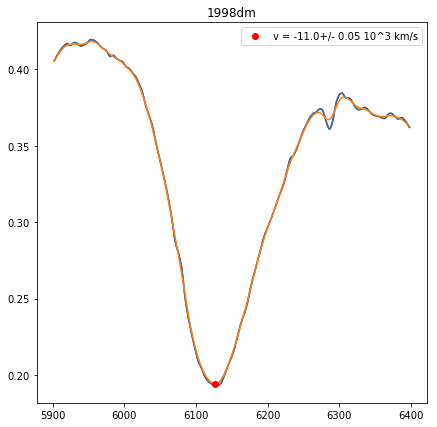

sn1998dm-19980831-ui-corrected.flm 51056.423 54878.39 -4.86520587957
Velocity: (-10.997415134434632, 6126.0, 0.04558822051178506)


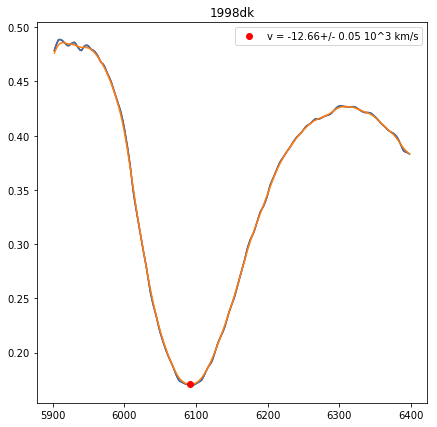

sn1998dk-19980831-ui.flm 51056.305 54878.39 -0.728371655089
Velocity: (-12.663329456693525, 6092.0, 0.045822565024209685)


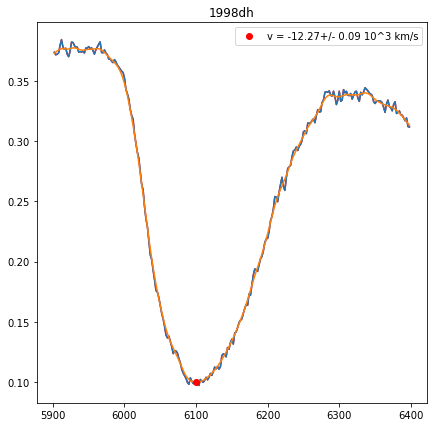

sn1998dh-19980804.36-fast.flm 51029.36 54878.39 -0.165515491558
Velocity: (-12.270581404388267, 6100.0, 0.09293500991421805)


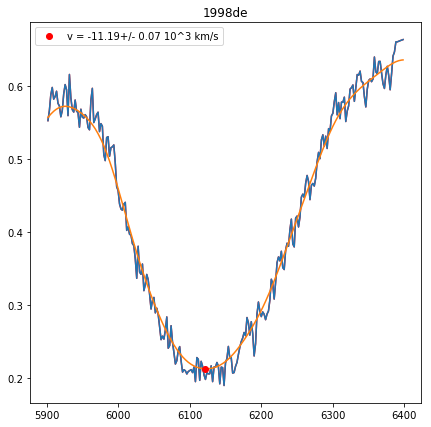

sn1998de-19980801.41-fast.flm 51026.41 54878.39 -0.457465092459
Velocity: (-11.192961724806997, 6122.0, 0.07245153493517704)


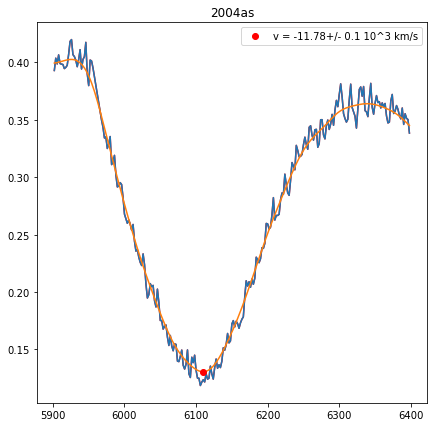

sn2004as-20040321.27-fast.flm 53085.27 54878.39 -0.46943757693
Velocity: (-11.780310993061766, 6110.0, 0.09706796184520448)


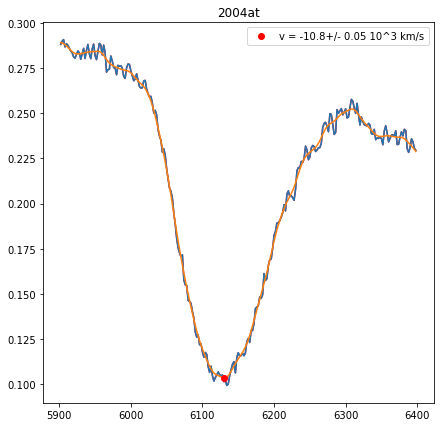

sn2004at-20040328.20-fast.flm 53092.2 54878.39 0.195478389373
Velocity: (-10.801986823599174, 6130.0, 0.04557442583800955)


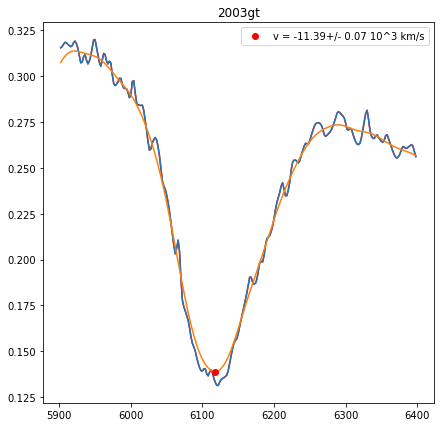

sn2003gt-20030805.248-ui-corrected.flm 52856.248 54878.39 -5.07
Velocity: (-11.388626576876426, 6118.0, 0.06672258779299492)


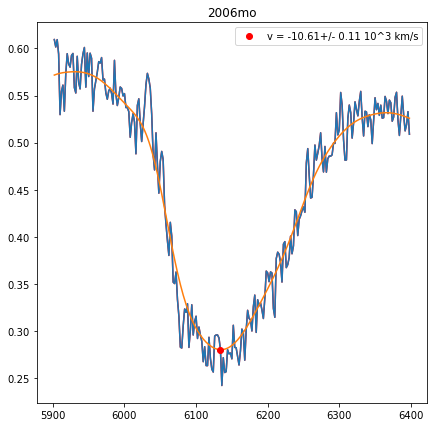

sn2006mo-20061113.21-fast.flm 54052.21 54878.39 6.42911006922
Velocity: (-10.606676809804412, 6134.0, 0.1094679061130088)


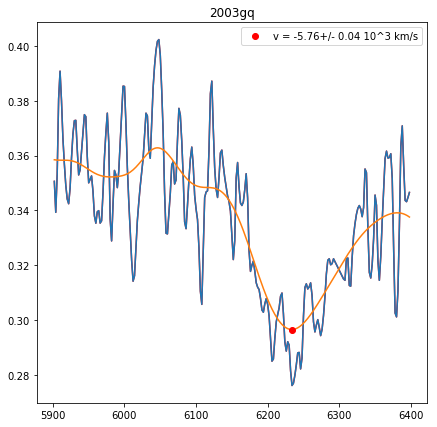

sn2003gq-20030727-ui.flm 52847.294 54878.39 -0.593275428607
Velocity: (-5.762417439647483, 6234.0, 0.042165665274339556)


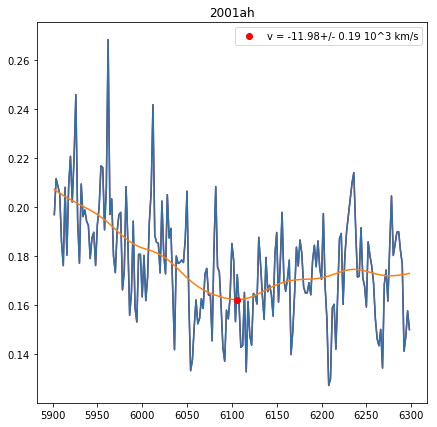

sn2001ah-20010329.25-fast.flm 51997.25 54878.39 -9.41332405583
Velocity: (-11.976330519809686, 6106.0, 0.1891294927265018)


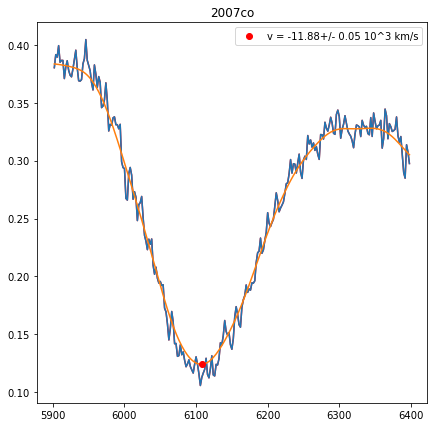

sn2007co-20070613.39-fast.flm 54264.39 54878.39 -0.224935294587
Velocity: (-11.878305981858274, 6108.0, 0.045322020185245476)


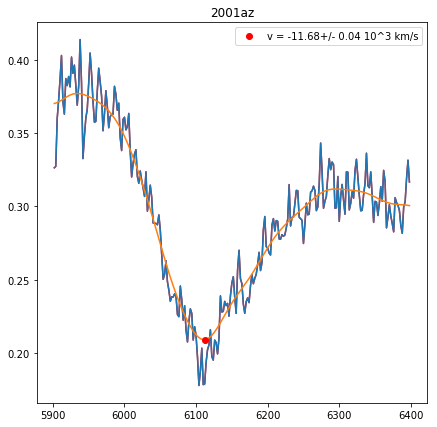

sn2001az-20010430.40-fast.flm 52029.4 54878.39 -2.80966085164
Velocity: (-11.682345555808643, 6112.0, 0.036799031441781094)


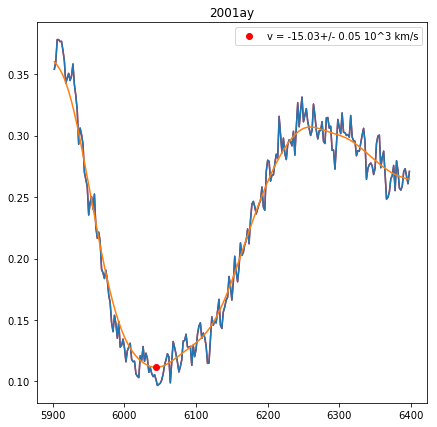

sn2001ay-20010421.48-fast.flm 52020.48 54878.39 -0.322253757357
Velocity: (-15.029733550059401, 6044.0, 0.0546476606862067)


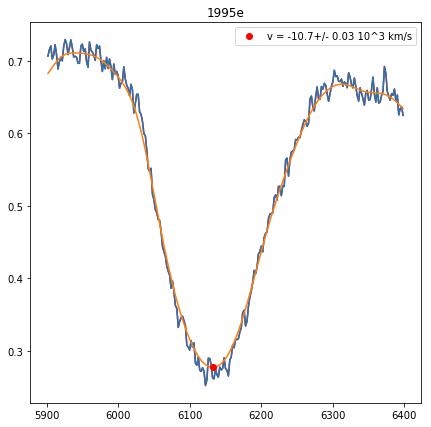

sn1995E-19950226.27-fast.flm 49774.27 54878.39 -0.243185132102
Velocity: (-10.704317028490788, 6132.0, 0.032905874433679955)


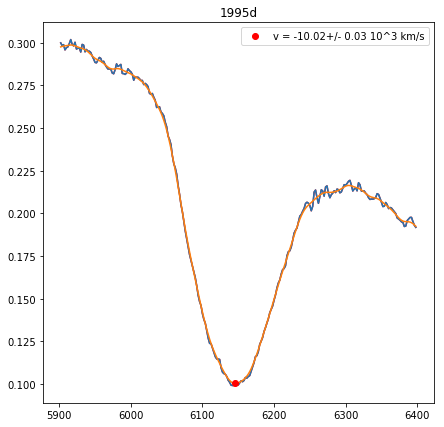

sn1995D-19950224.30-fast.flm 49772.3 54878.39 3.53878205097
Velocity: (-10.021456720684506, 6146.0, 0.030485826831108443)


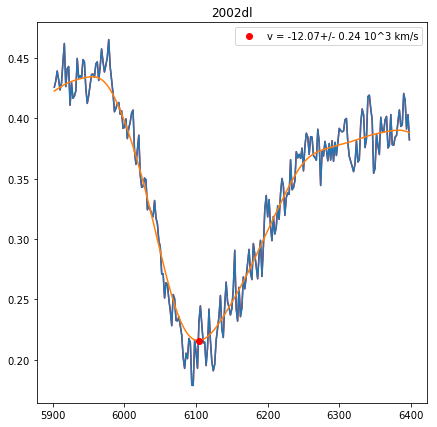

sn2002dl-20020620.41-fast.flm 52445.41 54878.39 -6.48461846532
Velocity: (-12.07438460450608, 6104.0, 0.24463538056679576)


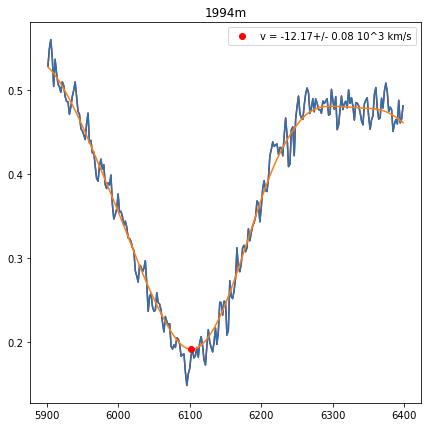

sn1994M-19940504.15-fast.flm 49476.15 54878.39 2.82642689601
Velocity: (-12.172468233516442, 6102.0, 0.08397735893408925)


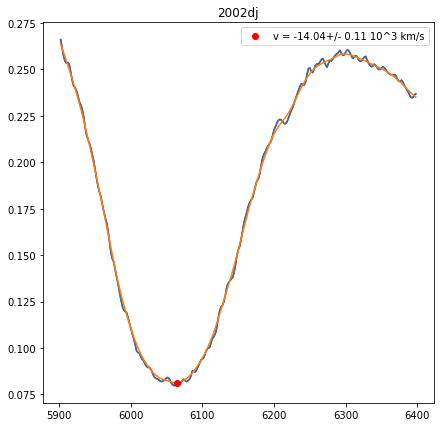

2002dj_20020621_3255_9271_00.dat 52446.0 54878.39 -4.42741330681
Velocity: (-14.041667214102862, 6064.0, 0.10630852250420182)


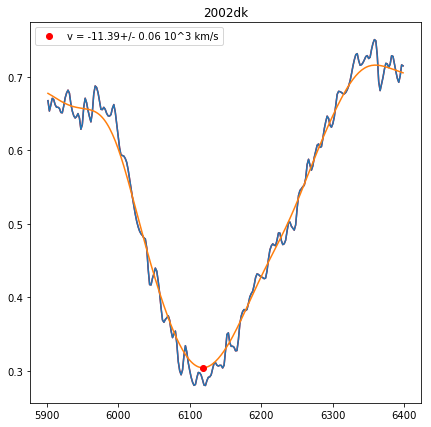

sn2002dk-20020617-ui.flm 52442.345 54878.39 -1.23
Velocity: (-11.388626576876426, 6118.0, 0.0551120067458497)


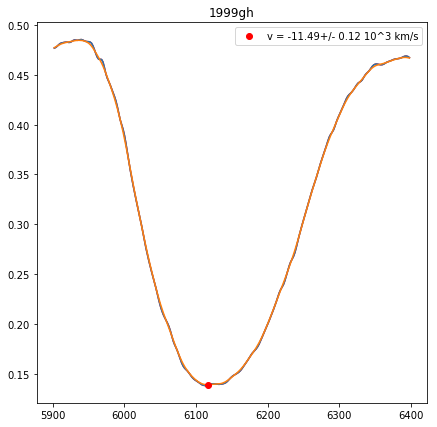

sn1999gh-19991205-uvoir.flm 51517.606 54878.39 1.17894686701
Velocity: (-11.486503345380463, 6116.0, 0.12372183372514098)


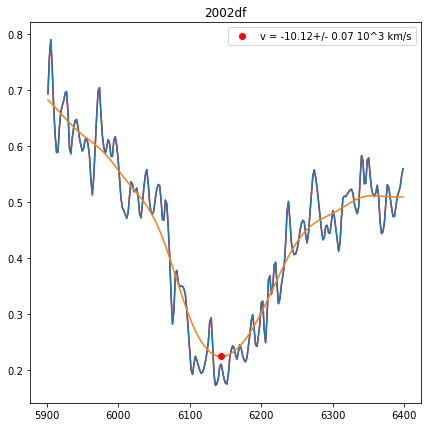

sn2002df-20020608-ui.flm 52433.435 54878.39 6.55
Velocity: (-10.118919436719901, 6144.0, 0.06753235070313068)


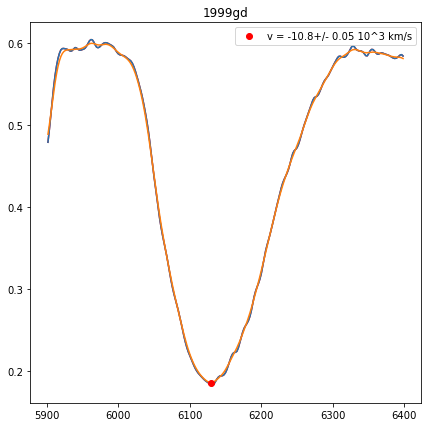

sn1999gd-19991205-uvoir.flm 51517.58 54878.39 -1.35590358063
Velocity: (-10.801986823599174, 6130.0, 0.04763843630643964)


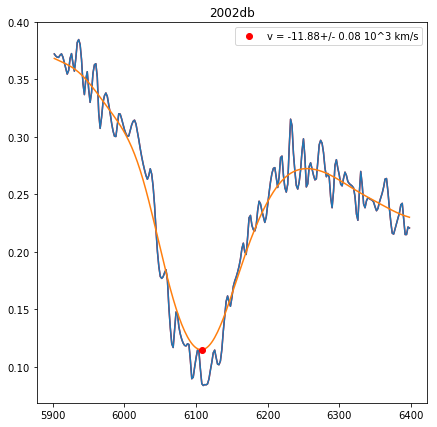

sn2002db-20020608-ui.flm 52433.346 54878.39 9.21
Velocity: (-11.878305981858274, 6108.0, 0.08164835930976862)
sn1981b-19810309.295-iue.flm 44672.0 54878.39 0.959214974485
Velocity: (nan, nan)


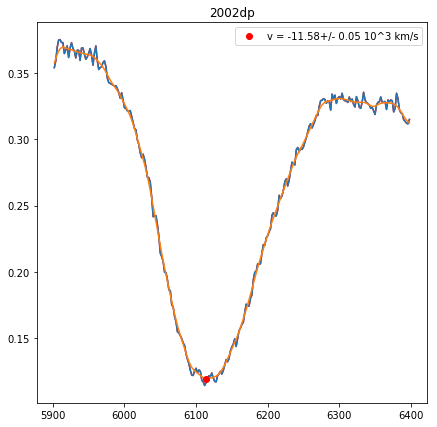

sn2002dp-20020620.47-fast.flm 52445.47 54878.39 -5.01068068747
Velocity: (-11.584409672466169, 6114.0, 0.050821439408695476)


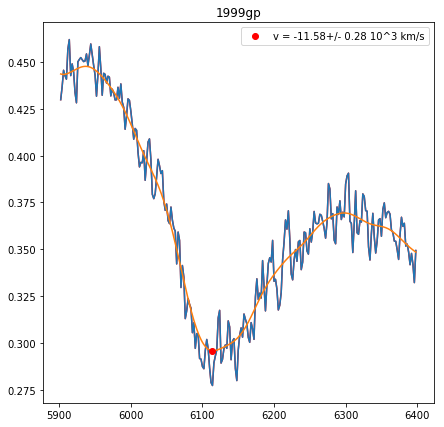

sn1999gp-20000107.13-fast.flm 51550.13 54878.39 0.739229312047
Velocity: (-11.584409672466169, 6114.0, 0.2821844923289513)


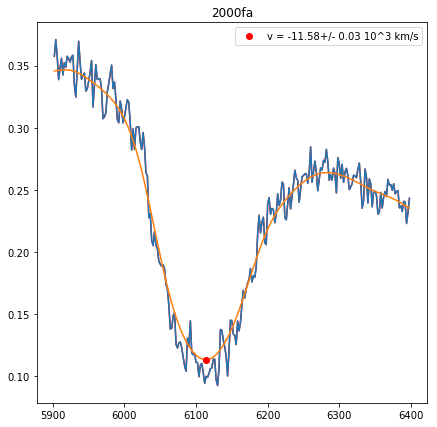

sn2000fa-20001215.36-fast.flm 51893.36 54878.39 1.40021052116
Velocity: (-11.584409672466169, 6114.0, 0.034959551379203826)


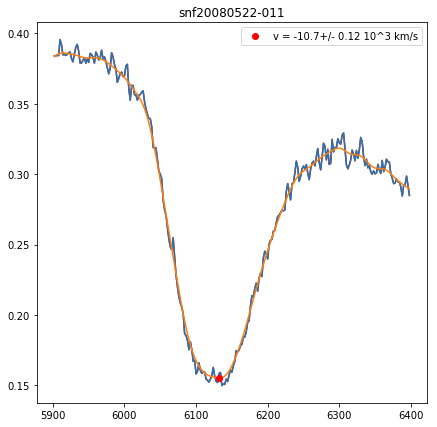

snf20080522-011-20080531.25-fast.flm 54617.25 54878.39 0.529916176898
Velocity: (-10.704317028490788, 6132.0, 0.11921531512047613)


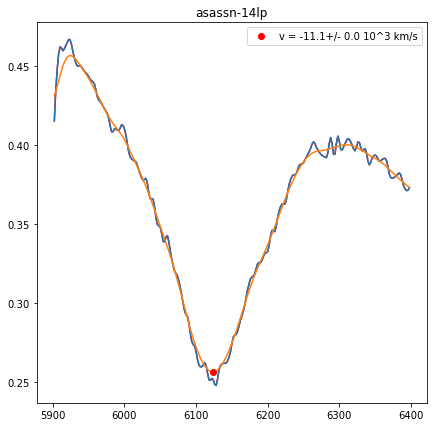

asassn-14lp-visit3-hst.flm None 54878.39 -4.4
Velocity: (-11.095173645785795, 6124.0, 3.552713678800501e-15)


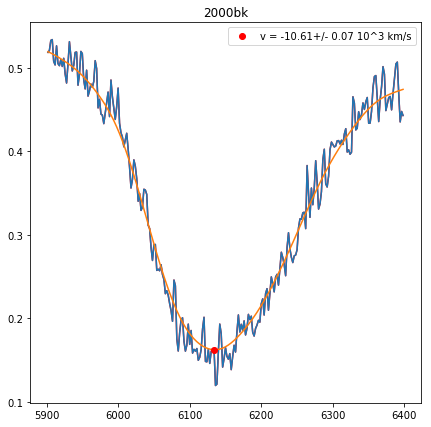

sn2000bk-20000425.20-fast.flm 51659.2 54878.39 13.1962349967
Velocity: (-10.606676809804412, 6134.0, 0.07292928949266622)


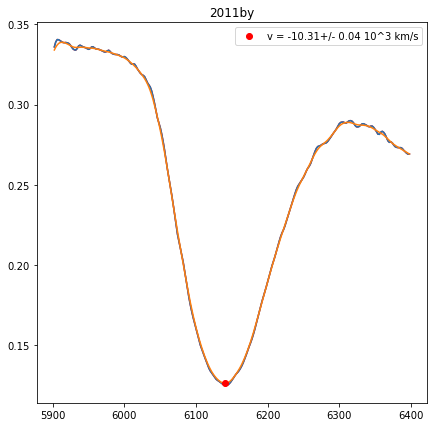

sn2011by-hst+lick.flm None 54878.39 0.1
Velocity: (-10.313933633529203, 6140.0, 0.03746668736331211)


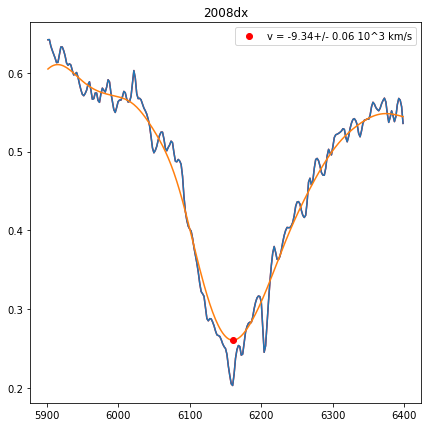

sn2008dx-20080629.219-ui.flm 54646.219 54878.39 2.46
Velocity: (-9.340046364602408, 6160.0, 0.061647572309995444)


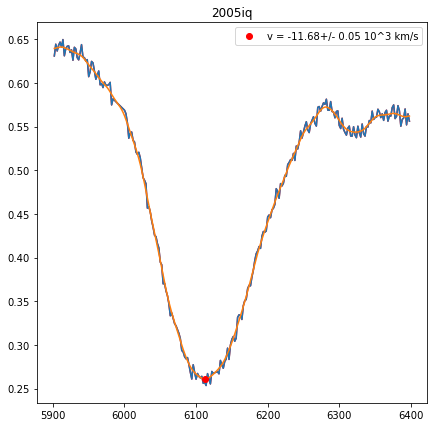

sn2005iq-20051107.215-deimos.flm 53681.215 54878.39 -6.07808379342
Velocity: (-11.682345555808643, 6112.0, 0.04848568107196125)


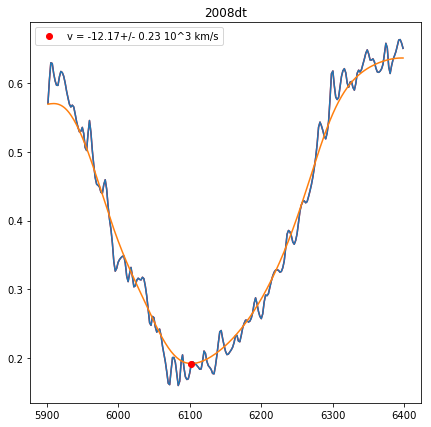

sn2008dt-20080707.395-ui-corrected.flm 54654.395 54878.39 9.27
Velocity: (-12.172468233516442, 6102.0, 0.22796682811649877)


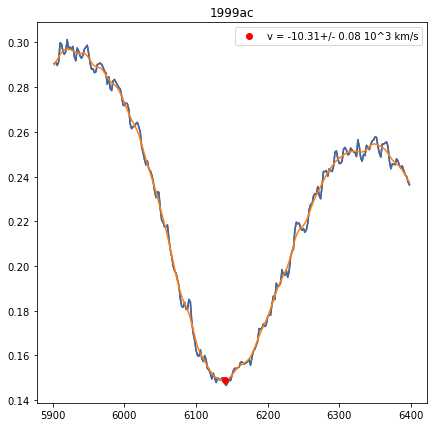

sn1999ac-19990312.53-fast.flm 51249.53 54878.39 -0.32194155523
Velocity: (-10.313933633529203, 6140.0, 0.07887322355329304)


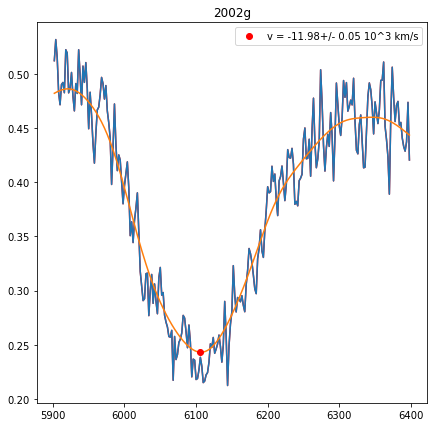

sn2002G-20020122.52-fast.flm 52296.52 54878.39 -2.12723352265
Velocity: (-11.976330519809686, 6106.0, 0.04533568646973079)


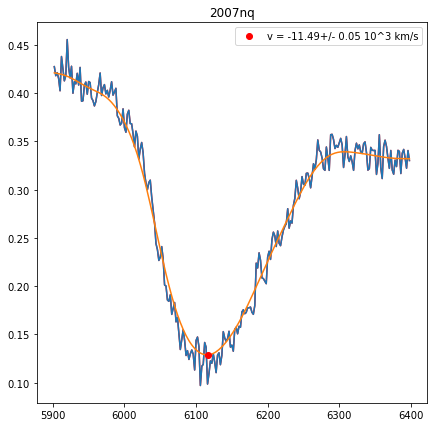

sn2007nq-20071031.24-fast.flm 54404.24 54878.39 7.24954570726
Velocity: (-11.486503345380463, 6116.0, 0.04750805661247344)


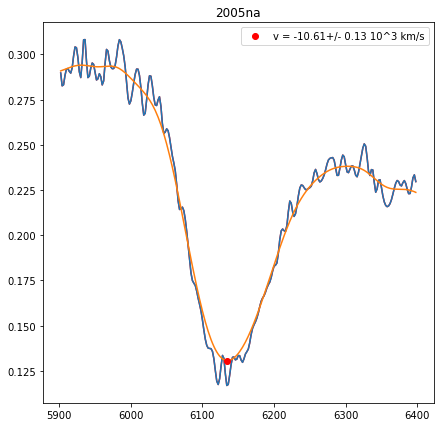

sn2005na-20060105.335-ui.flm 53740.335 54878.39 0.432612766749
Velocity: (-10.606676809804412, 6134.0, 0.13075323883008805)


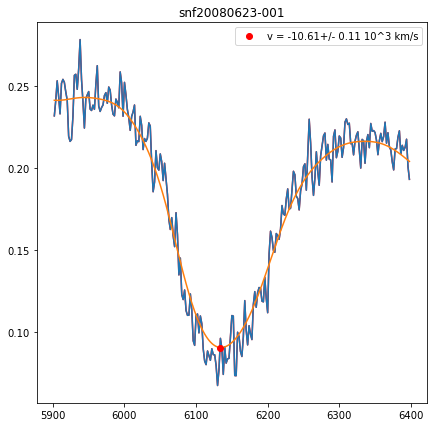

snf20080623-001-20080630.31-fast.flm 54647.31 54878.39 -2.5790987536
Velocity: (-10.606676809804412, 6134.0, 0.11324220807644834)


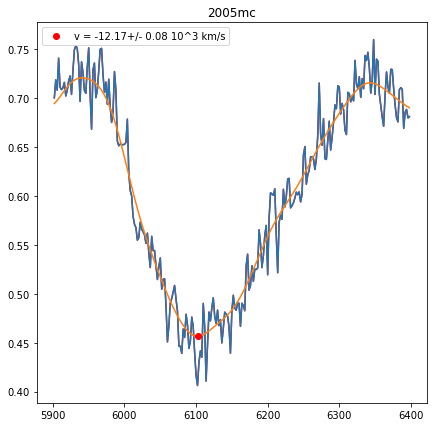

sn2005mc-20051227.37-fast.flm 53731.37 54878.39 -2.17318997562
Velocity: (-12.172468233516442, 6102.0, 0.07978737795581067)


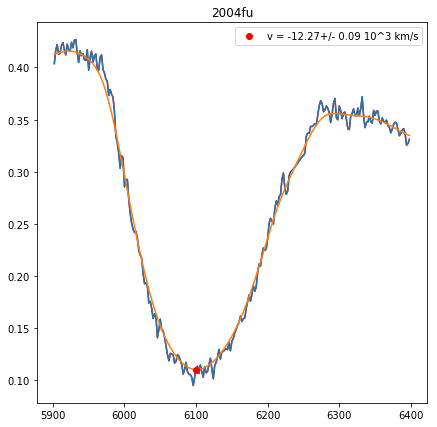

sn2004fu-20041119.07-fast.flm 53328.07 54878.39 2.3998969491
Velocity: (-12.270581404388267, 6100.0, 0.09361725559063314)


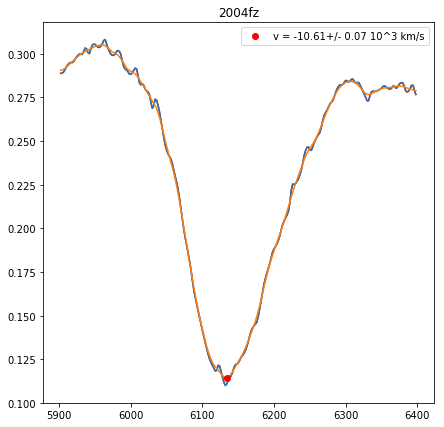

sn2004fz-20041119-ui-corrected.flm 53328.331 54878.39 -4.88444056494
Velocity: (-10.606676809804412, 6134.0, 0.0686110977404747)


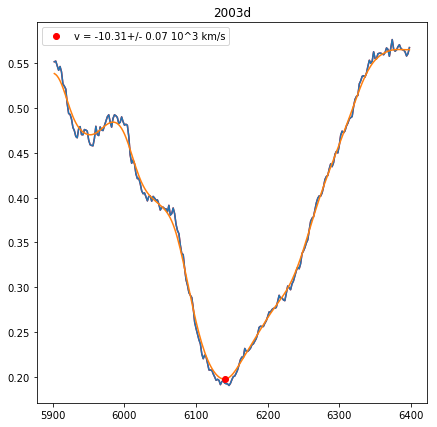

sn2003d-20030107-br.flm 52646.0 54878.39 5.35461482092
Velocity: (-10.313933633529203, 6140.0, 0.07473959979798551)


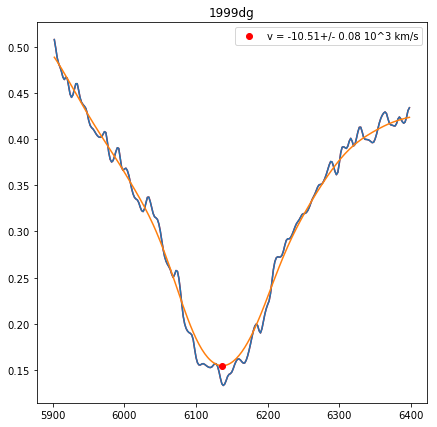

sn1999dg-19990817-ui-corrected.flm 51407.209 54878.39 15.08
Velocity: (-10.50906616967564, 6136.0, 0.076446154530468)


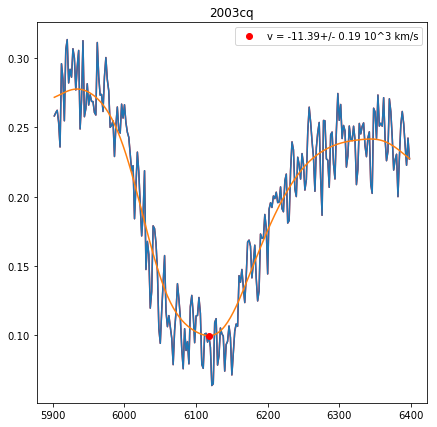

sn2003cq-20030410.22-fast.flm 52739.22 54878.39 0.367759848952
Velocity: (-11.388626576876426, 6118.0, 0.1891386773300386)


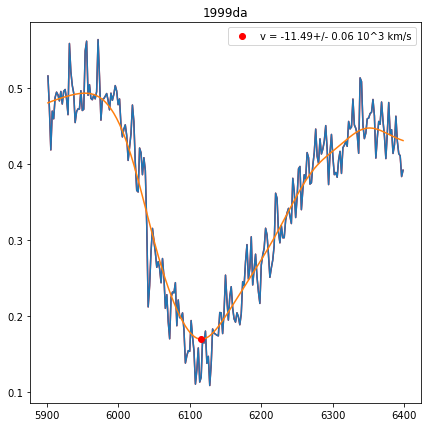

sn1999da-19990709.45-fast.flm 51368.45 54878.39 -2.60690533675
Velocity: (-11.486503345380463, 6116.0, 0.058938223448519164)


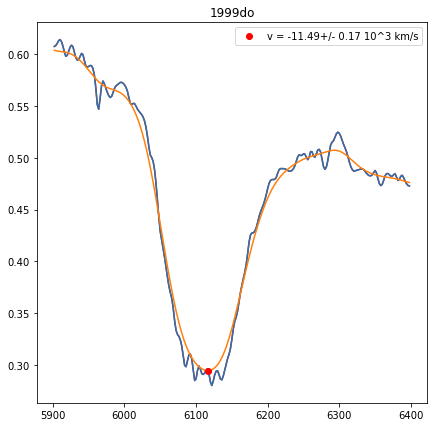

sn1999do-far-19990910-ui.flm 51431.277 54878.39 9.96
Velocity: (-11.486503345380463, 6116.0, 0.16851986558359217)


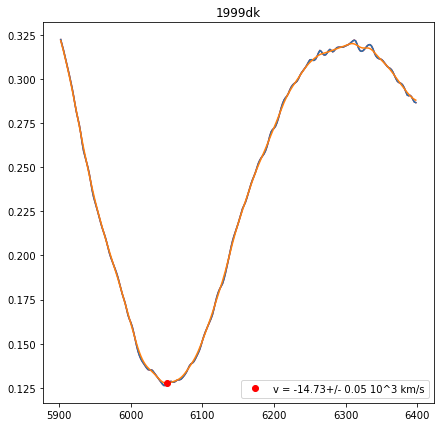

sn1999dk-19990817-ui.flm 51407.376 54878.39 -6.86135414204
Velocity: (-14.733004167237274, 6050.0, 0.05480309483961409)


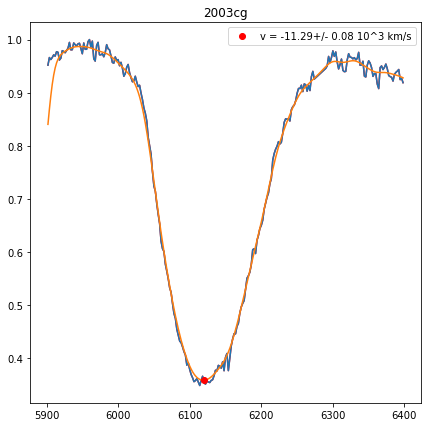

sn2003cg-20030331.21-fast.flm 52729.21 54878.39 -0.0707079760624
Velocity: (-11.290779369257717, 6120.0, 0.08067477605580246)


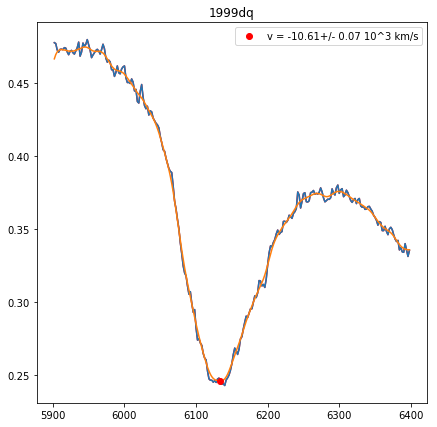

sn1999dq-19990915.45-fast.flm 51436.45 54878.39 1.29445435249
Velocity: (-10.606676809804412, 6134.0, 0.07091289714956622)


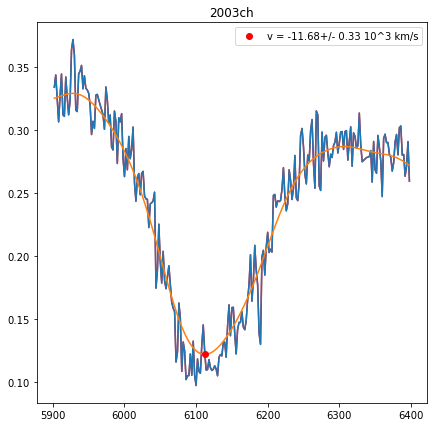

sn2003ch-20030327.13-fast.flm 52725.13 54878.39 0.422896696543
Velocity: (-11.682345555808643, 6112.0, 0.3250224535224114)


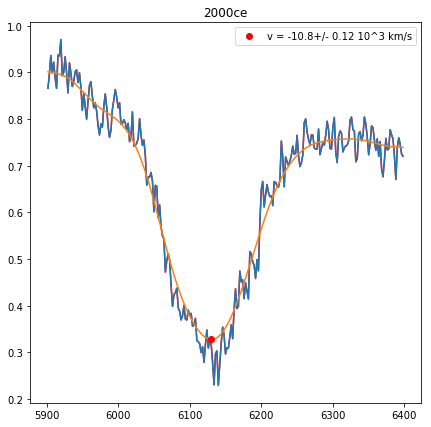

sn2000ce-20000510.15-fast.flm 51674.15 54878.39 6.56594231063
Velocity: (-10.801986823599174, 6130.0, 0.11740779843533636)


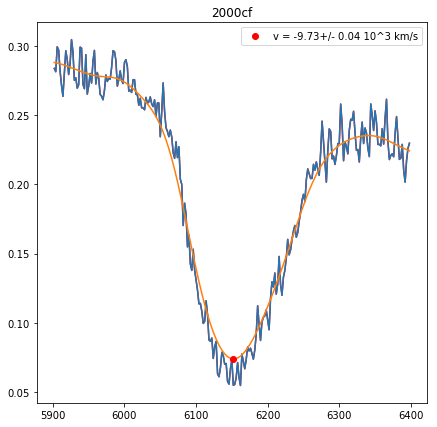

sn2000cf-20000511.34-fast.flm 51675.34 54878.39 3.44163832404
Velocity: (-9.729246126124085, 6152.0, 0.03818827284321671)


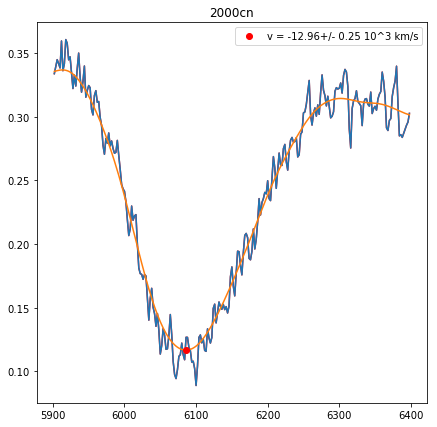

sn2000cn-20000605.37-fast.flm 51700.37 54878.39 -7.21060134265
Velocity: (-12.958200562113579, 6086.0, 0.24795659956251845)


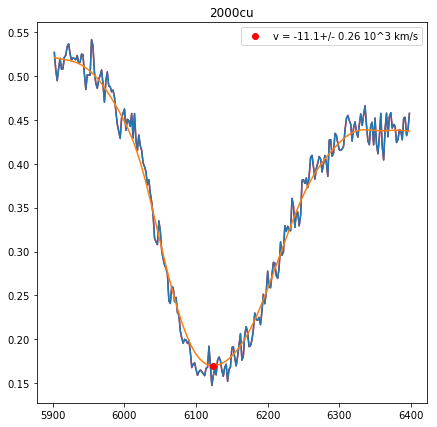

sn2000cu-20000726.26-fast.flm 51751.26 54878.39 7.31140304452
Velocity: (-11.095173645785795, 6124.0, 0.2592983849510951)


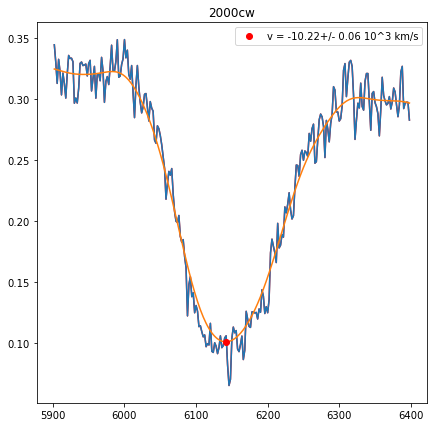

sn2000cw-20000726.46-fast.flm 51751.46 54878.39 3.45597514804
Velocity: (-10.216411741678657, 6142.0, 0.06326828479165553)


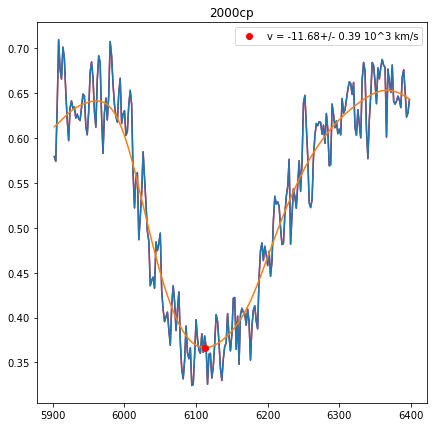

sn2000cp-20000624.34-fast.flm 51719.34 54878.39 -0.541479243945
Velocity: (-11.682345555808643, 6112.0, 0.38650606630289575)


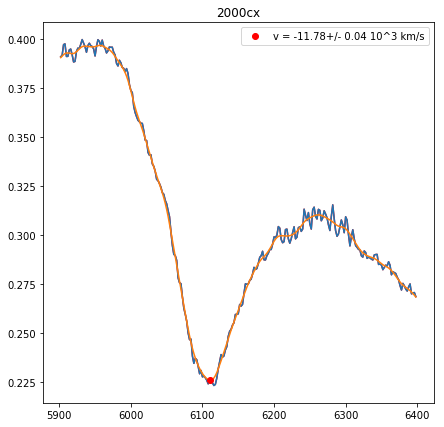

sn2000cx-20000727.43-fast.flm 51752.43 54878.39 -0.461263763512
Velocity: (-11.780310993061766, 6110.0, 0.04183938558184227)


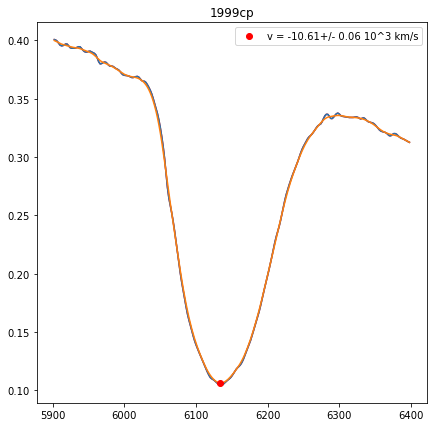

sn1999cp-19990709-ui-corrected.flm 51368.2 54878.39 4.85695605658
Velocity: (-10.606676809804412, 6134.0, 0.06363310022354395)


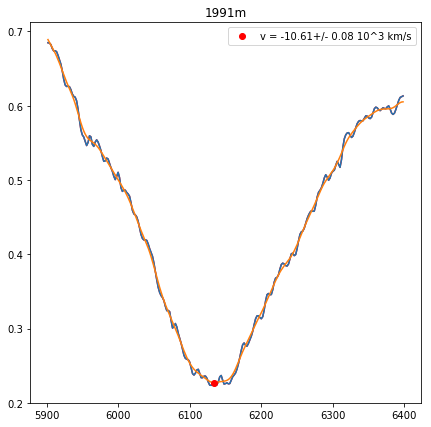

sn1991m-19910407-final.flm 48353.0 54878.39 17.8012082583
Velocity: (-10.606676809804412, 6134.0, 0.07524497190359136)


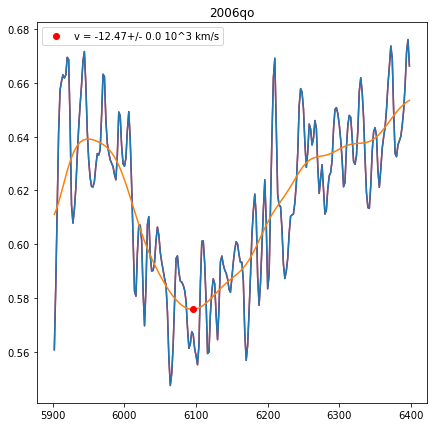

sn2006qo-20061201.436-ui.flm 54070.436 54878.39 -10.9912611419
Velocity: (-12.466896361799964, 6096.0, 3.552713678800501e-15)


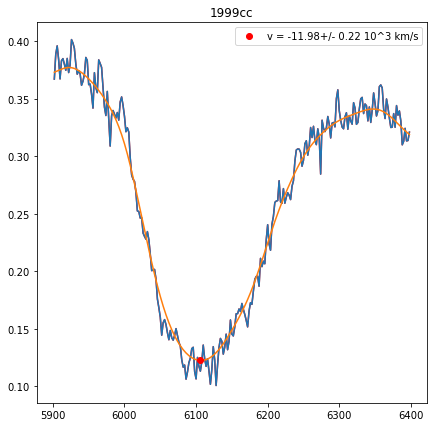

sn1999cc-19990517.40-fast.flm 51315.4 54878.39 -0.116354835702
Velocity: (-11.976330519809686, 6106.0, 0.21533003484498225)


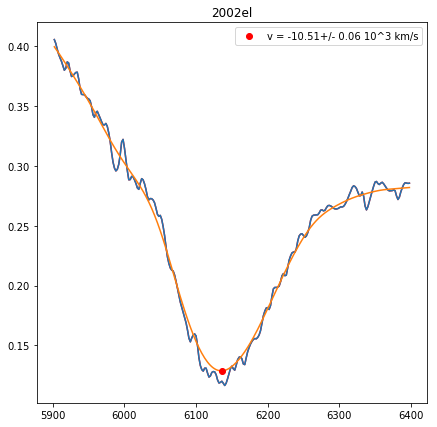

sn2002el-20020903-ui-corrected.flm 52520.263 54878.39 11.82
Velocity: (-10.50906616967564, 6136.0, 0.05753655944694819)
sn1991t-19910427.424-iue.flm 48373.0 54878.39 -0.714860244322
Velocity: (nan, nan)


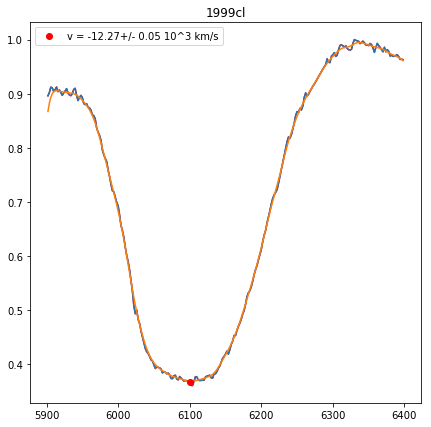

sn1999cl-19990614.18-fast.flm 51343.18 54878.39 0.814800185393
Velocity: (-12.270581404388267, 6100.0, 0.04647706962136018)


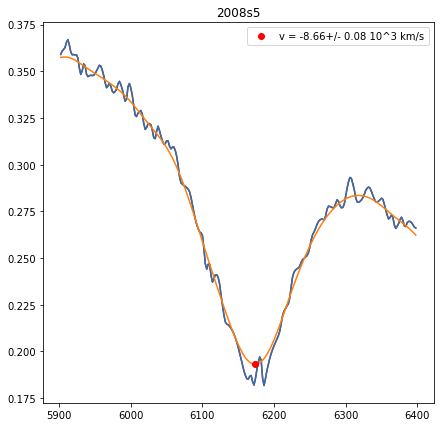

sn2008s5-20080922.302-ui.flm 54731.302 54878.39 1.26
Velocity: (-8.66008662171314, 6174.0, 0.0806246288148693)


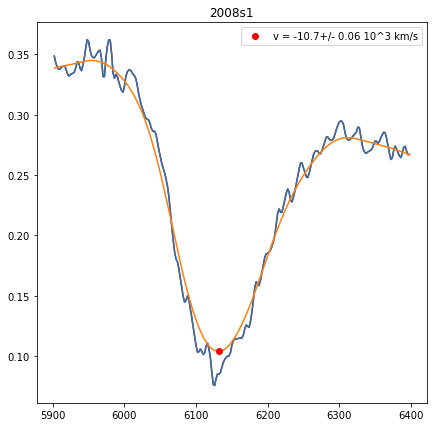

sn2008s1-20080526-ui-corrected.flm 54612.0 54878.39 0.49
Velocity: (-10.704317028490788, 6132.0, 0.058370843373126785)


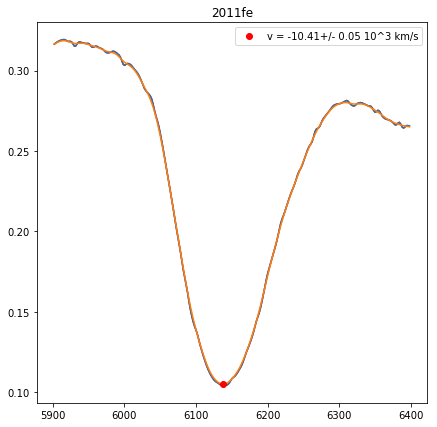

sn2011fe-visit5-hst.flm None 54878.39 0.1
Velocity: (-10.411485110219218, 6138.0, 0.047979065197281213)


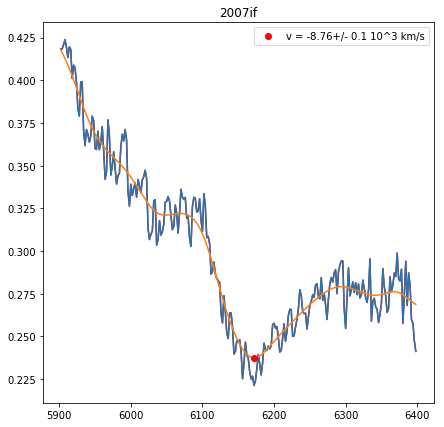

sn2007if-20070911.29-mmt.flm 54354.29 54878.39 10.8443492832
Velocity: (-8.75713489105146, 6172.0, 0.09820241558286012)


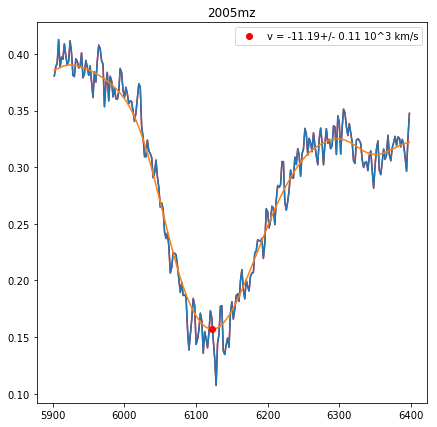

sn2005mz-20060103.13-fast.flm 53738.13 54878.39 -7.63788635352
Velocity: (-11.192961724806997, 6122.0, 0.11490617928959626)


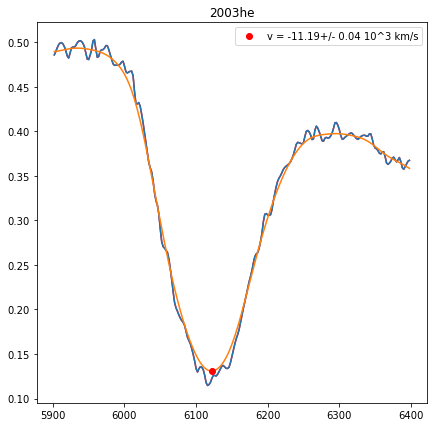

sn2003he-20030828.374-ui-corrected.flm 52879.374 54878.39 2.71
Velocity: (-11.192961724806997, 6122.0, 0.04455919345718655)


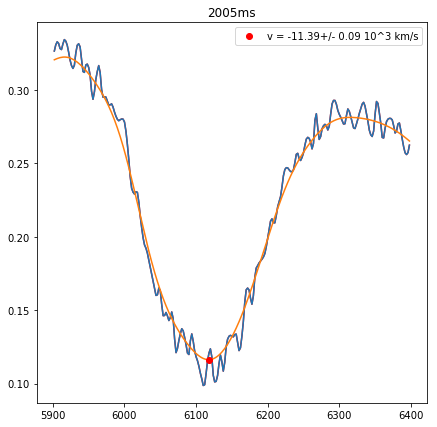

sn2005ms-20060106.400-ui.flm 53741.4 54878.39 -1.93815084608
Velocity: (-11.388626576876426, 6118.0, 0.08563347944160848)


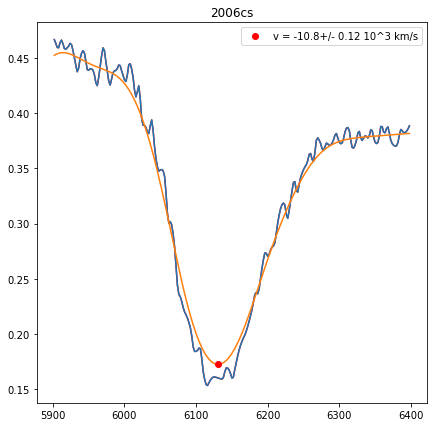

sn2006cs-20060605.335-ui.flm 53891.335 54878.39 1.81209679625
Velocity: (-10.801986823599174, 6130.0, 0.1176085595160835)


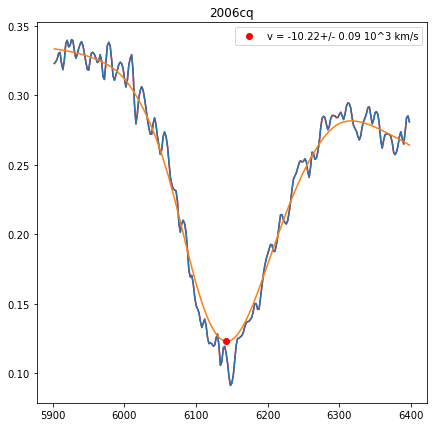

sn2006cq-20060605.307-ui.flm 53891.307 54878.39 1.45945435485
Velocity: (-10.216411741678657, 6142.0, 0.08588262745986883)


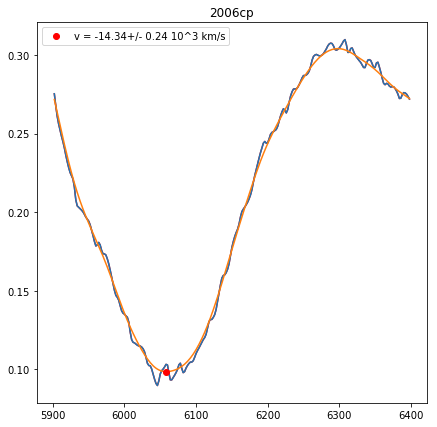

sn2006cp-20060605.281-ui.flm 53891.281 54878.39 -5.07488586886
Velocity: (-14.337777591065105, 6058.0, 0.2417193879152104)


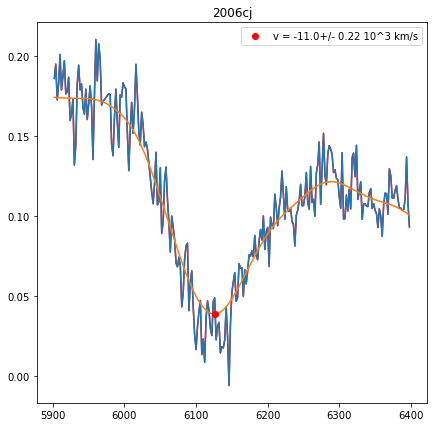

sn2006cj-20060523.33-fast.flm 53878.33 54878.39 -1.0557208925
Velocity: (-10.997415134434632, 6126.0, 0.21681511274492857)


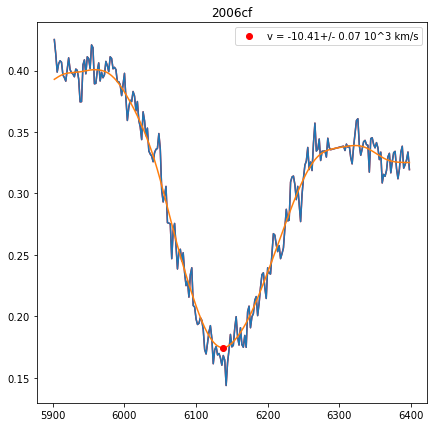

sn2006cf-20060519.25-fast.flm 53874.25 54878.39 1.62353871914
Velocity: (-10.411485110219218, 6138.0, 0.06823396164646468)


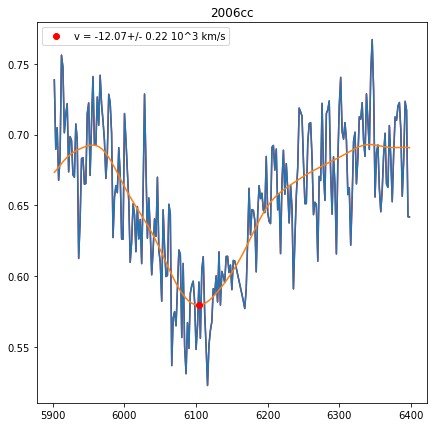

sn2006cc-20060508.34-fast.flm 53863.34 54878.39 -9.48060538736
Velocity: (-12.07438460450608, 6104.0, 0.2240285523333813)


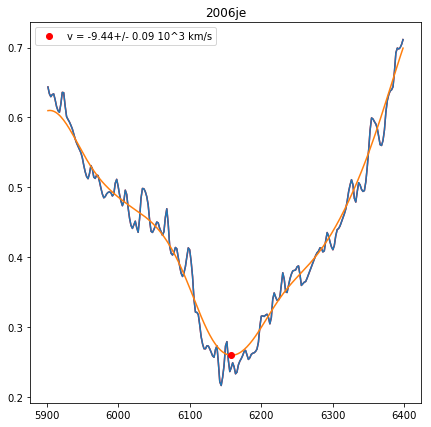

sn2006je-20061024.247-ui-corrected.flm 54032.247 54878.39 17.5222255192
Velocity: (-9.437301903025991, 6158.0, 0.08954021290589478)


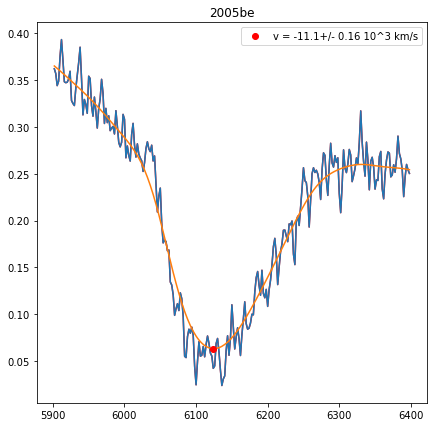

sn2005be-20050407.39-fast.flm 53467.39 54878.39 10.2685990338
Velocity: (-11.095173645785795, 6124.0, 0.15964822124751768)


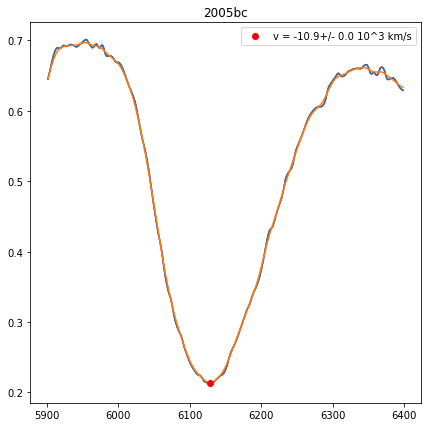

sn2005bc-20050411.474-ui-corrected.flm 53471.466 54878.39 1.94216574201
Velocity: (-10.899686192972935, 6128.0, 1.7763568394002505e-15)


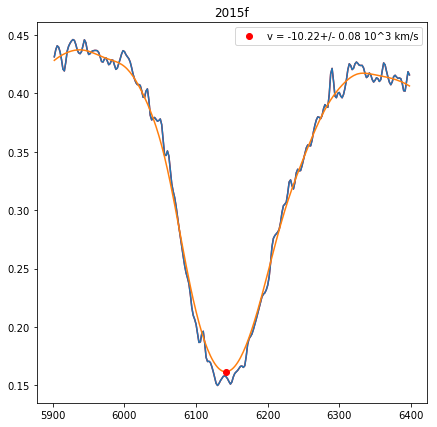

sn2015f-visit4-hst.flm None 54878.39 -2.3
Velocity: (-10.216411741678657, 6142.0, 0.07983820490887347)


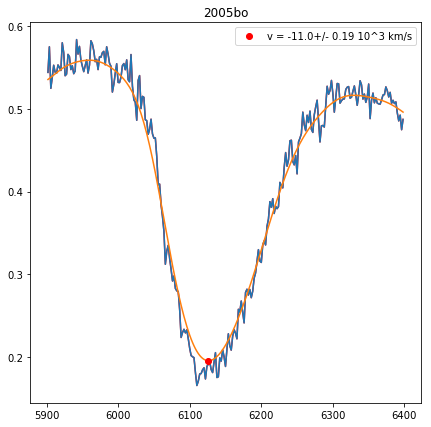

sn2005bo-20050418.21-fast.flm 53478.21 54878.39 0.461585803673
Velocity: (-10.997415134434632, 6126.0, 0.1854224069603087)


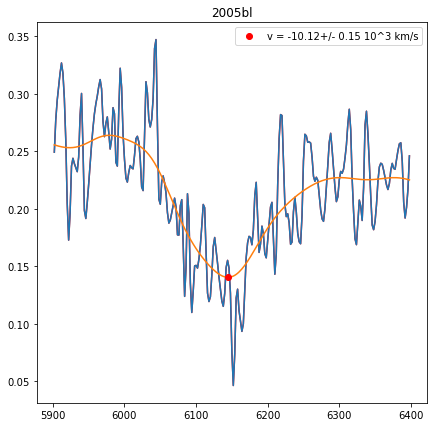

sn2005bl-20050417.214-ui.flm 53477.206 54878.39 -5.45182899439
Velocity: (-10.118919436719901, 6144.0, 0.1477653663392314)


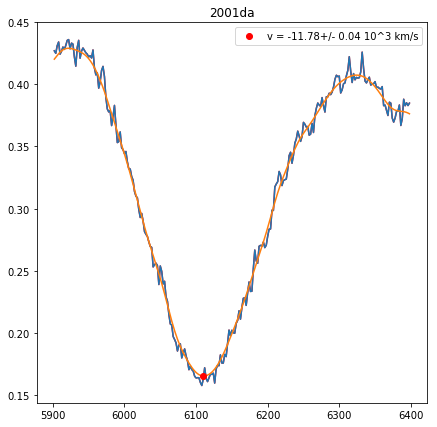

sn2001da-20010714.46-fast.flm 52104.46 54878.39 0.252655587176
Velocity: (-11.780310993061766, 6110.0, 0.04132316271802115)


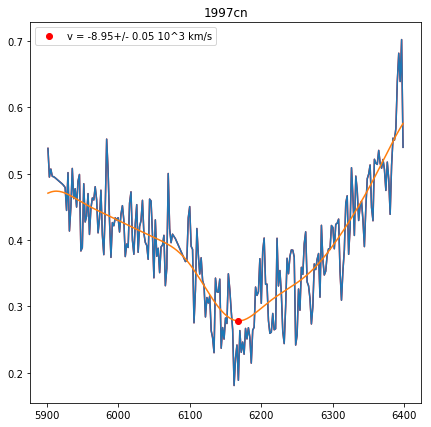

sn1997cn-19970529.27-fast.flm 50597.27 54878.39 10.9634469762
Velocity: (-8.95132027359566, 6168.0, 0.04855374900095554)


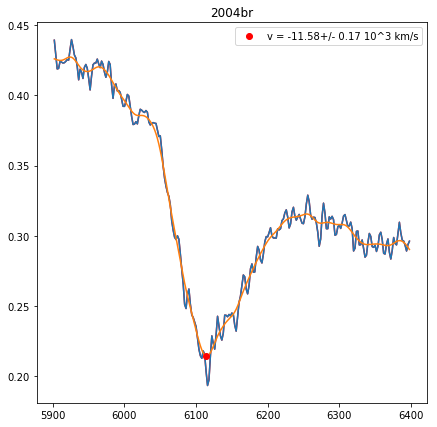

sn2004br-20040527.285-lowopt.flm 53152.285 54878.39 3.5
Velocity: (-11.584409672466169, 6114.0, 0.1710701519959137)


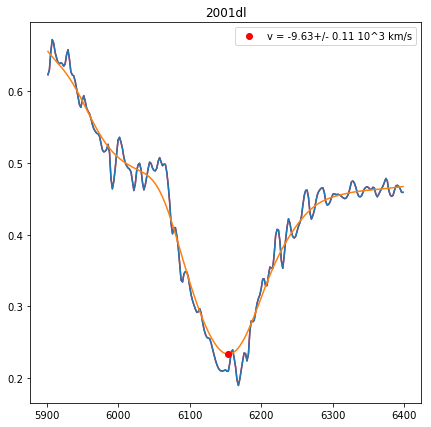

sn2001dl-20010823-ui-corrected.flm 52144.427 54878.39 13.84
Velocity: (-9.631901785684354, 6154.0, 0.10900338921331879)


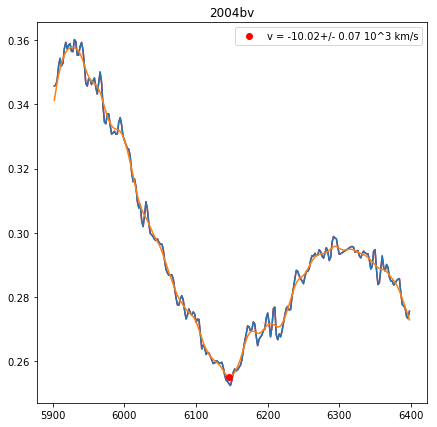

sn2004bv-20040527.467-hiopt.flm 53152.467 54878.39 -7.06
Velocity: (-10.021456720684506, 6146.0, 0.06867779363990492)


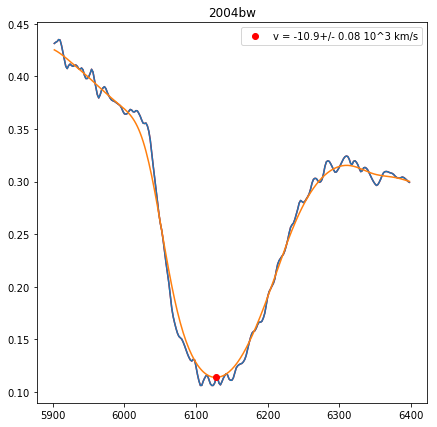

sn2004bw-20040613.333-ui-corrected.flm 53169.333 54878.39 6.59
Velocity: (-10.899686192972935, 6128.0, 0.08322460156028243)


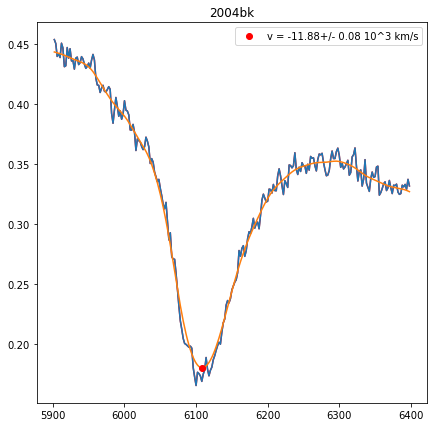

sn2004bk-20040424.32-fast.flm 53119.32 54878.39 6.3726390936
Velocity: (-11.878305981858274, 6108.0, 0.07771696073770229)


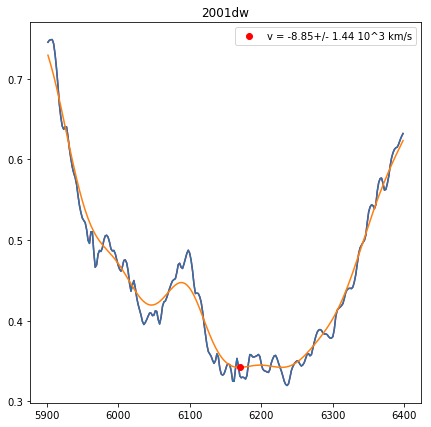

sn2001dw-20010912-ui.flm 52164.446 54878.39 11.06
Velocity: (-8.85421277559375, 6170.0, 1.438428613391971)


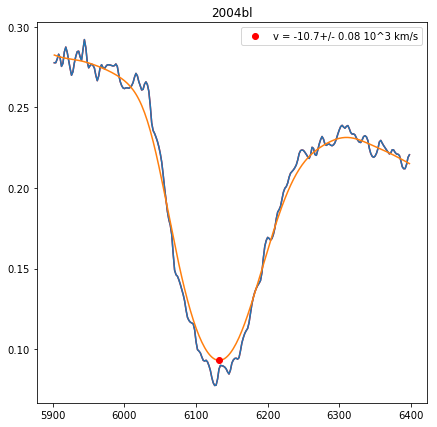

sn2004bl-20040512.189-ui.flm 53137.189 54878.39 4.61
Velocity: (-10.704317028490788, 6132.0, 0.08345992676200147)


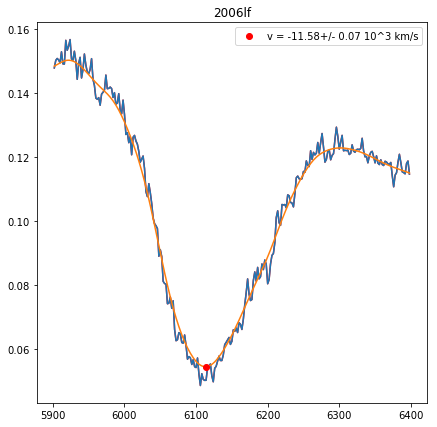

sn2006lf-20061101.40-fast.flm 54040.4 54878.39 -4.36633813854
Velocity: (-11.584409672466169, 6114.0, 0.07309419317473935)


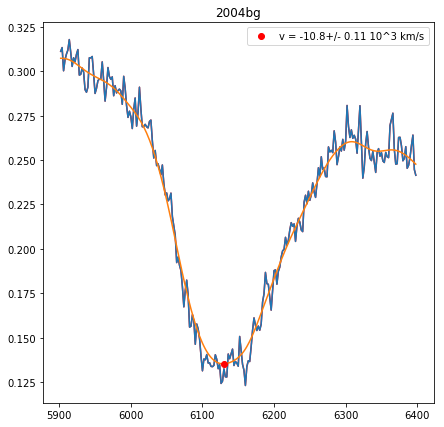

sn2004bg-20040411.39-fast.flm 53106.39 54878.39 -1.51219106103
Velocity: (-10.801986823599174, 6130.0, 0.10911838194847188)


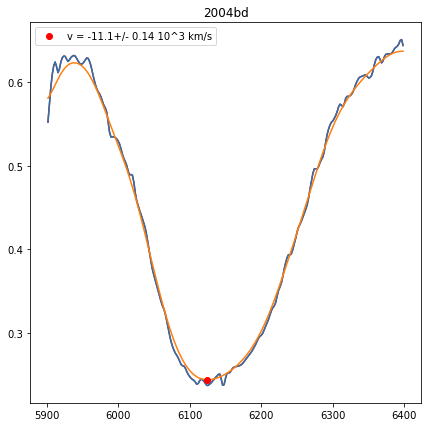

sn2004bd-20040410.156-ui-corrected.flm 53105.156 54878.39 11.0572258019
Velocity: (-11.095173645785795, 6124.0, 0.13701778641048565)


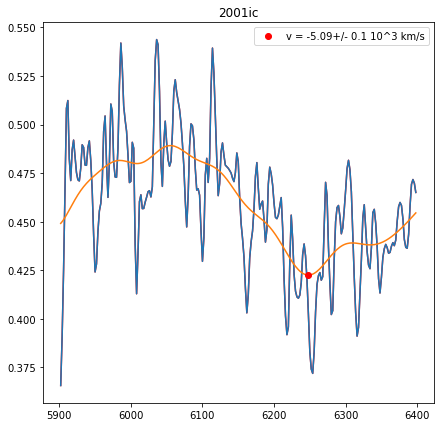

sn2001ic-20011211-ui.flm 52254.298 54878.39 11.8067067151
Velocity: (-5.090134250451365, 6248.0, 0.09966053331913692)


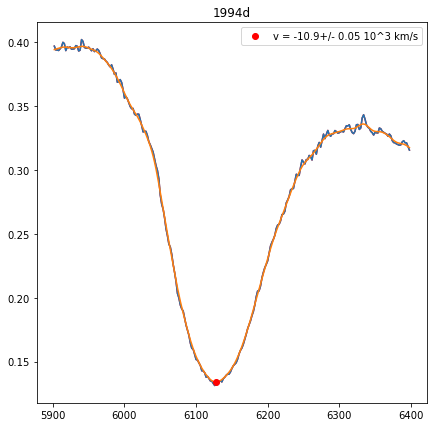

sn1994D-19940321.35-fast.flm 49432.35 54878.39 -0.235515309497
Velocity: (-10.899686192972935, 6128.0, 0.04884968468688023)


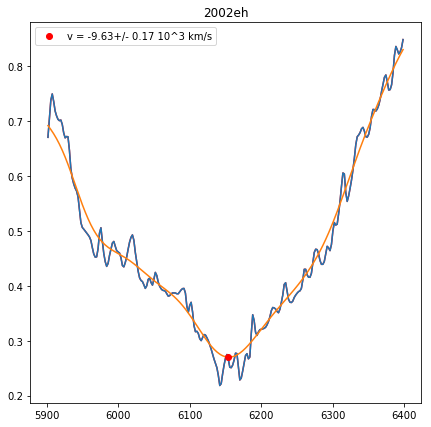

sn2002eh-20020809-ui.flm 52495.405 54878.39 6.88
Velocity: (-9.631901785684354, 6154.0, 0.17234059176910038)


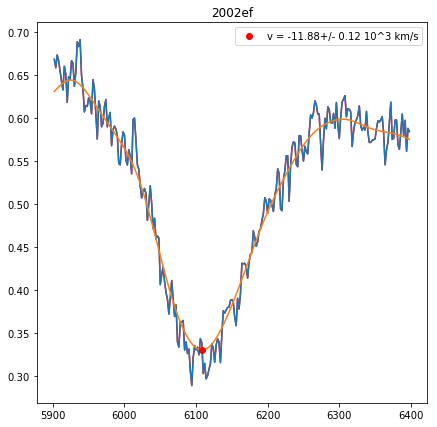

sn2002ef-20020801.44-fast.flm 52487.44 54878.39 -2.8906899276
Velocity: (-11.878305981858274, 6108.0, 0.12382956421210008)
sn1986g-19860506.685-iue.flm 46556.0 54878.39 10.5237940758
Velocity: (nan, nan)


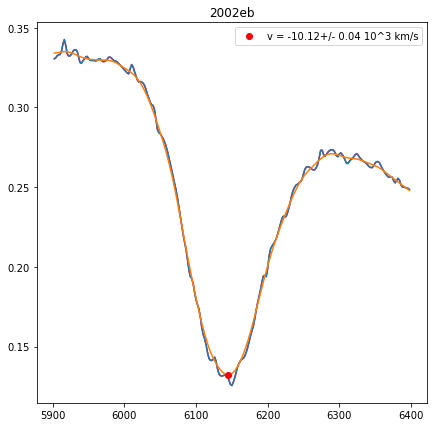

sn2002eb-20020809-ui-corrected.flm 52495.325 54878.39 1.68
Velocity: (-10.118919436719901, 6144.0, 0.03573042189345461)


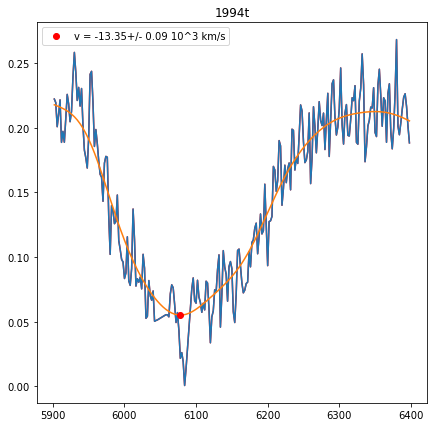

sn1994T-19940611.21-fast.flm 49514.21 54878.39 -0.178803389723
Velocity: (-13.351775323989612, 6078.0, 0.08961926321729116)


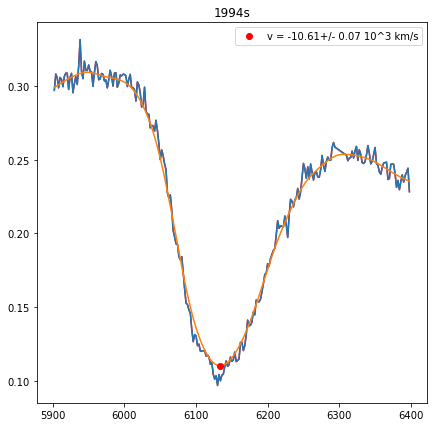

sn1994S-19940616.24-fast.flm 49519.24 54878.39 0.902305706293
Velocity: (-10.606676809804412, 6134.0, 0.06996334223196275)


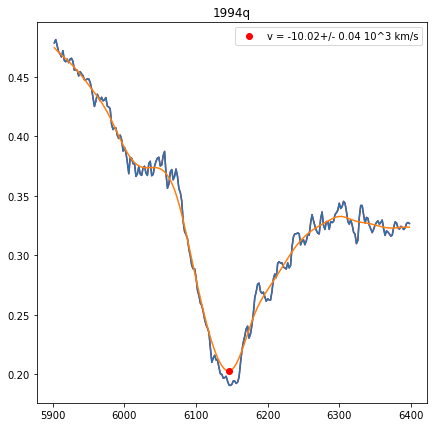

sn1994q-19940603-uoh.flm 49506.461 54878.39 9.95955569542
Velocity: (-10.021456720684506, 6146.0, 0.038223103146220794)


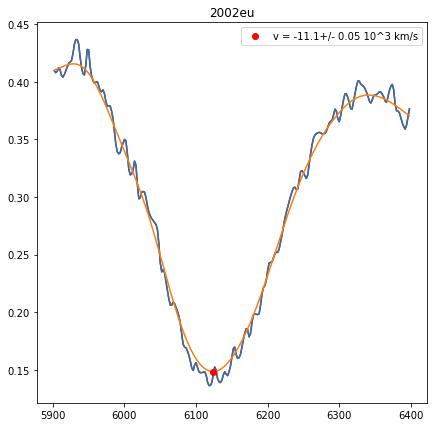

sn2002eu-20020903-ui.flm 52520.442 54878.39 4.4206679478
Velocity: (-11.095173645785795, 6124.0, 0.05059208162537772)


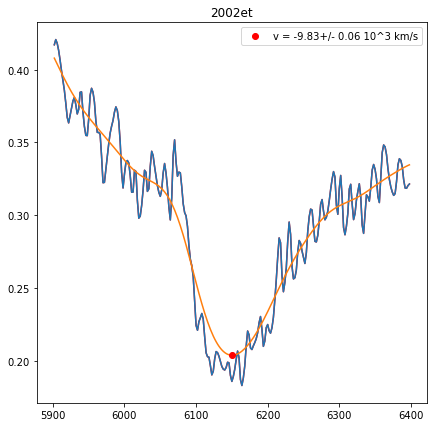

sn2002et-20020903-ui.flm 52520.242 54878.39 11.92
Velocity: (-9.826620063406793, 6150.0, 0.06259835471463021)


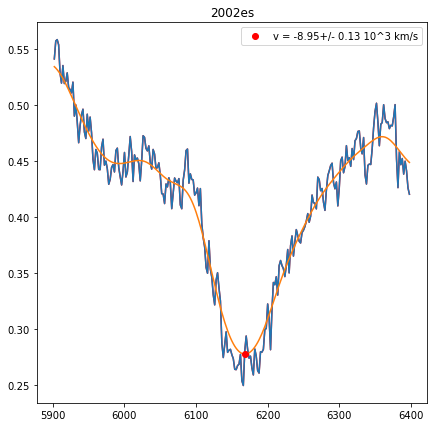

sn2002es-20020903.45-fast.flm 52520.45 54878.39 8.6802213082
Velocity: (-8.95132027359566, 6168.0, 0.13214535557080648)


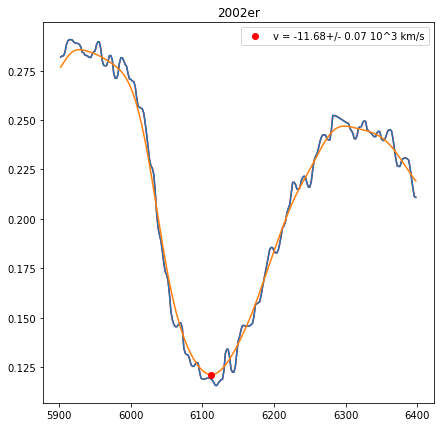

2002er_20020908_3737_9384_00.dat 52525.0 54878.39 -0.0347026331401
Velocity: (-11.682345555808643, 6112.0, 0.06509715750592934)
sn1989b-19890201.480-iue.flm 47558.0 54878.39 -6.49624660199
Velocity: (nan, nan)


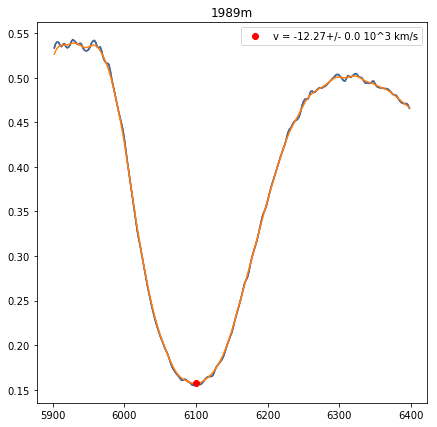

sn1989m-19890709-oi1i2.flm 47716.0 54878.39 2.49
Velocity: (-12.270581404388267, 6100.0, 0.0)


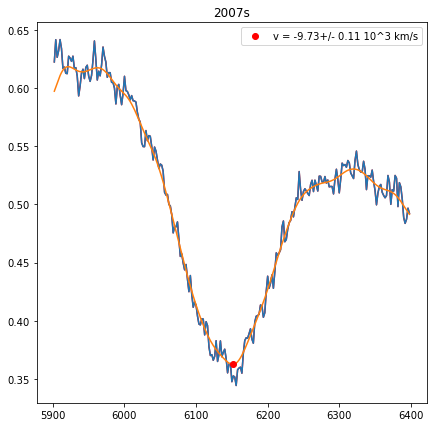

sn2007S-20070212.33-fast.flm 54143.33 54878.39 -0.533583193606
Velocity: (-9.729246126124085, 6152.0, 0.11214247599287466)


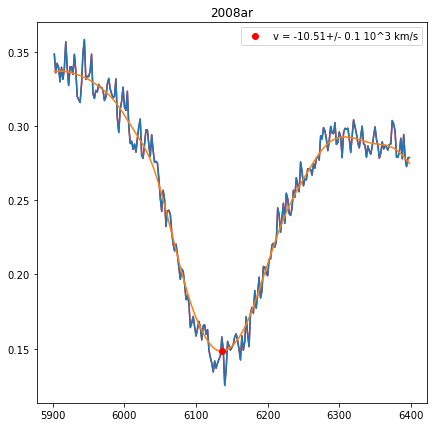

sn2008ar-20080308.43-fast.flm 54533.43 54878.39 -0.652927894345
Velocity: (-10.50906616967564, 6136.0, 0.10173010873908048)


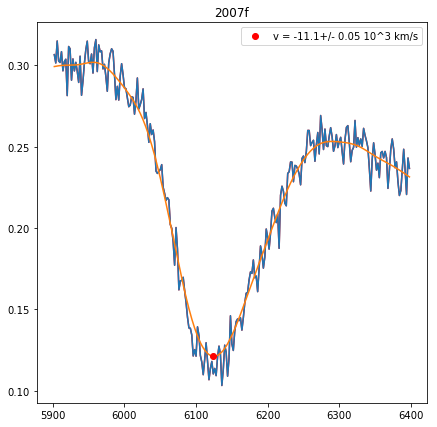

sn2007F-20070122.49-fast.flm 54122.49 54878.39 -0.796216457552
Velocity: (-11.095173645785795, 6124.0, 0.05428653046031408)


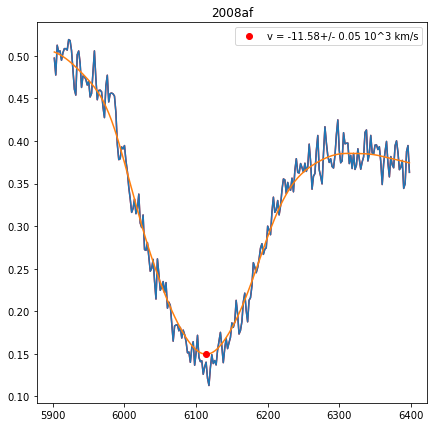

sn2008af-20080211.48-fast.flm 54507.48 54878.39 7.56647028032
Velocity: (-11.584409672466169, 6114.0, 0.0463790859055883)


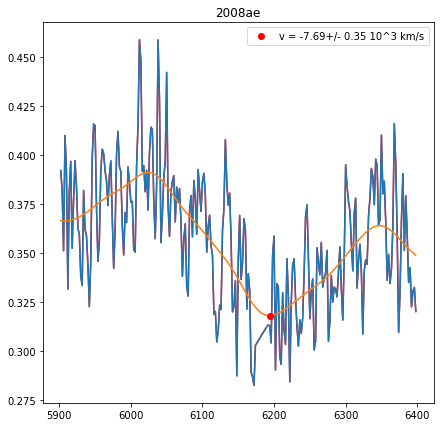

sn2008ae-20080211.32-fast.flm 54507.32 54878.39 -0.0776697520993
Velocity: (-7.691233133814922, 6194.0, 0.3487613884494579)


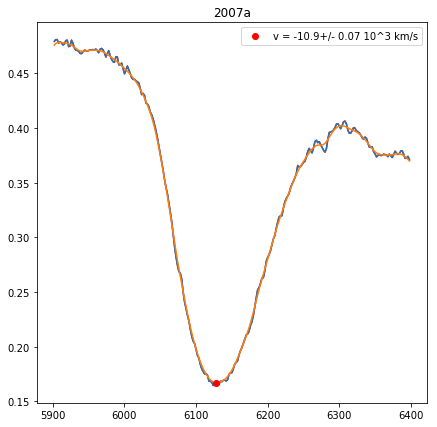

sn2007a-20070113.208-br.flm 54113.208 54878.39 0.47684593452
Velocity: (-10.899686192972935, 6128.0, 0.06548835327284111)


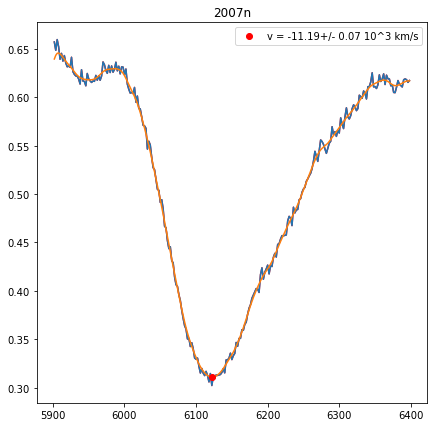

sn2007n-20070122.583-deimos.flm 54122.583 54878.39 0.903365635541
Velocity: (-11.192961724806997, 6122.0, 0.07111928557117364)


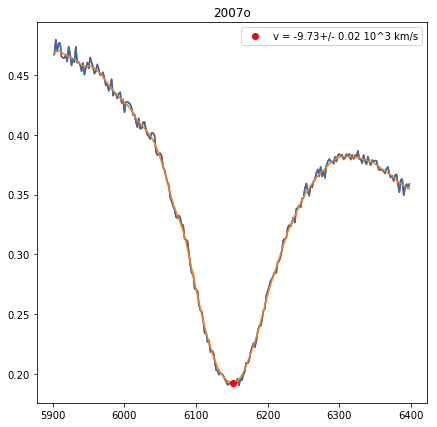

sn2007o-20070122.663-deimos.flm 54122.663 54878.39 0.0212311766291
Velocity: (-9.729246126124085, 6152.0, 0.019081316847072382)


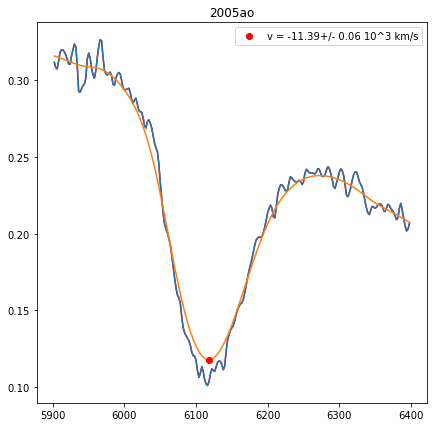

sn2005ao-20050313.539-ui.flm 53442.539 54878.39 0.52
Velocity: (-11.388626576876426, 6118.0, 0.0632438655851372)


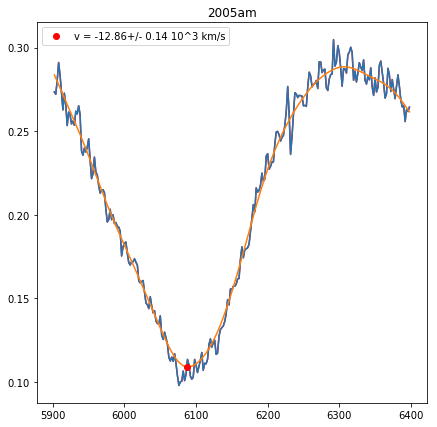

sn2005am-20050303.30-fast.flm 53432.3 54878.39 -1.60928823225
Velocity: (-12.859880668678267, 6088.0, 0.14171680165581538)


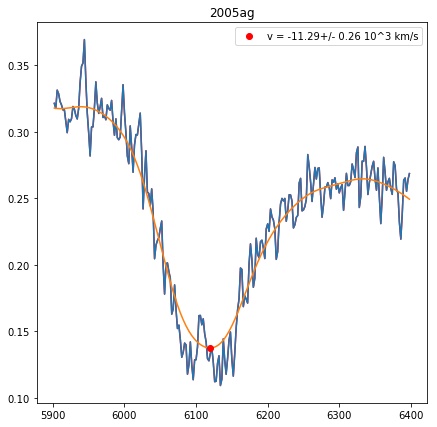

sn2005ag-20050212.596-br.flm 53413.596 54878.39 -0.670578373849
Velocity: (-11.290779369257717, 6120.0, 0.25703945643085835)


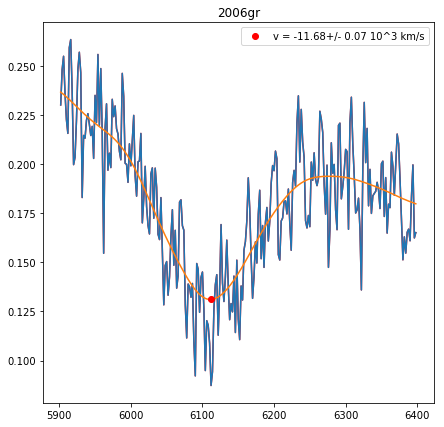

sn2006gr-20061003.26-fast.flm 54011.26 54878.39 -0.616665232935
Velocity: (-11.682345555808643, 6112.0, 0.0691186765726836)


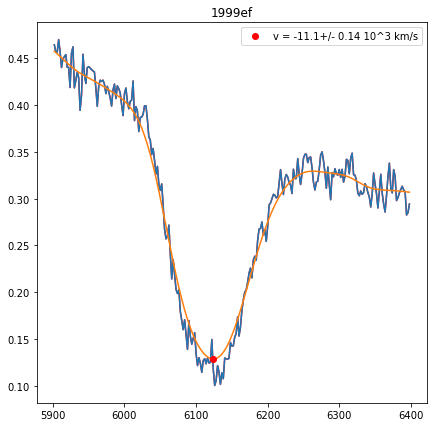

sn1999ef-19991013.29-fast.flm 51464.29 54878.39 7.84208434499
Velocity: (-11.095173645785795, 6124.0, 0.1370752761363024)


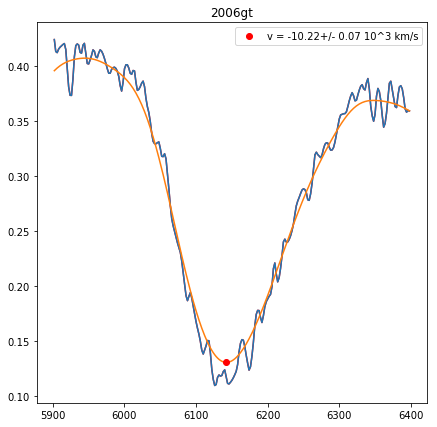

sn2006gt-20060925.348-ui.flm 54003.348 54878.39 2.74509916527
Velocity: (-10.216411741678657, 6142.0, 0.06667855329026526)


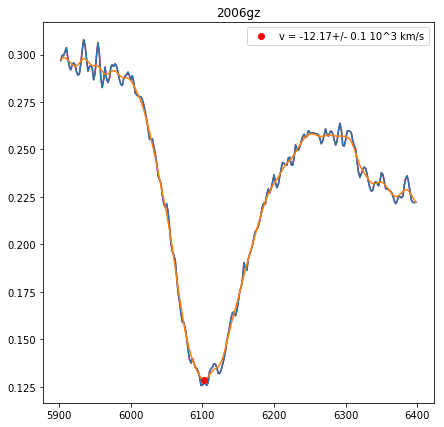

2006gz_20061010_3755_7204_00.dat 54018.0 54878.39 -1.66075632797
Velocity: (-12.172468233516442, 6102.0, 0.09505989261352366)


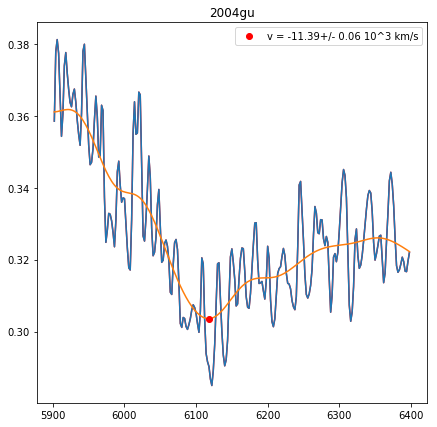

sn2004gu-20041217.539-ui.flm 53356.539 54878.39 -5.38217866844
Velocity: (-11.388626576876426, 6118.0, 0.058704186001644135)


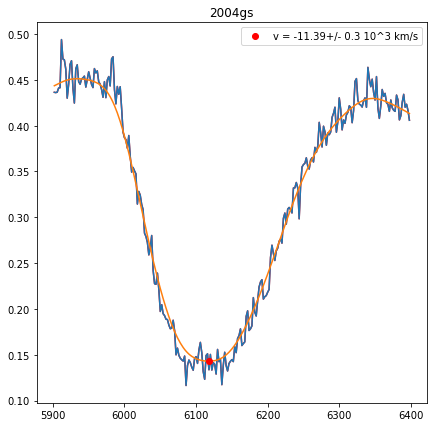

sn2004gs-20041216.49-fast.flm 53355.49 54878.39 0.484706912913
Velocity: (-11.388626576876426, 6118.0, 0.3022473133632265)


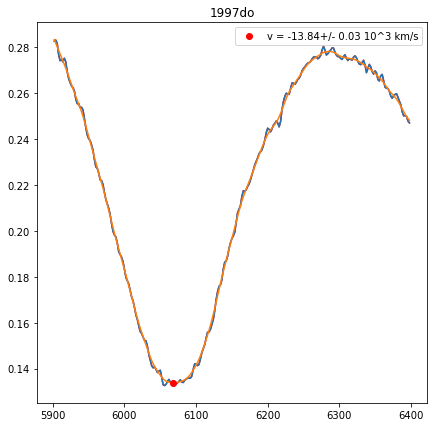

sn1997do-19971108-uoi.flm 50760.48 54878.39 -5.80525086128
Velocity: (-13.84440774713146, 6068.0, 0.028213368964215724)


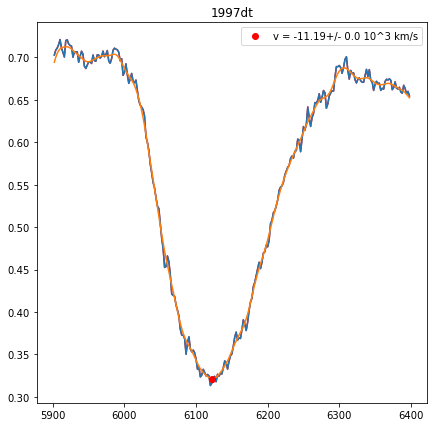

sn1997dt-19971204.11-fast.flm 50786.11 54878.39 0.32263892832
Velocity: (-11.192961724806997, 6122.0, 3.552713678800501e-15)


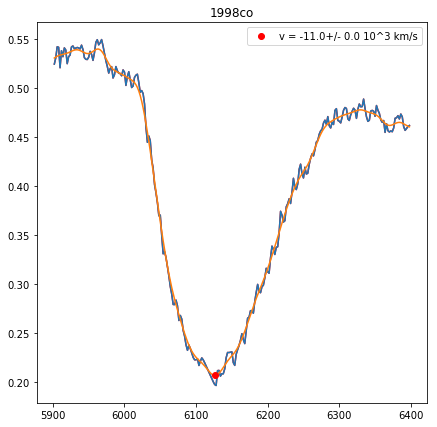

sn1998co-19980623.45-fast.flm 50987.45 54878.39 3.59601285567
Velocity: (-10.997415134434632, 6126.0, 3.552713678800501e-15)


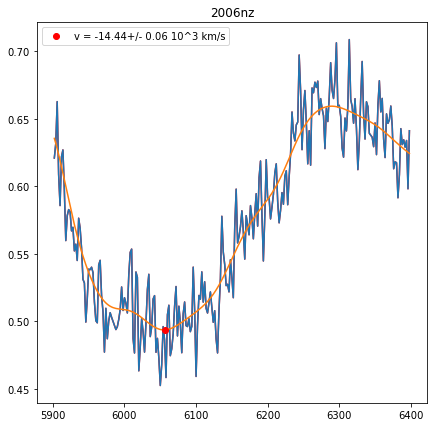

sn2006nz-20061117.18-fast.flm 54056.18 54878.39 -1.44395897548
Velocity: (-14.436540018845095, 6056.0, 0.05653973006429373)


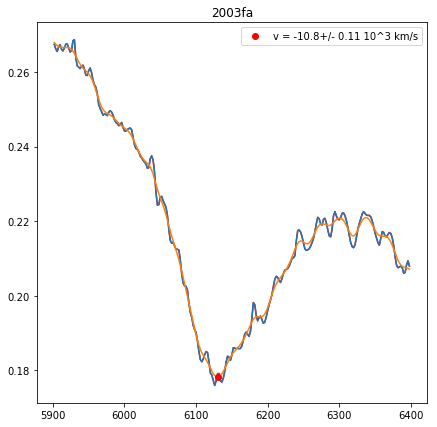

sn2003fa-20030610.34-mmt.flm 52800.34 54878.39 -5.3460824231
Velocity: (-10.801986823599174, 6130.0, 0.11055379987885913)


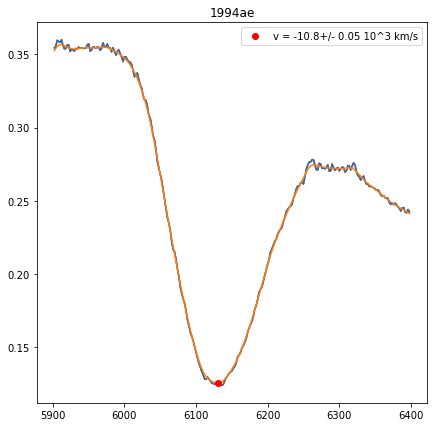

sn1994ae-19941129.51-fast.flm 49685.51 54878.39 0.838423286265
Velocity: (-10.801986823599174, 6130.0, 0.04592557980687091)


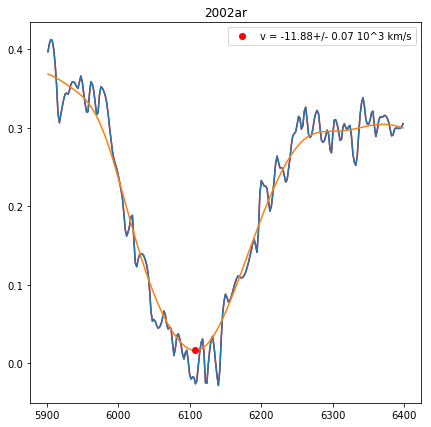

sn2002ar-20020211-ui.flm 52316.42 54878.39 4.15787297081
Velocity: (-11.878305981858274, 6108.0, 0.07209402374843614)
sn1990n-19900709.730-iue.flm 48081.0 54878.39 -0.634844702238
Velocity: (nan, nan)


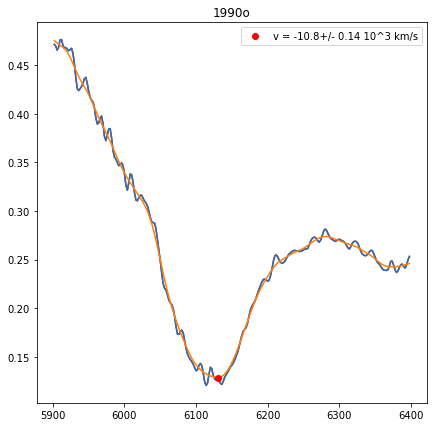

sn1990o-19900717-opt2.flm 48089.0 54878.39 12.5753882934
Velocity: (-10.801986823599174, 6130.0, 0.144526659131339)


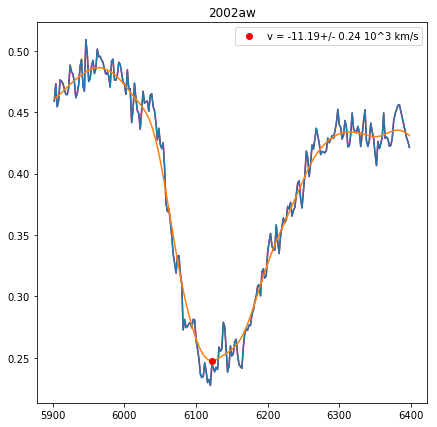

sn2002aw-20020218.52-fast.flm 52323.52 54878.39 -0.857578607316
Velocity: (-11.192961724806997, 6122.0, 0.24133675591951964)


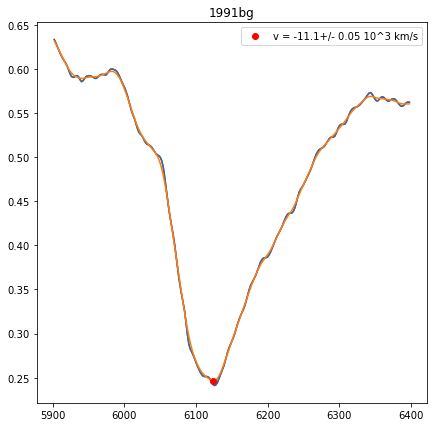

sn1991bg-19911213-noz.flm 48603.0 54878.39 0.681687715271
Velocity: (-11.095173645785795, 6124.0, 0.045615806772956576)


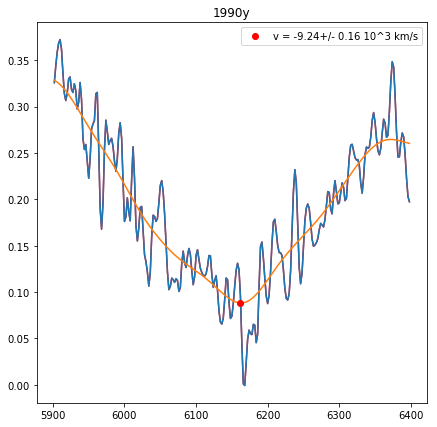

sn1990y-19900830-opt2.flm 48133.51 54878.39 18.9579936749
Velocity: (-9.242820430611571, 6162.0, 0.1620129248479531)


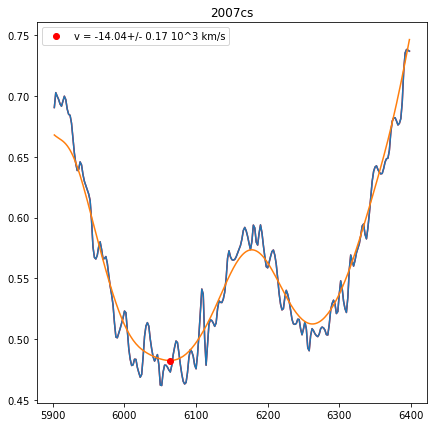

sn2007cs-20070707.463-ui.flm 54288.463 54878.39 12.15
Velocity: (-14.041667214102862, 6064.0, 0.17462742319279123)


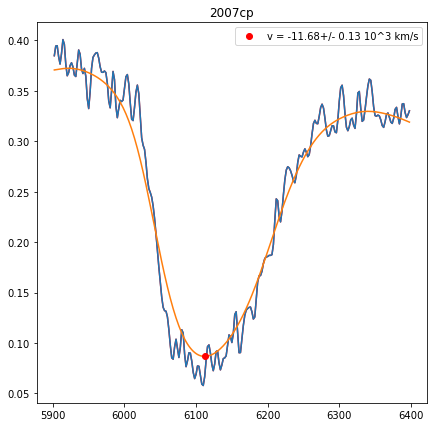

sn2007cp-20070623.217-ui.flm 54274.217 54878.39 4.30930112532
Velocity: (-11.682345555808643, 6112.0, 0.13103158036255805)


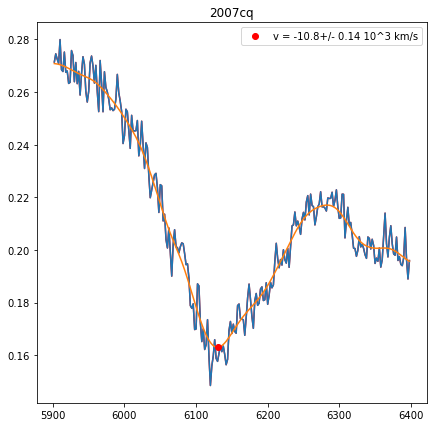

sn2007cq-20070625.45-fast.flm 54276.45 54878.39 -4.05671409082
Velocity: (-10.801986823599174, 6130.0, 0.1358259775351648)


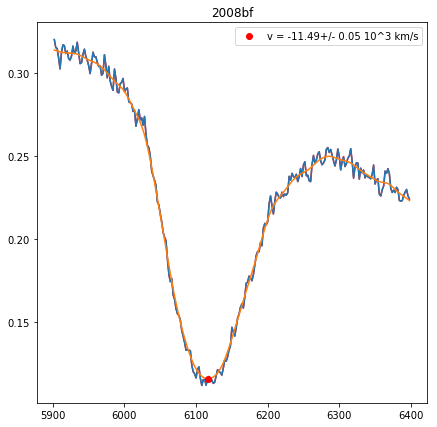

sn2008bf-20080330.31-fast.flm 54555.31 54878.39 0.68807339449
Velocity: (-11.486503345380463, 6116.0, 0.048899217871793015)


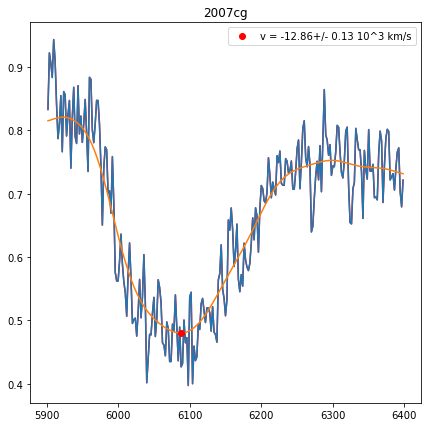

sn2007cg-20070514.24-fast.flm 54234.24 54878.39 10.3610544369
Velocity: (-12.859880668678267, 6088.0, 0.13212211573293106)


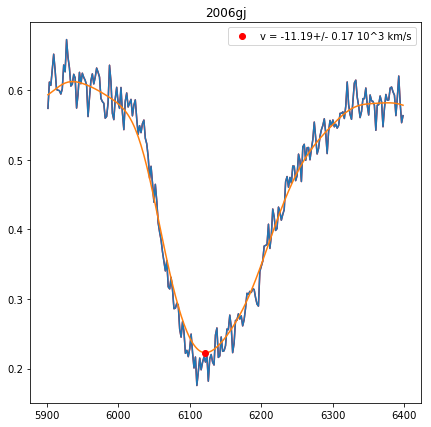

sn2006gj-20060920.43-fast.flm 53998.43 54878.39 -0.307305408088
Velocity: (-11.192961724806997, 6122.0, 0.16970063785984232)


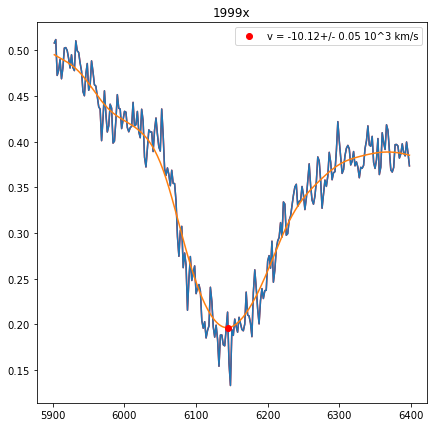

sn1999X-19990206.28-fast.flm 51215.28 54878.39 10.2334147181
Velocity: (-10.118919436719901, 6144.0, 0.047761280199352454)


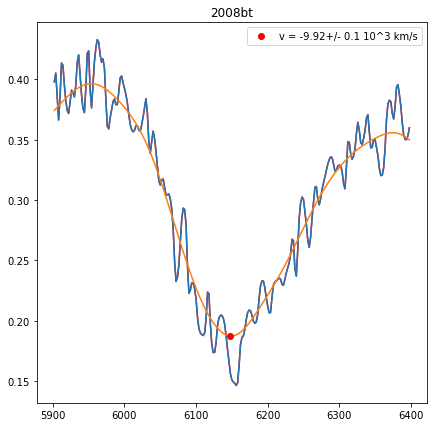

sn2008bt-20080416-ui.flm 54572.0 54878.39 -1.08
Velocity: (-9.92402359558339, 6148.0, 0.10236438589338132)


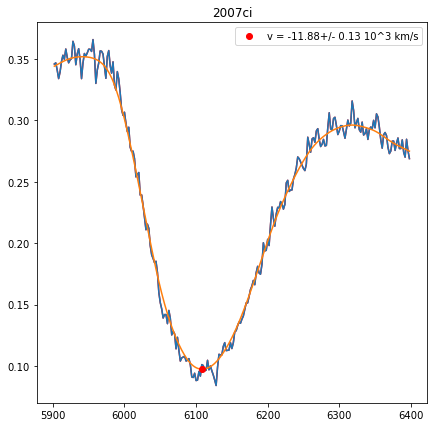

sn2007ci-20070525.19-fast.flm 54245.19 54878.39 -0.976303522353
Velocity: (-11.878305981858274, 6108.0, 0.1322405473721344)


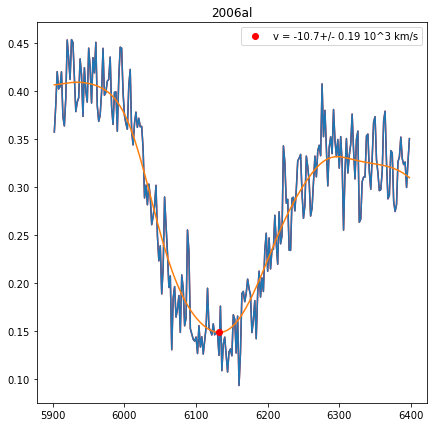

sn2006al-20060224.34-fast.flm 53790.34 54878.39 5.57850407688
Velocity: (-10.704317028490788, 6132.0, 0.19365738563661813)


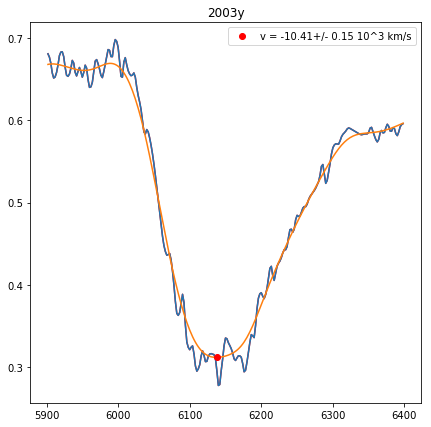

sn2003Y-20030204-ui.flm 52674.233 54878.39 -2.4259003955
Velocity: (-10.411485110219218, 6138.0, 0.14929733754840868)


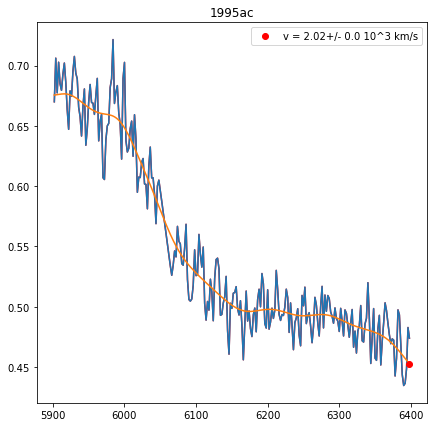

sn1995ac-19950927.31-fast.flm 49987.31 54878.39 -4.98735780507
Velocity: (2.0216308539835866, 6398.0, 8.881784197001252e-16)


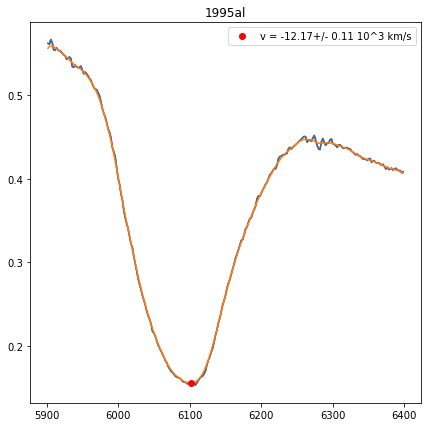

sn1995al-19951114.52-fast.flm 50035.52 54878.39 6.14043814792
Velocity: (-12.172468233516442, 6102.0, 0.11075786777571638)


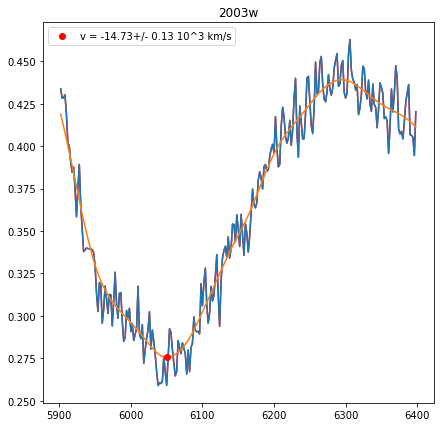

sn2003W-20030209.35-fast.flm 52679.35 54878.39 -0.442126087303
Velocity: (-14.733004167237274, 6050.0, 0.12882965658828227)


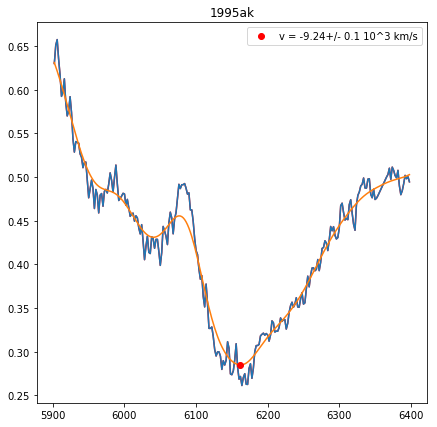

sn1995ak-19951114.25-fast.flm 50035.25 54878.39 14.7850973728
Velocity: (-9.242820430611571, 6162.0, 0.09709485835045624)


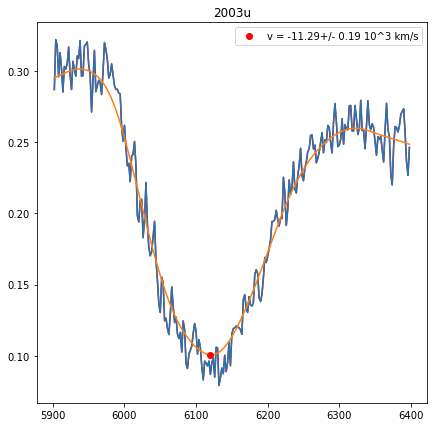

sn2003U-20030206.55-fast.flm 52676.55 54878.39 -0.734192257235
Velocity: (-11.290779369257717, 6120.0, 0.1909373586847244)


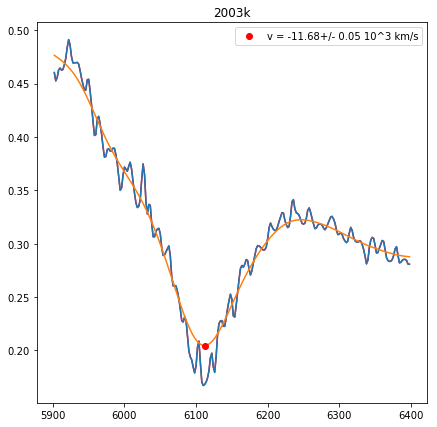

sn2003K-20030128-ui.flm 52667.561 54878.39 15.0222887705
Velocity: (-11.682345555808643, 6112.0, 0.04729813515883249)


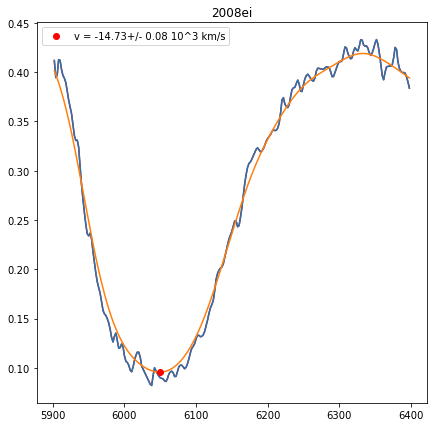

sn2008ei-20080726.314-ui.flm 54673.314 54878.39 3.29
Velocity: (-14.733004167237274, 6050.0, 0.08378634864490345)


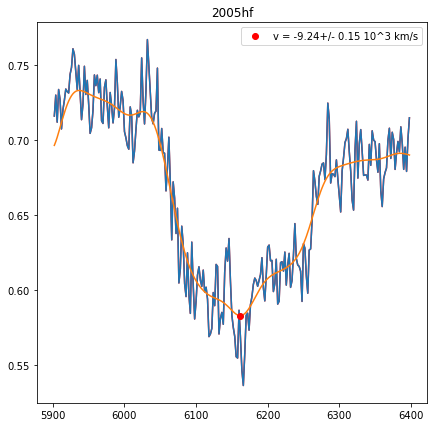

sn2005hf-20051027.27-fast.flm 53670.27 54878.39 8.46411212624
Velocity: (-9.242820430611571, 6162.0, 0.15491716402440367)


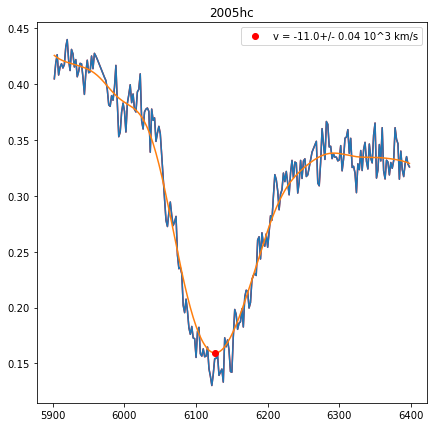

sn2005hc-20051030.32-fast.flm 53673.32 54878.39 5.32917758189
Velocity: (-10.997415134434632, 6126.0, 0.04388018588661124)


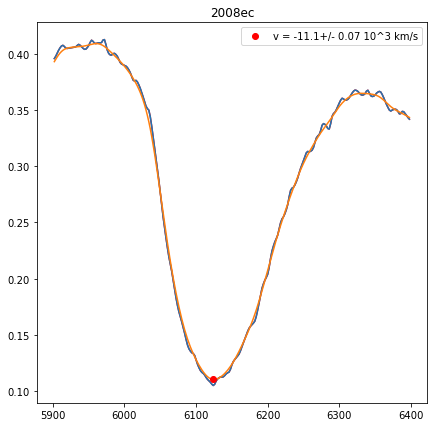

sn2008ec-20080726.359-ui-corrected.flm 54673.359 54878.39 -0.24
Velocity: (-11.095173645785795, 6124.0, 0.07098910816547568)


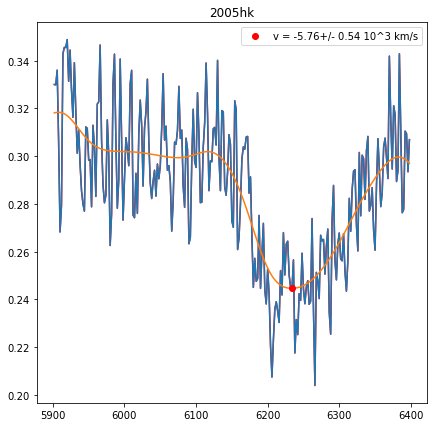

sn2005hk-20051109.22-fast.flm 53683.22 54878.39 -1.3366331258
Velocity: (-5.762417439647483, 6234.0, 0.5432445251929492)


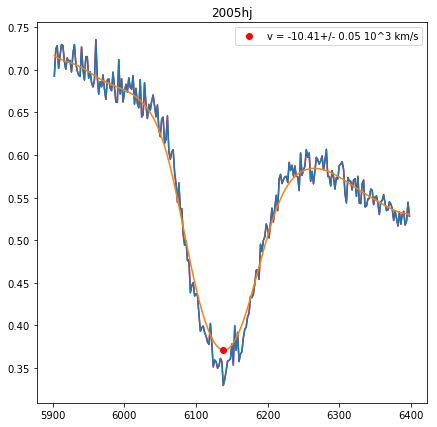

sn2005hj-20051108.457-deimos.flm 53682.457 54878.39 8.1523178808
Velocity: (-10.411485110219218, 6138.0, 0.04682470881120707)


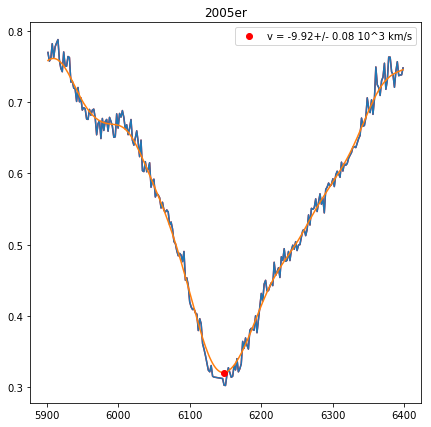

sn2005er-20051005.229-deimos.flm 53648.229 54878.39 -0.26
Velocity: (-9.92402359558339, 6148.0, 0.08063428678744029)


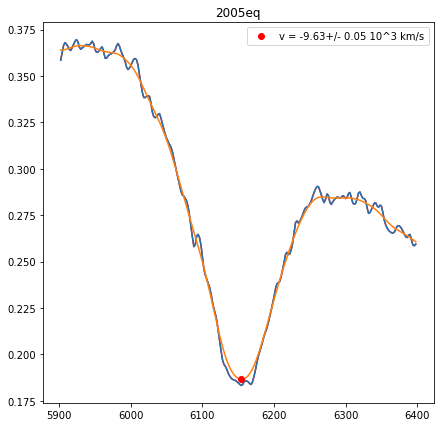

sn2005eq-20051011.376-ui-corrected.flm 53654.376 54878.39 0.202142516304
Velocity: (-9.631901785684354, 6154.0, 0.0486184293548261)


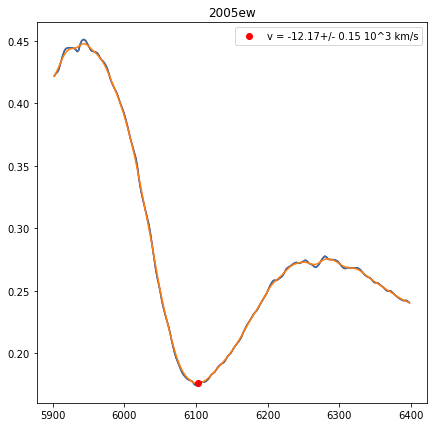

sn2005ew-20051011.536-ui.flm 53654.536 54878.39 17.6390827517
Velocity: (-12.172468233516442, 6102.0, 0.15016149196887543)


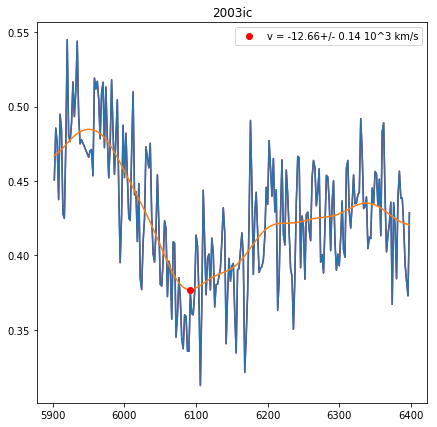

sn2003ic-20030919.40-fast.flm 52901.4 54878.39 -0.68676634409
Velocity: (-12.663329456693525, 6092.0, 0.1444726752342398)


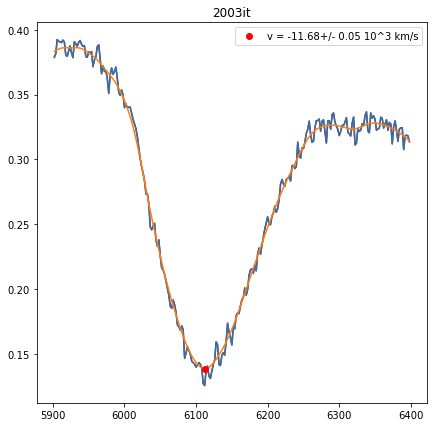

sn2003it-20031022.26-fast.flm 52934.26 54878.39 -0.279975143667
Velocity: (-11.682345555808643, 6112.0, 0.04896794167123719)


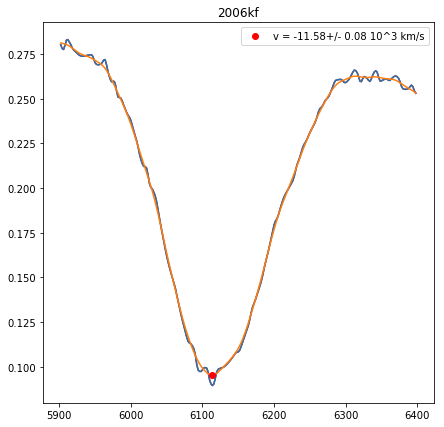

sn2006kf-20061030.385-ui.flm 54038.385 54878.39 -2.12082432113
Velocity: (-11.584409672466169, 6114.0, 0.08187864737404173)


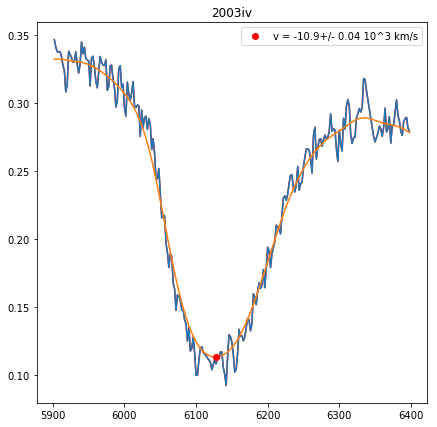

sn2003iv-20031021.38-fast.flm 52933.38 54878.39 -0.357727444562
Velocity: (-10.899686192972935, 6128.0, 0.040664394957806715)


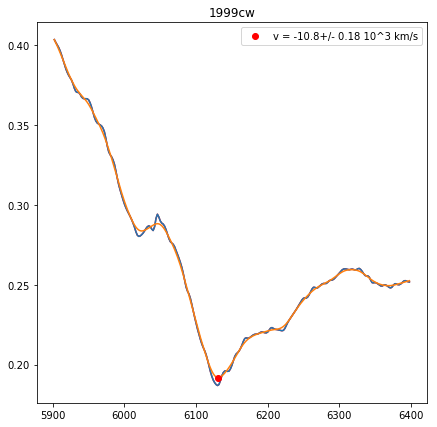

sn1999cw-19990709-ui.flm 51368.477 54878.39 14.3465050396
Velocity: (-10.801986823599174, 6130.0, 0.17532387580580203)


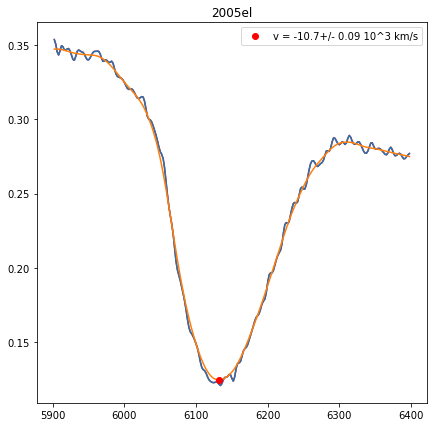

sn2005el-20051004.534-ui-corrected.flm 53647.534 54878.39 1.35775586012
Velocity: (-10.704317028490788, 6132.0, 0.09077887276339469)


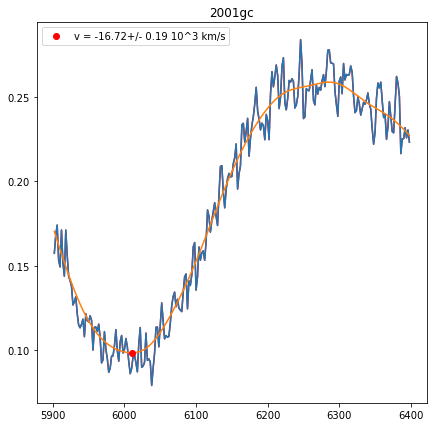

sn2001gc-20011122.26-fast.flm 52235.26 54878.39 -4.5011723847
Velocity: (-16.71620594290522, 6010.0, 0.18692201755462387)


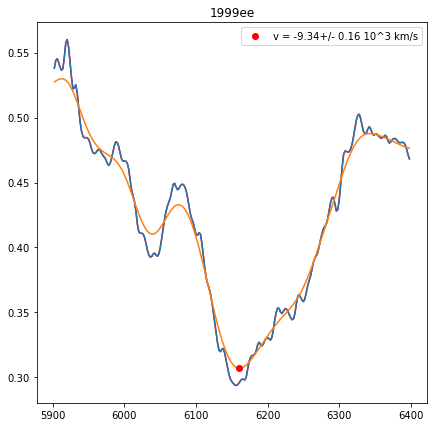

sn1999ee-19991105-ui.flm 51487.152 54878.39 17.8037699658
Velocity: (-9.340046364602408, 6160.0, 0.15835411091030985)


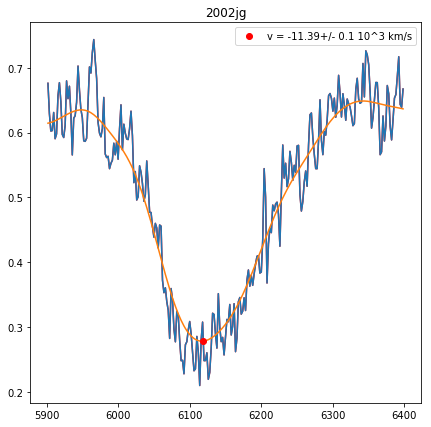

sn2002jg-20021128.09-fast.flm 52606.09 54878.39 -3.45817237068
Velocity: (-11.388626576876426, 6118.0, 0.0954065709900758)


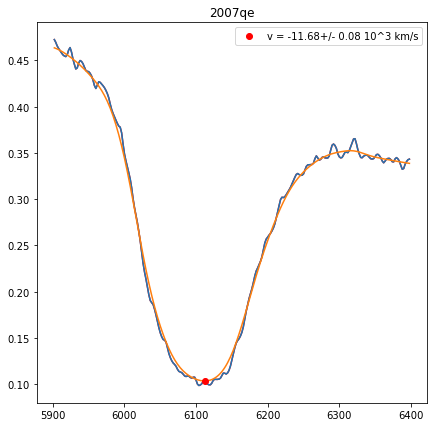

sn2007qe-20071201.176-ui.flm 54435.176 54878.39 6.18529411765
Velocity: (-11.682345555808643, 6112.0, 0.07776781966720689)


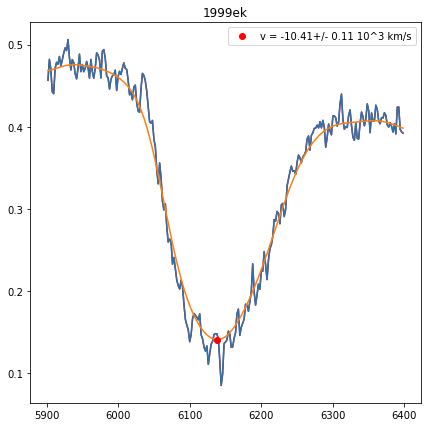

sn1999ek-19991103.40-fast.flm 51485.4 54878.39 3.11541175522
Velocity: (-10.411485110219218, 6138.0, 0.10850631933749834)


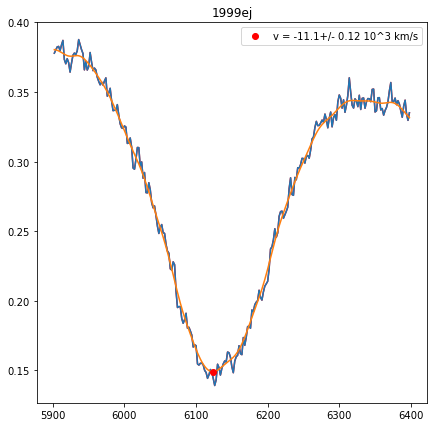

sn1999ej-19991030.28-fast.flm 51481.28 54878.39 -0.475475055813
Velocity: (-11.095173645785795, 6124.0, 0.12086935015241)


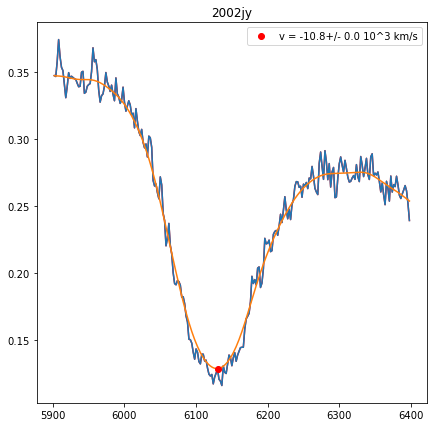

sn2002jy-20021226.12-fast.flm 52634.12 54878.39 -0.104943114943
Velocity: (-10.801986823599174, 6130.0, 5.329070518200751e-15)


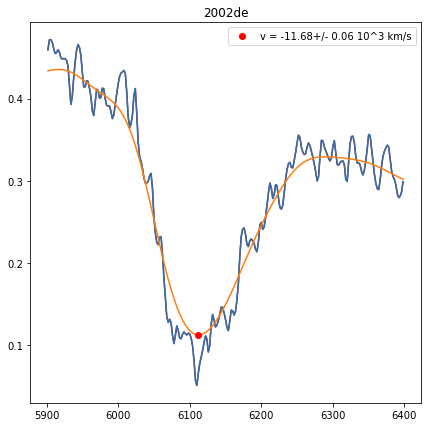

sn2002de-20020608.374-ui-corrected.flm 52433.374 54878.39 -0.16048772706
Velocity: (-11.682345555808643, 6112.0, 0.06078908210507246)


In [160]:
found_sne = []
vel_dict = {}
for spec in max_light_spec:
    w1 = 5900.
    w2 = 6400.
    if spec.name == '1997br' or spec.name == '2001ah':
        w2 = 6300.
    vexp, snr = sa.find_vexp(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], var_y=None)
    vel_data = sa.measure_velocity(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], w1, w2, vexp=vexp, clip=True, rest_wave=6355., varflux=None, plot=True, error=True, sn_name=spec.name)
    if ~np.isnan(vel_data[0]):
        vel_dict[spec.name] = [vel_data[0],vel_data[2]]
    print spec.filename, spec.mjd, mjd, spec.phase
    print 'Velocity:', vel_data

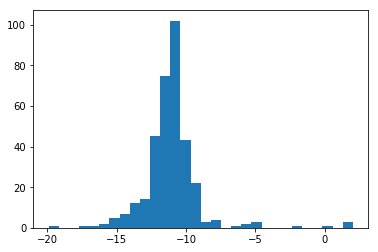

In [161]:
plt.hist(np.transpose(vel_dict.values())[0], bins = 30)
plt.show()

2000e -19.913781287400706
2000E_20000131_3274_7349_00.dat -1.94376710625


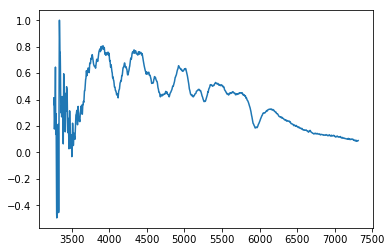

1995bd 2.0216308539835866
sn1995bd-19951228.25-fast.flm -6.94165188251


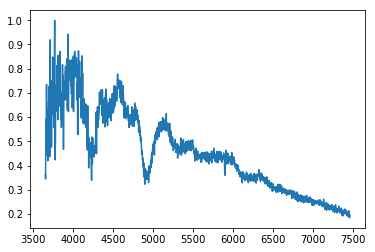

1993z -0.04717797720421123
sn1993z-19940317-ui.flm 0.83


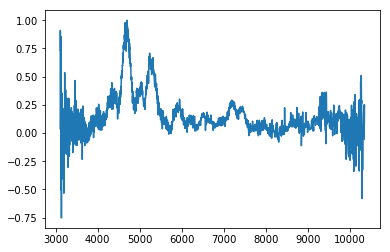

2008ha -1.845441575337562
sn2008ha-20081120-ui.flm 7.46


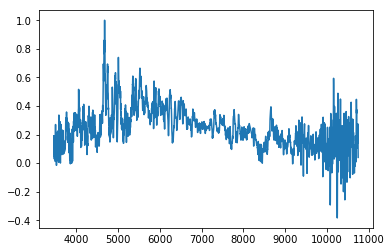

1999bh -6.243509518950409
sn1999bh-19990409.27-fast.flm 5.08255464729


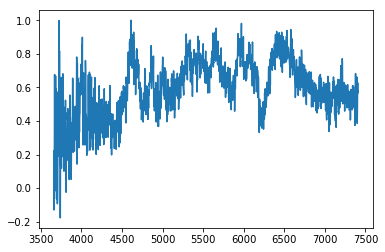

2005m -7.981578104319885
sn2005M-20050204.26-fast.flm 0.541095890411


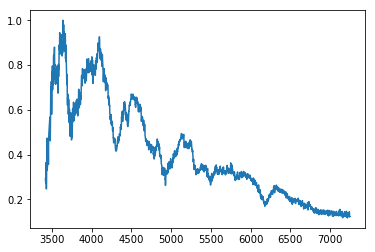

2005cc -5.186085714032509
sn2005cc-20050531.20-fast.flm 2.58046075119


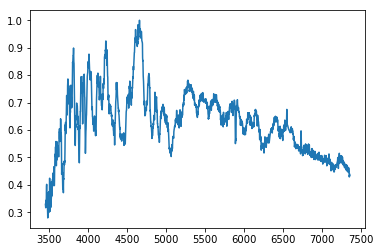

2008a -7.691233133814922
sn2008A-20080113.13-fast.flm 0.0295151255168


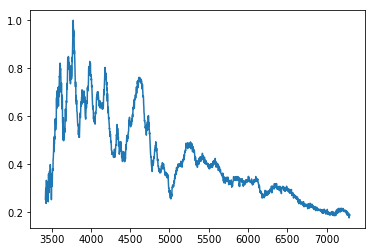

2002hu -7.787985159628715
sn2002hu-20021113.25-fast.flm -0.674757281553


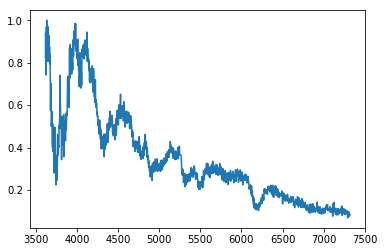

2002cx 2.0216308539835866
sn2002cx-20020517.23-fast.flm 12.6537775291


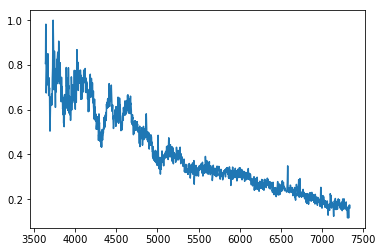

2007aj -4.61082195256962
sn2007aj-20070313.374-ui.flm 10.75


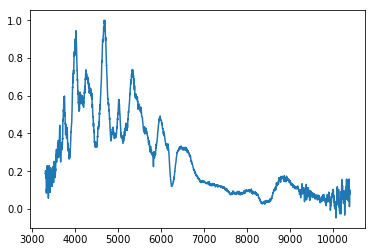

2003gq -5.762417439647483
sn2003gq-20030727-ui.flm -0.593275428607


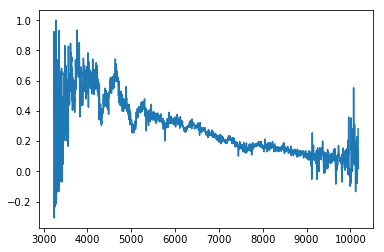

2008s5 -8.66008662171314
sn2008s5-20080922.302-ui.flm 1.26


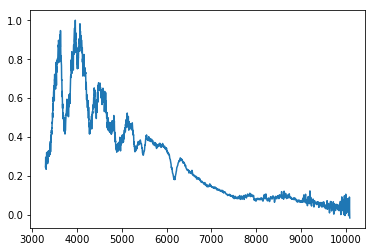

2007if -8.75713489105146
sn2007if-20070911.29-mmt.flm 10.8443492832


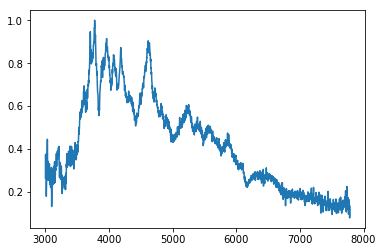

1997cn -8.95132027359566
sn1997cn-19970529.27-fast.flm 10.9634469762


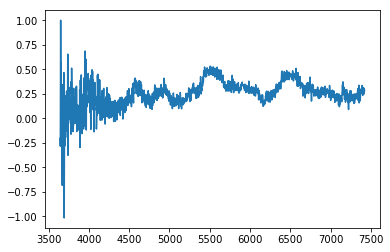

2001dw -8.85421277559375
sn2001dw-20010912-ui.flm 11.06


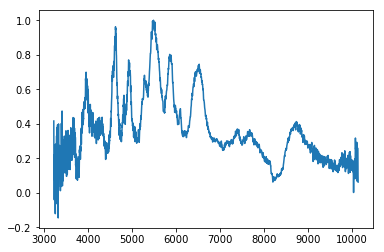

2001ic -5.090134250451365
sn2001ic-20011211-ui.flm 11.8067067151


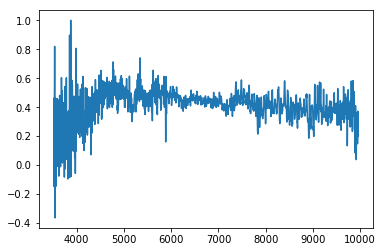

2002es -8.95132027359566
sn2002es-20020903.45-fast.flm 8.6802213082


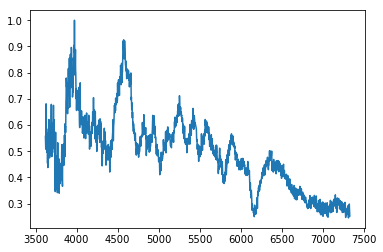

2008ae -7.691233133814922
sn2008ae-20080211.32-fast.flm -0.0776697520993


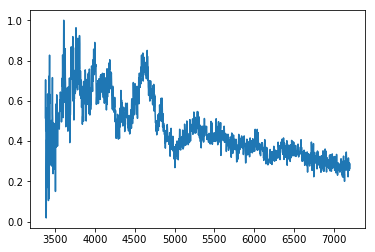

1995ac 2.0216308539835866
sn1995ac-19950927.31-fast.flm -4.98735780507


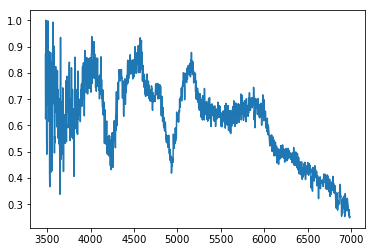

2005hk -5.762417439647483
sn2005hk-20051109.22-fast.flm -1.3366331258


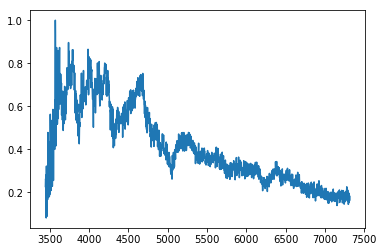

In [174]:
spec_ignore = ['1995bd', '1993z', '2008ha', '1999bh', '2005cc', '2002cx', '2007aj', '2003gq', '2005hk', '2001ic', '1995ac']
for sn in vel_dict:
    if vel_dict[sn][0] > -9 or sn == '2000e':
        print sn, vel_dict[sn][0]
        for spec in max_light_spec:
            if spec.name == sn:
                print spec.filename, spec.phase
                plt.plot(spec.wavelength, spec.flux)
                plt.show()

1996bo sn1996bo-19961103.27-fast.flm 3.27931700555 0.017285 -11.878305981858274
1996bl sn1996bl-19961018.18-fast.flm -2.0888030888 0.036 -12.466896361799964
1996bk sn1996bk-19961015.10-fast.flm 2.57881221657 0.006665 -11.878305981858274
2007gk sn2007gk-20070814.237-ui.flm -1.72 0.026632 -13.84440774713146
2007gi sn2007gi-20070814.173-ui.flm -0.35 0.00462 -15.623987686431857
2004e sn2004e-20040117-ui.flm 5.26 0.029834 -11.290779369257717
2004l sn2004L-20040127.40-fast.flm 3.59956836177 0.032346 -10.118919436719901
snf20080522-000 snf20080522-000-20080604.17-fast.flm -0.315789473686 0.045 -10.50906616967564
1993ac sn1993ac-19931016.49-mmt.flm 6.74928503336 0.049 -12.172468233516442
2007hj sn2007hj-20070905.30-fast.flm -0.591650042942 0.014113 -12.368724114647867
2005lz sn2005lz-20060101.381-deimos.flm 0.451002115207 0.044341 -11.486503345380463
2005ls sn2005ls-20051221.22-fast.flm 10.3220195903 0.021118 -10.899686192972935
2005lu sn2005lu-20051223.16-fast.flm 18.357398046 0.032009 -11.97

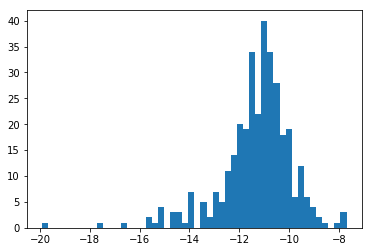

In [175]:
#ignore: 1995bd, 1993z, 2008ha, 1999bh(wrong z?), 2005cc, 2002cx, 2007aj, 2003gq, 2005hk, 2001ic, 1995ac
#1997br, 2001ah restrict to 6300

final_list = []
final_vels = []
for spec in max_light_spec:
    if spec.name not in spec_ignore and vel_dict.get(spec.name, None) != None:
        print spec.name, spec.filename, spec.phase, spec.event_data['Redshift'], vel_dict[spec.name][0]
        spec.velocity = vel_dict[spec.name][0]
        spec.velocity_err = vel_dict[spec.name][1]
        final_list.append(spec)
        final_vels.append(vel_dict[spec.name][0])
plt.hist(final_vels,bins=50)
plt.show()

In [180]:
kpora.save_spectra_as_flm(final_list, path = '../../Foundation/Spectra/Kaepora_vel_spectra/', undo_z=True)

0 ../../Foundation/Spectra/Kaepora_vel_spectra/sn1996bo-19961103.27-fast-kaepora.flm
1 ../../Foundation/Spectra/Kaepora_vel_spectra/sn1996bl-19961018.18-fast-kaepora.flm
2 ../../Foundation/Spectra/Kaepora_vel_spectra/sn1996bk-19961015.10-fast-kaepora.flm
3 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2007gk-20070814.237-ui-kaepora.flm
4 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2007gi-20070814.173-ui-kaepora.flm
5 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2004e-20040117-ui-kaepora.flm
6 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2004L-20040127.40-fast-kaepora.flm
7 ../../Foundation/Spectra/Kaepora_vel_spectra/snf20080522-000-20080604.17-fast-kaepora.flm
8 ../../Foundation/Spectra/Kaepora_vel_spectra/sn1993ac-19931016.49-mmt-kaepora.flm
9 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2007hj-20070905.30-fast-kaepora.flm
10 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2005lz-20060101.381-deimos-kaepora.flm
11 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2005ls-2005122

100 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2008R-20080202.13-fast-kaepora.flm
101 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2005cf-20050612.36-fast-kaepora.flm
102 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2008L-20080202.15-fast-kaepora.flm
103 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2007s1-20071102.133-ui-corrected-kaepora.flm
104 ../../Foundation/Spectra/Kaepora_vel_spectra/snf20080514-002-20080528.31-fast-kaepora.flm
105 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2008C-20080105.27-fast-kaepora.flm
106 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2008A-20080113.13-fast-kaepora.flm
107 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2004ey-20041018-br-kaepora.flm
108 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2001en-20011011.39-fast-kaepora.flm
109 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2001eh-20010917.39-fast-kaepora.flm
110 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2004eo-20040924.242-ui-kaepora.flm
111 ../../Foundation/Spectra/Kaepora_

195 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2008dx-20080629.219-ui-kaepora.flm
196 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2005iq-20051107.215-deimos-kaepora.flm
197 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2008dt-20080707.395-ui-corrected-kaepora.flm
198 ../../Foundation/Spectra/Kaepora_vel_spectra/sn1999ac-19990312.53-fast-kaepora.flm
199 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2002G-20020122.52-fast-kaepora.flm
200 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2007nq-20071031.24-fast-kaepora.flm
201 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2005na-20060105.335-ui-kaepora.flm
202 ../../Foundation/Spectra/Kaepora_vel_spectra/snf20080623-001-20080630.31-fast-kaepora.flm
203 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2005mc-20051227.37-fast-kaepora.flm
204 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2004fu-20041119.07-fast-kaepora.flm
205 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2004fz-20041119-ui-corrected-kaepora.flm
206 ../../Foundation/S

293 ../../Foundation/Spectra/Kaepora_vel_spectra/sn1994ae-19941129.51-fast-kaepora.flm
294 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2002ar-20020211-ui-kaepora.flm
295 ../../Foundation/Spectra/Kaepora_vel_spectra/sn1990o-19900717-opt2-kaepora.flm
296 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2002aw-20020218.52-fast-kaepora.flm
297 ../../Foundation/Spectra/Kaepora_vel_spectra/sn1991bg-19911213-noz-kaepora.flm
298 ../../Foundation/Spectra/Kaepora_vel_spectra/sn1990y-19900830-opt2-kaepora.flm
299 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2007cs-20070707.463-ui-kaepora.flm
300 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2007cp-20070623.217-ui-kaepora.flm
301 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2007cq-20070625.45-fast-kaepora.flm
302 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2008bf-20080330.31-fast-kaepora.flm
303 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2007cg-20070514.24-fast-kaepora.flm
304 ../../Foundation/Spectra/Kaepora_vel_spectra/sn2006gj-2006

# Additional CSP Spectra

In [5]:
import glob

SN2006ef 0.017006


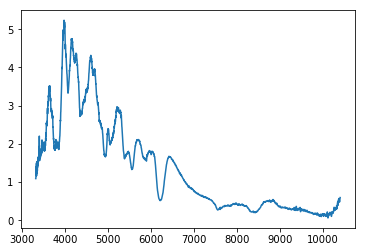

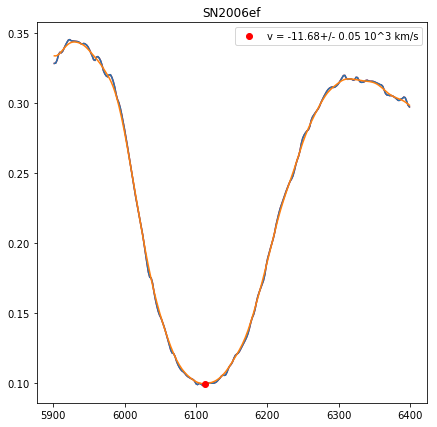

None
Velocity: (-11.679488546495927, 6112.05833593902, 0.04914457514817498)
SN2004eo 0.015701


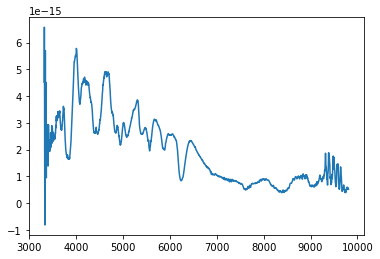

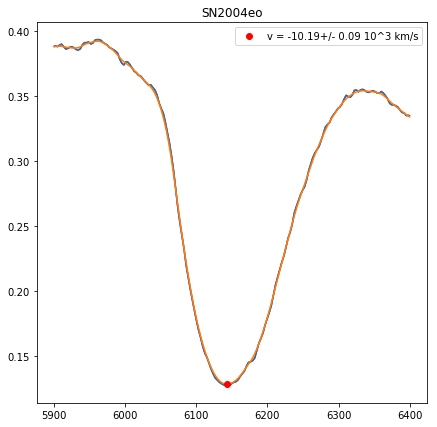

None
Velocity: (-10.186862776161068, 6142.606116366923, 0.09137238239507067)
SN2009dc 0.02158


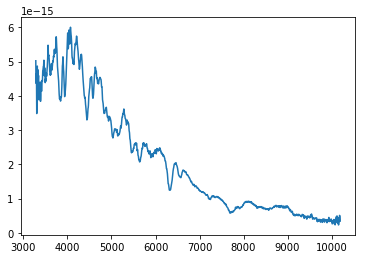

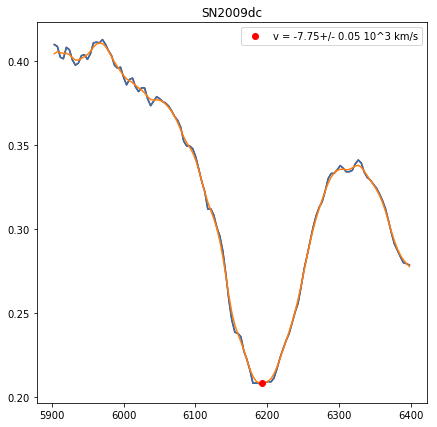

None
Velocity: (-7.745812822630066, 6192.87168601578, 0.05175482164291438)
SN2008cf 0.046029


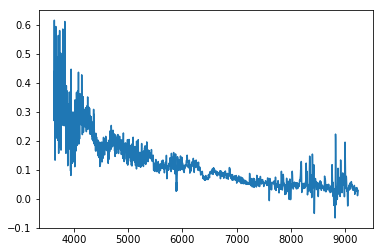

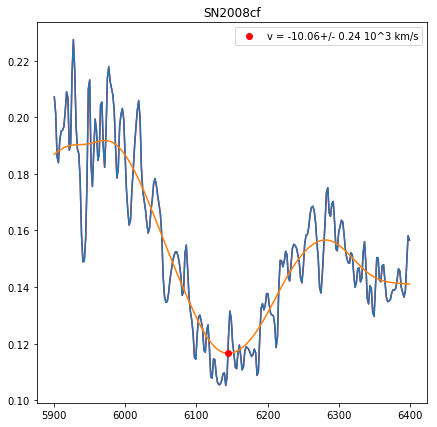

None
Velocity: (-10.063112783454798, 6145.14511547959, 0.23805222298470288)
SN2007ai 0.03166


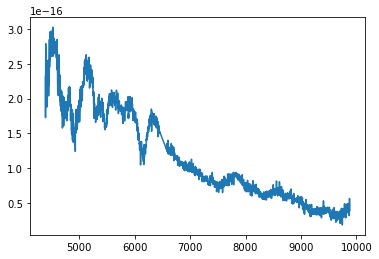

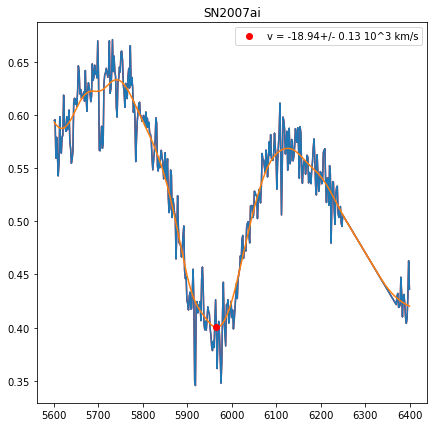

None
Velocity: (-18.94217111144336, 5965.383459666945, 0.1301828669294139)
SN2004dt 0.01973


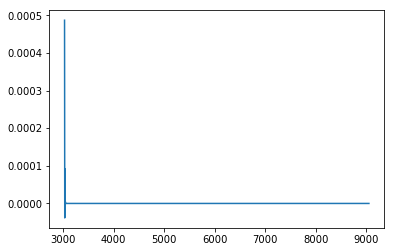

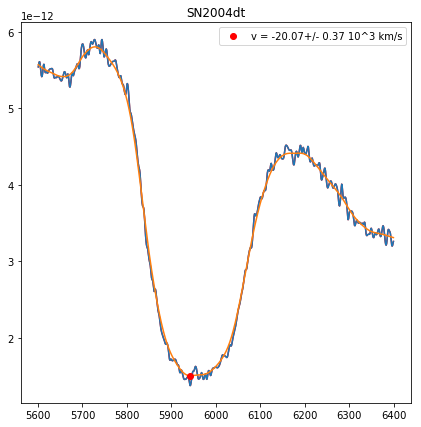

None
Velocity: (-20.065820923773472, 5942.971792533317, 0.3714179758913821)
SN2008bz 0.060278


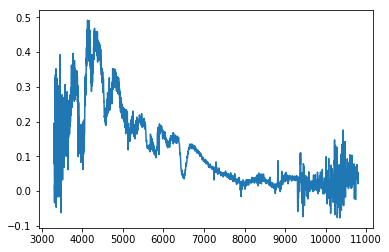

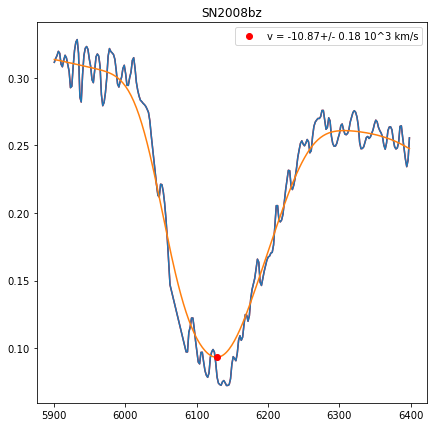

None
Velocity: (-10.871283302591252, 6128.581372055253, 0.17903579481382154)
SN2005hj 0.056948


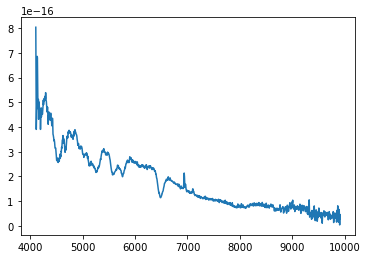

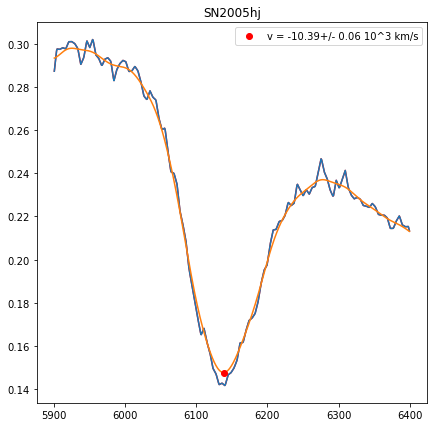

None
Velocity: (-10.385631569635715, 6138.529990122504, 0.06183356387401526)
SN2008cd 0.007412


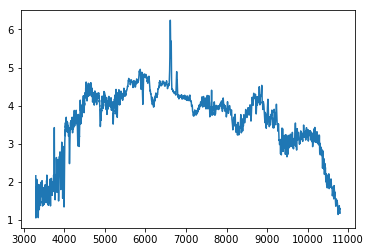

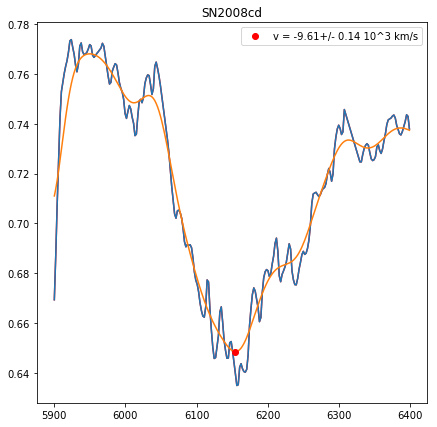

None
Velocity: (-9.6132292707017, 6154.383707956626, 0.143271601034727)
SN2006ej 0.019333


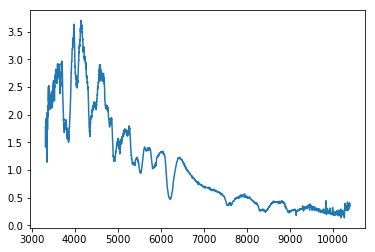

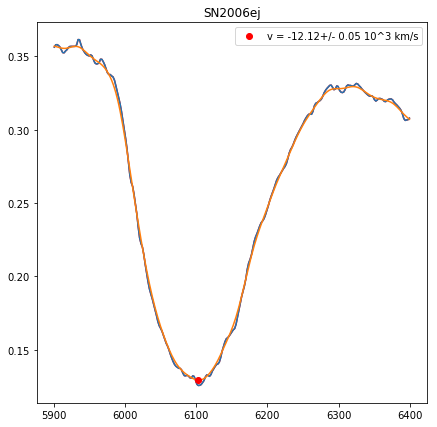

None
Velocity: (-12.12290788353392, 6103.010498041366, 0.05280448679889381)


In [25]:
new_spec_files = glob.glob("../../Foundation/Spectra/spec_for_matt/*.dat")
found_sne = []
vel_dict = {}

for new_f in new_spec_files:
    data = np.genfromtxt(new_f, unpack=True)
    with open(new_f) as f:
        lines = f.readlines()
        sn_name = lines[0].split()[1]
        z = float(lines[2].split()[1])
        print sn_name, z
    plt.plot(data[0],data[1])
    plt.show()
    
    spec = composite.spectrum(wavelength = data[0]/(1.+z), flux = data[1])
    w1 = 5900.
    w2 = 6400.
    if sn_name == 'SN2007ai' or sn_name == 'SN2004dt':
        w1 = 5600.
    spec.name = sn_name
    vexp, snr = sa.find_vexp(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], var_y=None)
    vel_data = sa.measure_velocity(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], w1, w2, vexp=vexp, clip=True, rest_wave=6355., varflux=None, plot=True, error=True, sn_name=spec.name)
    if ~np.isnan(vel_data[0]):
        vel_dict[spec.name] = [vel_data[0],vel_data[2]]
    print spec.filename
    print 'Velocity:', vel_data

In [28]:
for sn in vel_dict:
    print sn, np.round(vel_dict[sn][0],2), np.round(vel_dict[sn][1],2)

SN2005hj -10.39 0.06
SN2009dc -7.75 0.05
SN2008bz -10.87 0.18
SN2007ai -18.94 0.13
SN2004eo -10.19 0.09
SN2004dt -20.07 0.37
SN2006ef -11.68 0.05
SN2008cd -9.61 0.14
SN2008cf -10.06 0.24
SN2006ej -12.12 0.05


# Extra spectra

SN2006X 0.003192


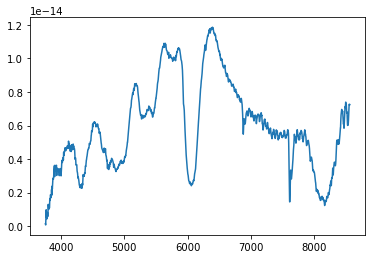

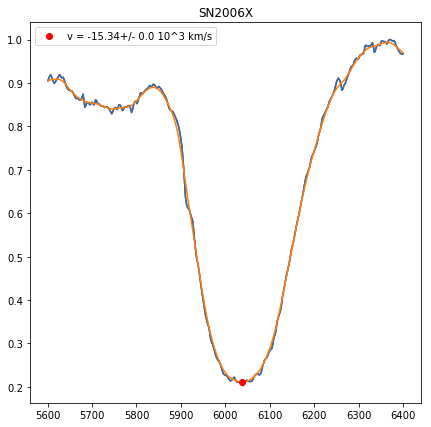

None
Velocity: (-15.344748116812438, 6037.636124490626, 3.552713678800501e-15)
SN2006cp 0.023319


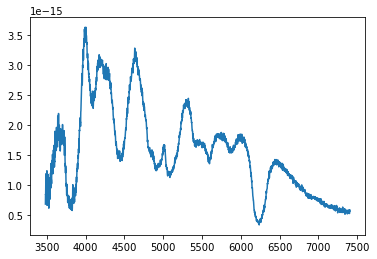

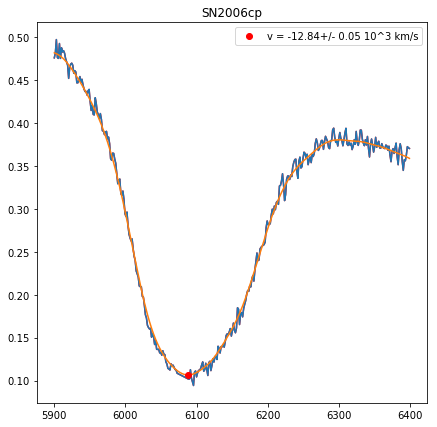

None
Velocity: (-12.837597807334369, 6088.453356187073, 0.047332383978720576)
SN2006ob 0.059238


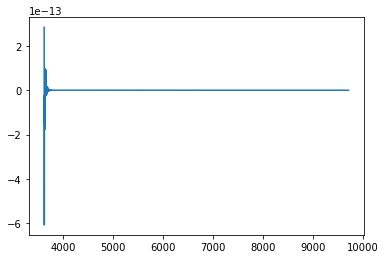

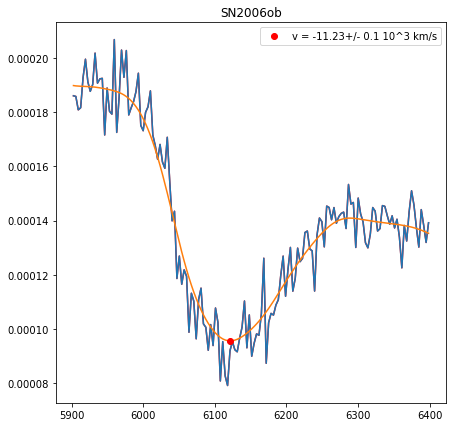

None
Velocity: (-11.232665324377583, 6121.188139020693, 0.09641194177339384)
SN2008hj 0.03789


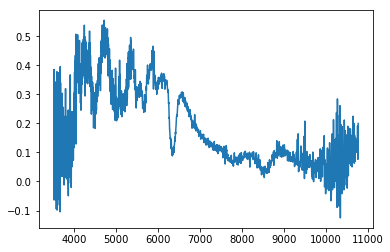

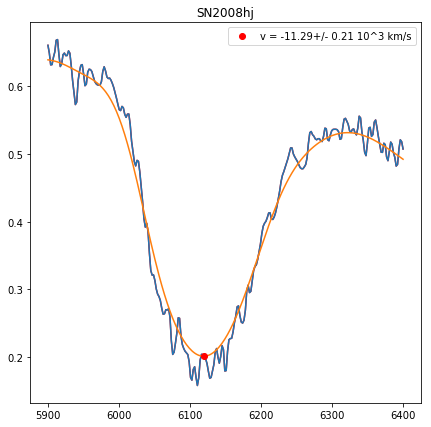

None
Velocity: (-11.285444247317955, 6120.1090674348925, 0.20521250275684205)
SN2005na 0.026815


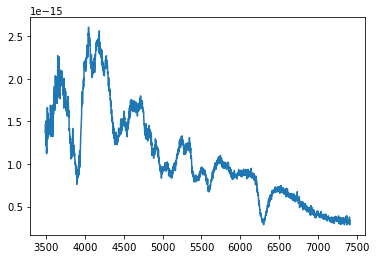

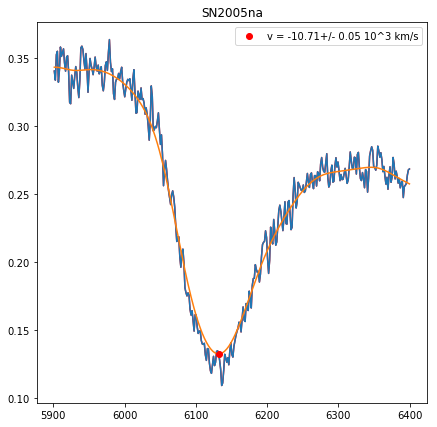

None
Velocity: (-10.713807673436225, 6131.805631978496, 0.05331214797744174)
SN2005mc 0.026006


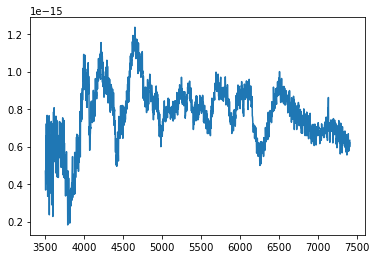

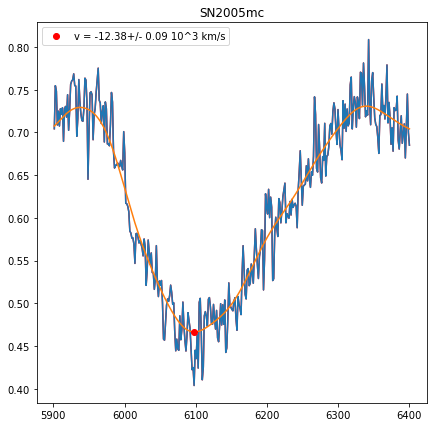

None
Velocity: (-12.384729440311396, 6097.673892745267, 0.08931960292625347)
SN2006dm 0.020814


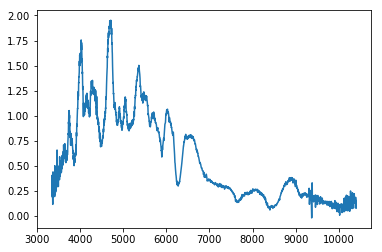

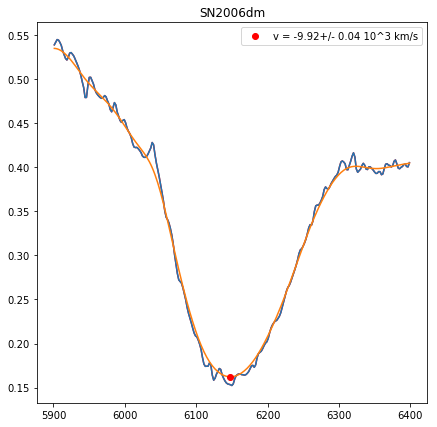

None
Velocity: (-9.922328345888747, 6148.034803597912, 0.036658130787841456)
SN2000cn 0.023493


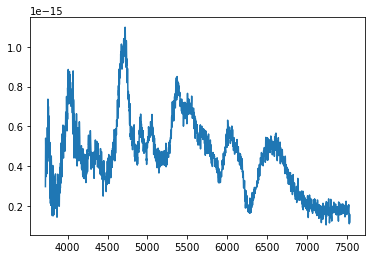

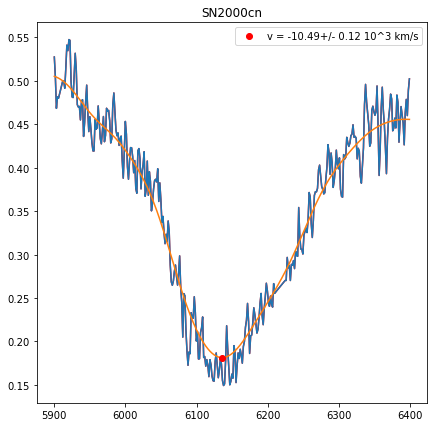

None
Velocity: (-10.492524676167442, 6136.33898815136, 0.11735250032536831)
SN2008fr 0.01973


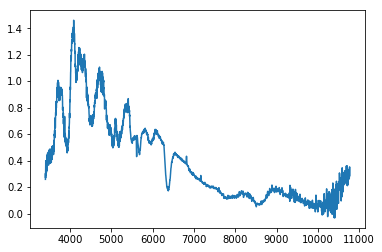

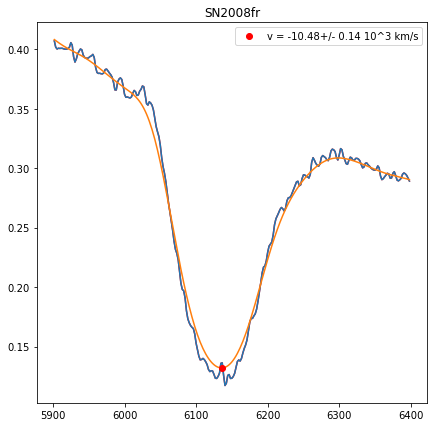

None
Velocity: (-10.476379324727903, 6136.6698748796925, 0.14059368843321696)
SN2007al 0.01211


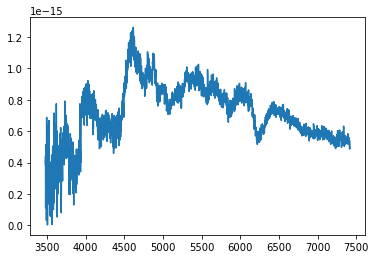

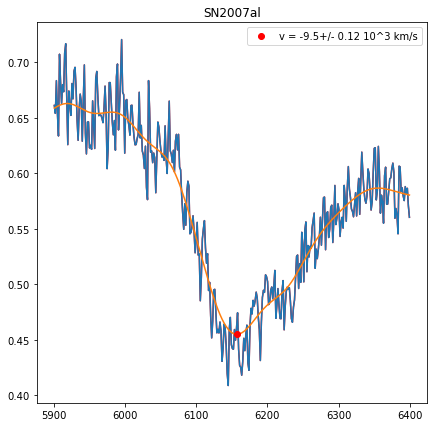

None
Velocity: (-9.498017177582508, 6156.751736471332, 0.11561314496832759)
SN2007cg 0.033196


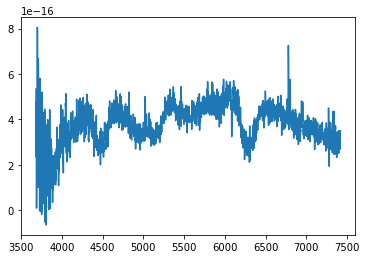

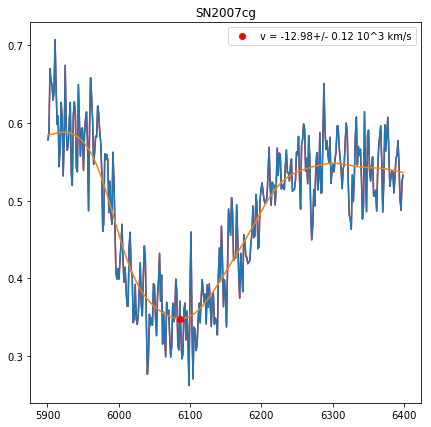

None
Velocity: (-12.976800992727664, 6085.621701981037, 0.12014187502293093)
SN2007jd 0.072673


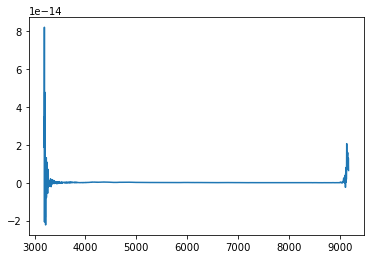

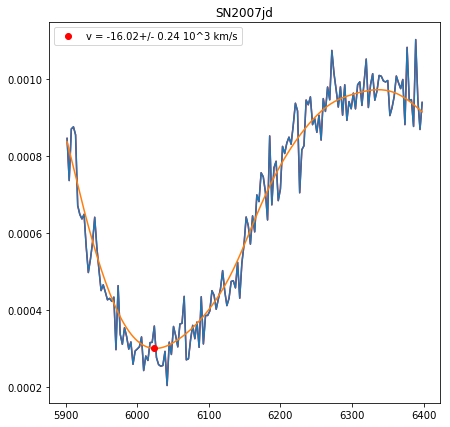

None
Velocity: (-16.02429895610103, 6023.928403157346, 0.24029578747277452)
SN2006py 0.056643


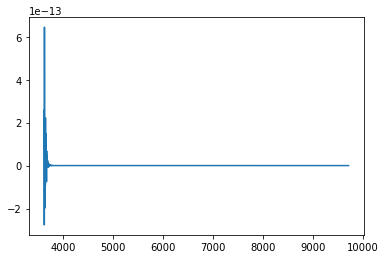

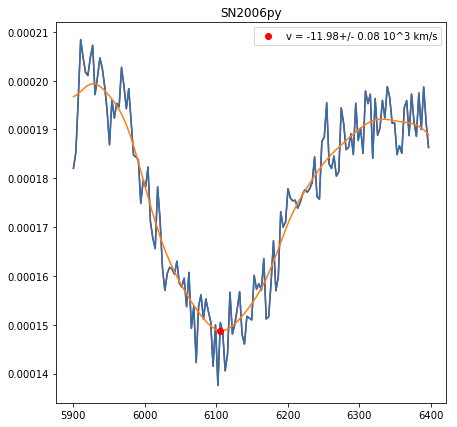

None
Velocity: (-11.980228296182656, 6105.920485916246, 0.07711200343772848)


In [9]:
new_spec_files = glob.glob("../../Foundation/Spectra/extra_extraSpec/*.dat")
found_sne = []
vel_dict = {}

for new_f in new_spec_files:
    data = np.genfromtxt(new_f, unpack=True)
    with open(new_f) as f:
        lines = f.readlines()
        sn_name = lines[0].split()[1]
        z = float(lines[2].split()[1])
        print sn_name, z
    plt.plot(data[0],data[1])
    plt.show()
    
    if sn_name == 'SN2008fr':
        z = 0.039
        
    spec = composite.spectrum(wavelength = data[0]/(1.+z), flux = data[1])
    w1 = 5900.
    w2 = 6400.
    if sn_name == 'SN2006X':
        w1 = 5600.
    spec.name = sn_name
    vexp, snr = sa.find_vexp(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], var_y=None)
    vel_data = sa.measure_velocity(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], w1, w2, vexp=vexp, clip=True, rest_wave=6355., varflux=None, plot=True, error=True, sn_name=spec.name)
    if ~np.isnan(vel_data[0]):
        vel_dict[spec.name] = [vel_data[0],vel_data[2]]
    print spec.filename
    print 'Velocity:', vel_data

In [10]:
for sn in vel_dict:
    print sn, np.round(vel_dict[sn][0],2), np.round(vel_dict[sn][1],2)

SN2007jd -16.02 0.24
SN2005mc -12.38 0.09
SN2008hj -11.29 0.21
SN2007cg -12.98 0.12
SN2007al -9.5 0.12
SN2006cp -12.84 0.05
SN2006ob -11.23 0.1
SN2008fr -10.48 0.14
SN2006py -11.98 0.08
SN2006X -15.34 0.0
SN2006dm -9.92 0.04
SN2005na -10.71 0.05
SN2000cn -10.49 0.12


# New New New spectra

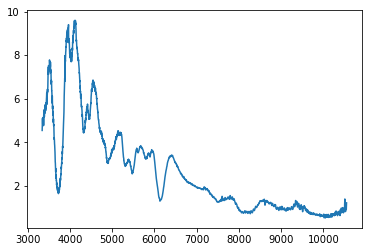

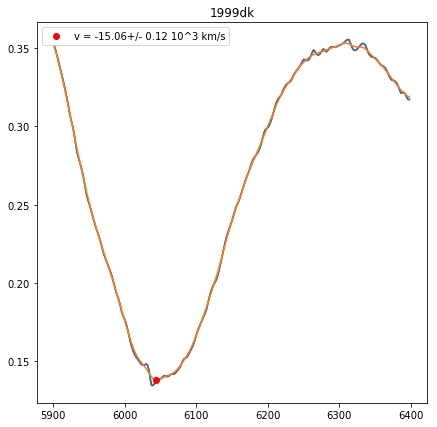

None
Velocity: (-15.061907340633443, 6043.3497536945815, 0.11843788308750645)


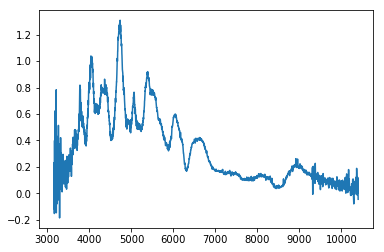

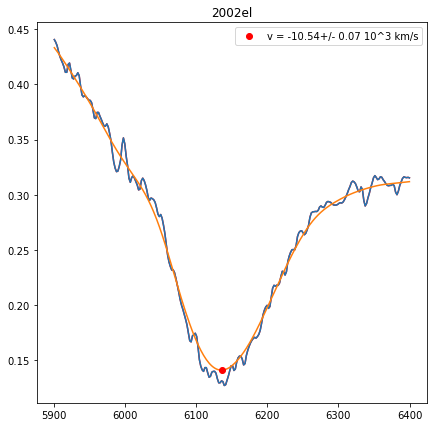

None
Velocity: (-10.538986097646228, 6135.386889135212, 0.06626358894715616)


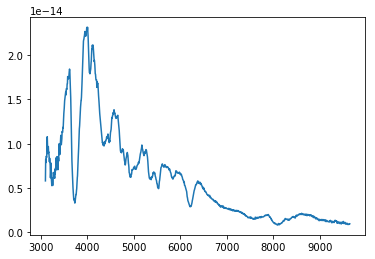

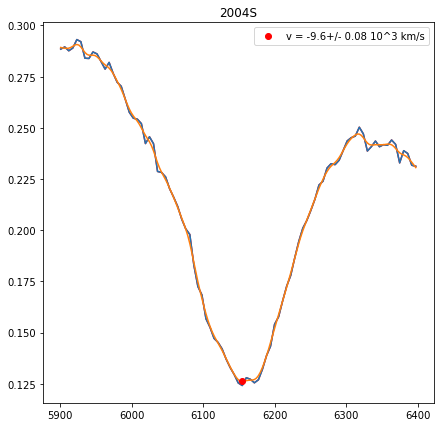

None
Velocity: (-9.603044418771637, 6154.593009431719, 0.08049327578849445)


In [10]:
new_spec_files = glob.glob("../../Foundation/Spectra/new_new_new_spec/*.flm")
found_sne = []
vel_dict = {}

for new_f in new_spec_files:
    data = np.genfromtxt(new_f, unpack=True)
#     with open(new_f) as f:
#         lines = f.readlines()
#         sn_name = lines[0].split()[1]
#         z = float(lines[2].split()[1])
#         print sn_name, z
    plt.plot(data[0],data[1])
    plt.show()
    if '1999dk' in new_f:
        z = 0.015
        sn_name = '1999dk'
    if '2004S' in new_f:
        z = 0.009360
        sn_name = '2004S'
    if '2002el' in new_f:
        z = 0.028460
        sn_name = '2002el'
    spec = composite.spectrum(wavelength = data[0]/(1.+z), flux = data[1])
    w1 = 5900.
    w2 = 6400.
    
    spec.name = sn_name
    vexp, snr = sa.find_vexp(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], var_y=None)
    vel_data = sa.measure_velocity(spec.wavelength[spec.x1:spec.x2], spec.flux[spec.x1:spec.x2], w1, w2, vexp=vexp, clip=True, rest_wave=6355., varflux=None, plot=True, error=True, sn_name=spec.name)
    if ~np.isnan(vel_data[0]):
        vel_dict[spec.name] = [vel_data[0],vel_data[2]]
    print spec.filename
    print 'Velocity:', vel_data

In [11]:
for sn in vel_dict:
    print sn, np.round(vel_dict[sn][0],2), np.round(vel_dict[sn][1],2)

2004S -9.6 0.08
2002el -10.54 0.07
1999dk -15.06 0.12
